In [36]:
# csed

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm


import os
import re

from scipy.stats import gaussian_kde, ks_2samp, mannwhitneyu

### Reading Data

In [37]:
DIR = "./data/raw/"
files = os.listdir(DIR)
files = sorted(files)


In [38]:
def get_df(f):
    """ Read in the grades excel file, skip first row """
    df = pd.read_excel(DIR + f)  # Skip the first two rows of metadata
    df = df.iloc[1:] # Remove the first row ("points out of")
    return df

def find_title(f):
    """ If file is in the format XX-Grades_<course>_X_<quarter>.xlsx, return <course>_<quarter> """
    match = re.search(r'(\d{4})\-\d+_(Fall|Winter|Spring|Summer)', f)
    year_term = f"{match.group(1)}_{match.group(2)}"
    return year_term

def get_score_col_name(df, score_type='exam'):
    """ Return the name of the final grade column that is a percentage. 
        If exam=False, return the final score column instead.
    """
    
    if score_type == 'total':
        return 'Total'
    if score_type == 'exam':
        cols = [x for x in df.columns if 'Final' in x]
        name = df[cols].sum().idxmin()
        return name
    if score_type == 'midterm':
        cols = [x for x in df.columns if 'Midterm' in x]
        name = df[cols].sum().idxmin()
        return name

def get_inperson_section_name(df):
    """ Return the name of the in-person value for the 'Section' column"""
    names = df['Section'].unique()
    for name in names:
        if not 'R' in name:
            return name
    return None

def get_remote_section_name(df):
    """ Return the name of the remote value for the 'Section' column"""
    names = df['Section'].unique()
    for name in names:
        if 'R' in name:
            return name
    return None

In [39]:
df = get_df(files[0])
midterm_columns = [x for x in df.columns if 'Midterm' in x]
midterm_columns

['Midterm (522851)', 'Midterm (522851).1']

Processing 01-Grades_CSE100_2022-4_Fall.xlsx
	MODE inperson = 0.904, remote = 0.888
	MEAN inperson = 0.82, remote = 0.823
	MED inperson median = 0.843, remote median = 0.857
	KS test: D=0.0544, p=0.88
	Mann-Whitney U: U=2.33e+04, p=0.482
Processing 02-Grades_CSE100_2023-1_Winter.xlsx
	MODE inperson = 0.853, remote = 0.851
	MEAN inperson = 0.804, remote = 0.807
	MED inperson median = 0.829, remote median = 0.829
	KS test: D=0.0527, p=0.877
	Mann-Whitney U: U=3.01e+04, p=0.779
Processing 03-Grades_CSE100_2023-4_Fall.xlsx
	MODE inperson = 0.759, remote = 0.76
	MEAN inperson = 0.712, remote = 0.687
	MED inperson median = 0.733, remote median = 0.7
	KS test: D=0.117, p=0.0664
	Mann-Whitney U: U=3.45e+04, p=0.0111
Processing 04-Grades_CSE100_2024-1_Winter.xlsx
2024_Winter in person side is empty
	MODE inperson = 0.759, remote = 0.87
	MEAN inperson = nan, remote = 0.771
	MED inperson median = nan, remote median = 0.8
	KS test: D=0.117, p=0.0664
	Mann-Whitney U: U=3.45e+04, p=0.0111
Processing

/Users/daniperry/anaconda3/envs/csed/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3824: RuntimeWarning: Mean of empty slice
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/daniperry/anaconda3/envs/csed/lib/python3.12/site-packages/numpy/_core/_methods.py:142: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


	MODE inperson = 0.823, remote = 0.79
	MEAN inperson = 0.76, remote = 0.73
	MED inperson median = 0.8, remote median = 0.75
	KS test: D=0.0818, p=0.454
	Mann-Whitney U: U=2.65e+04, p=0.164
Processing 06-Grades_CSE100_2024-4_Fall.xlsx
	MODE inperson = 0.96, remote = 0.944
	MEAN inperson = 0.909, remote = 0.896
	MED inperson median = 0.945, remote median = 0.92
	KS test: D=0.142, p=0.017
	Mann-Whitney U: U=3.07e+04, p=0.0104
Processing 07-Grades_CSE100_2025-1_Winter.xlsx
	MODE inperson = 0.955, remote = 0.952
	MEAN inperson = 0.916, remote = 0.898
	MED inperson median = 0.943, remote median = 0.93
	KS test: D=0.12, p=0.0589
	Mann-Whitney U: U=3.21e+04, p=0.0498
Processing 08-Grades_CSE100_2025-4_Fall.xlsx
	MODE inperson = 0.943, remote = 0.915
	MEAN inperson = 0.86, remote = 0.845
	MED inperson median = 0.917, remote median = 0.881
	KS test: D=0.161, p=0.0165
	Mann-Whitney U: U=1.8e+04, p=0.074


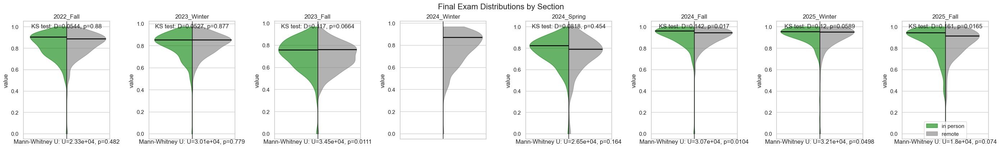

In [40]:
# INITIATE PLOT
fig, axes = plt.subplots(1, 8, figsize=(28, 4))

def generate_plots(score_type='exam'):
    
    for i in range(len(files)):
        print('Processing', files[i])
        ax = axes[i]
        file_name = files[i]
        title = find_title(file_name)
        df = get_df(file_name)

        inperson = get_inperson_section_name(df)
        remote = get_remote_section_name(df)
        score = get_score_col_name(df, score_type=score_type)

        # left and right are arrays of values for remote vs. in person
        left = df.loc[df["Section"] == inperson, score].dropna().to_numpy()
        right = df.loc[df["Section"] == remote, score].dropna().to_numpy()

        # If one of the sides is empty, skip
        try:
            y = np.linspace(min(left.min(), right.min()), max(left.max(), right.max()), 2000)
            skip_left = False
            skip_right = False
        except ValueError:
            if len(left) == 0:
                print(f"{title} in person side is empty")
                skip_left = True
            if len(right) == 0:
                print(f"{title} remote side is empty")
                skip_right = True

        # Get the kernel density estimates to draw the violin sides
        def kde_width_at(kde, y_grid, widths, y0):
            return float(np.interp(y0, y_grid, widths))

        # draw center line
        ax.axvline(0, color="black", linewidth=1)

        # ADD LEFT 
        if not skip_left:
            # Get the kernel density estimates to draw the violin sides
            kde_left = gaussian_kde(left)
            w_left = kde_left(y)
            ax.fill_betweenx(y, -w_left, 0, alpha=0.6, label='in person', color='green')
            
            # draw mode lines
            grid_l = np.linspace(left.min(), left.max(), 2000)  # dense grid helps
            dens_l = kde_left(grid_l)
            mode_est_l = grid_l[np.argmax(dens_l)]  # y-value where KDE is maximal
            wl = kde_width_at(kde_left, grid_l, dens_l, mode_est_l)
            ax.hlines(mode_est_l, xmin=-wl, xmax=0, linewidth=1.8, color="black")

        # ADD RIGHT
        if not skip_right:
            kde_right = gaussian_kde(right)
            w_right = kde_right(y)
            ax.fill_betweenx(y, 0, w_right, alpha=0.6, label='remote', color='grey')

            grid_r = np.linspace(right.min(), right.max(), 2000)  # dense grid helps
            dens_r = kde_right(grid_r)
            mode_est_r = grid_r[np.argmax(dens_r)]  # y-value where KDE is maximal
            wr = kde_width_at(kde_right, grid_r, dens_r, mode_est_r)
            ax.hlines(mode_est_r, xmin=0, xmax=wr, linewidth=1.8, color="black")


        
        if not skip_left and not skip_right:
            # KS test annotation
            ks = ks_2samp(left, right, alternative="two-sided", mode="auto")
            ax.text(
                0.5, 0.98,
                f"KS test: D={ks.statistic:.3g}, p={ks.pvalue:.3g}",
                transform=ax.transAxes,
                ha="center", va="top"
            )
            
            # Mann-Whitney U test annotation
            u, p = mannwhitneyu(left, right, alternative="two-sided") 
            ax.text(
                0.5, 0.0,
                f"Mann-Whitney U: U={u:.3g}, p={p:.3g}",
                transform=ax.transAxes,
                ha="center", va="top"
            )

        ax.set_xticks([])
        ax.set_ylabel("value")
        if score_type == 'total':
            ax.set_ylim(40, 100)
        ax.set_title(title)
        ax.set_xlim(-max(w_left.max() if not skip_left else 0, w_right.max() if not skip_right else 0)*1.1,
                         max(w_left.max() if not skip_left else 0, w_right.max() if not skip_right else 0)*1.1)
        print(f'\tMODE inperson = {mode_est_l:.3g}, remote = {mode_est_r:.3g}')
        print(f'\tMEAN inperson = {np.mean(left):.3g}, remote = {np.mean(right):.3g}')
        print(f'\tMED inperson median = {np.median(left):.3g}, remote median = {np.median(right):.3g}')
        print(f'\tKS test: D={ks.statistic:.3g}, p={ks.pvalue:.3g}')
        print(f'\tMann-Whitney U: U={u:.3g}, p={p:.3g}')
    plt.tight_layout()
    axes[-1].legend(loc='lower center', bbox_to_anchor=(0.5, -0.02))
    return fig

fig = generate_plots(score_type='exam')
fig.suptitle("Final Exam Distributions by Section", fontsize=16, y=1.03)
fig.savefig("out/final_exam_distributions.png", bbox_inches="tight", dpi=300)
plt.show()

Processing 01-Grades_CSE100_2022-4_Fall.xlsx
	MODE inperson = 95.8, remote = 95.9
	MEAN inperson = 89.4, remote = 90.8
	MED inperson median = 92.4, remote median = 94.3
	KS test: D=0.141, p=0.0235
	Mann-Whitney U: U=2.21e+04, p=0.105
Processing 02-Grades_CSE100_2023-1_Winter.xlsx
	MODE inperson = 95.3, remote = 95.4
	MEAN inperson = 89.3, remote = 90.7
	MED inperson median = 93.3, remote median = 93.9
	KS test: D=0.0972, p=0.199
	Mann-Whitney U: U=2.83e+04, p=0.424
Processing 03-Grades_CSE100_2023-4_Fall.xlsx
	MODE inperson = 94.5, remote = 93.3
	MEAN inperson = 89.8, remote = 88.9
	MED inperson median = 92.5, remote median = 91.8
	KS test: D=0.109, p=0.105
	Mann-Whitney U: U=3.36e+04, p=0.0508
Processing 04-Grades_CSE100_2024-1_Winter.xlsx
2024_Winter in person side is empty
	MODE inperson = 94.5, remote = 95.6
	MEAN inperson = nan, remote = 89.9
	MED inperson median = nan, remote median = 92.8
	KS test: D=0.109, p=0.105
	Mann-Whitney U: U=3.36e+04, p=0.0508
Processing 05-Grades_CSE10

/Users/daniperry/anaconda3/envs/csed/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3824: RuntimeWarning: Mean of empty slice
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/daniperry/anaconda3/envs/csed/lib/python3.12/site-packages/numpy/_core/_methods.py:142: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


	MODE inperson = 94.3, remote = 93.4
	MEAN inperson = 88.2, remote = 87.3
	MED inperson median = 92.1, remote median = 91.2
	KS test: D=0.0469, p=0.963
	Mann-Whitney U: U=2.46e+04, p=0.971
Processing 06-Grades_CSE100_2024-4_Fall.xlsx
	MODE inperson = 97, remote = 96.7
	MEAN inperson = 91.5, remote = 90.7
	MED inperson median = 95.5, remote median = 94.2
	KS test: D=0.0935, p=0.247
	Mann-Whitney U: U=2.95e+04, p=0.0821
Processing 07-Grades_CSE100_2025-1_Winter.xlsx
	MODE inperson = 94.6, remote = 93.4
	MEAN inperson = 88.2, remote = 86.3
	MED inperson median = 92.5, remote median = 90.7
	KS test: D=0.143, p=0.0142
	Mann-Whitney U: U=3.3e+04, p=0.00983
Processing 08-Grades_CSE100_2025-4_Fall.xlsx
	MODE inperson = 93.8, remote = 92.4
	MEAN inperson = 86.5, remote = 86.1
	MED inperson median = 91.4, remote median = 89.2
	KS test: D=0.0988, p=0.316
	Mann-Whitney U: U=1.71e+04, p=0.368


<Figure size 640x480 with 0 Axes>

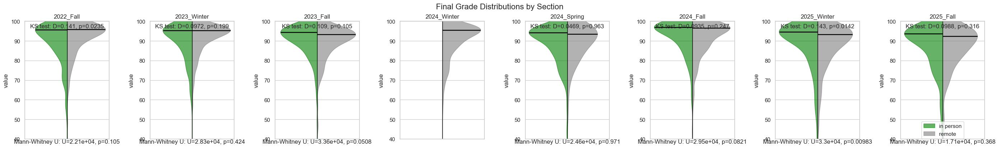

In [41]:
plt.clf()

fig, axes = plt.subplots(1, 8, figsize=(28, 4))
fig = generate_plots(score_type='total')
fig.suptitle("Final Grade Distributions by Section", fontsize=16, y=1.03)
fig.savefig("out/final_grade_distributions.png", bbox_inches="tight", dpi=300)
plt.show()

Processing 01-Grades_CSE100_2022-4_Fall.xlsx
	MODE inperson = 0.807, remote = 0.804
	MEAN inperson = 0.763, remote = 0.761
	MED inperson median = 0.8, remote median = 0.767
	KS test: D=0.0442, p=0.975
	Mann-Whitney U: U=2.47e+04, p=0.78
Processing 02-Grades_CSE100_2023-1_Winter.xlsx
	MODE inperson = 0.725, remote = 0.804
	MEAN inperson = 0.725, remote = 0.735
	MED inperson median = 0.733, remote median = 0.767
	KS test: D=0.0781, p=0.441
	Mann-Whitney U: U=2.78e+04, p=0.247
Processing 03-Grades_CSE100_2023-4_Fall.xlsx
	MODE inperson = 0.886, remote = 0.86
	MEAN inperson = 0.843, remote = 0.811
	MED inperson median = 0.867, remote median = 0.833
	KS test: D=0.13, p=0.0316
	Mann-Whitney U: U=3.48e+04, p=0.00611
Processing 04-Grades_CSE100_2024-1_Winter.xlsx
2024_Winter in person side is empty
	MODE inperson = 0.886, remote = 0.787
	MEAN inperson = nan, remote = 0.717
	MED inperson median = nan, remote median = 0.75
	KS test: D=0.13, p=0.0316
	Mann-Whitney U: U=3.48e+04, p=0.00611
Process

/Users/daniperry/anaconda3/envs/csed/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3824: RuntimeWarning: Mean of empty slice
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/daniperry/anaconda3/envs/csed/lib/python3.12/site-packages/numpy/_core/_methods.py:142: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


	MODE inperson = 0.813, remote = 0.824
	MEAN inperson = 0.768, remote = 0.734
	MED inperson median = 0.8, remote median = 0.8
	KS test: D=0.0775, p=0.522
	Mann-Whitney U: U=2.62e+04, p=0.231
Processing 06-Grades_CSE100_2024-4_Fall.xlsx
	MODE inperson = 0.988, remote = 0.973
	MEAN inperson = 0.928, remote = 0.905
	MED inperson median = 0.941, remote median = 0.941
	KS test: D=0.0752, p=0.503
	Mann-Whitney U: U=2.73e+04, p=0.805
Processing 07-Grades_CSE100_2025-1_Winter.xlsx
	MODE inperson = 0.981, remote = 0.989
	MEAN inperson = 0.933, remote = 0.937
	MED inperson median = 0.988, remote median = 0.988
	KS test: D=0.0541, p=0.855
	Mann-Whitney U: U=2.93e+04, p=0.865
Processing 08-Grades_CSE100_2025-4_Fall.xlsx
	MODE inperson = 0.982, remote = 0.975
	MEAN inperson = 0.909, remote = 0.896
	MED inperson median = 0.933, remote median = 0.933
	KS test: D=0.0855, p=0.49
	Mann-Whitney U: U=1.77e+04, p=0.121


<Figure size 640x480 with 0 Axes>

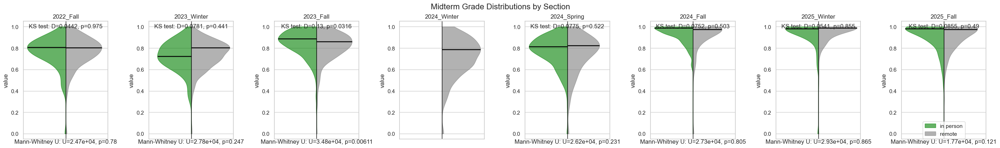

In [42]:
plt.clf()
fig, axes = plt.subplots(1, 8, figsize=(28, 4))
fig = generate_plots(score_type='midterm')
fig.suptitle("Midterm Grade Distributions by Section", fontsize=16, y=1.03)
fig.savefig("out/midterm_grade_distributions.png", bbox_inches="tight", dpi=300)
plt.show()

In [43]:
d = {
    
 '01-Grades_CSE100_2022-4_Fall.xlsx':   {'year': 2022, 'quarter': 'fall'},
 '02-Grades_CSE100_2023-1_Winter.xlsx': {'year': 2023, 'quarter': 'winter'},
 '03-Grades_CSE100_2023-4_Fall.xlsx':   {'year': 2023, 'quarter': 'fall'},
 '04-Grades_CSE100_2024-1_Winter.xlsx': {'year': 2024, 'quarter': 'winter'},
 '05-Grades_CSE100_2024-2_Spring.xlsx': {'year': 2024, 'quarter': 'spring'},
 '06-Grades_CSE100_2024-4_Fall.xlsx':   {'year': 2024, 'quarter': 'fall'},
 '07-Grades_CSE100_2025-1_Winter.xlsx': {'year': 2025, 'quarter': 'winter'},
 '08-Grades_CSE100_2025-4_Fall.xlsx':   {'year': 2025, 'quarter': 'fall'},
 
}

In [44]:
dfs = pd.DataFrame()
for i,f in enumerate(files):
    df = get_df(f)
    
    midterm_col = get_score_col_name(df, score_type='midterm')
    exam_col    = get_score_col_name(df, score_type='exam')
    total_col   = get_score_col_name(df, score_type='total')

    df = df[[midterm_col, exam_col, total_col, 'Section']]
    df.rename(columns={midterm_col: 'Midterm', exam_col: 'Final Exam', total_col: 'Total'}, inplace=True)
    df['year'] = d[f]['year']
    df['quarter'] = d[f]['quarter']
    df['Section'] = df['Section'].apply(lambda x: 'in person' if x == get_inperson_section_name(df) else 'remote')
    df['course'] = df['quarter'].astype(str) + df['year'].astype(str)
    dfs = pd.concat([dfs, df], ignore_index=True)
    df['exam_type'] = 'inperson'
    
dfs.head()

,Midterm,Final Exam,Total,Section,year,quarter,course
0,0.600000,0.785714,70.862857,in person,2022,fall,fall2022
1,0.933333,0.942857,98.738095,in person,2022,fall,fall2022
2,0.366667,0.642857,57.104762,in person,2022,fall,fall2022
3,0.533333,0.800000,87.606667,in person,2022,fall,fall2022
4,0.766667,0.685714,91.205714,in person,2022,fall,fall2022


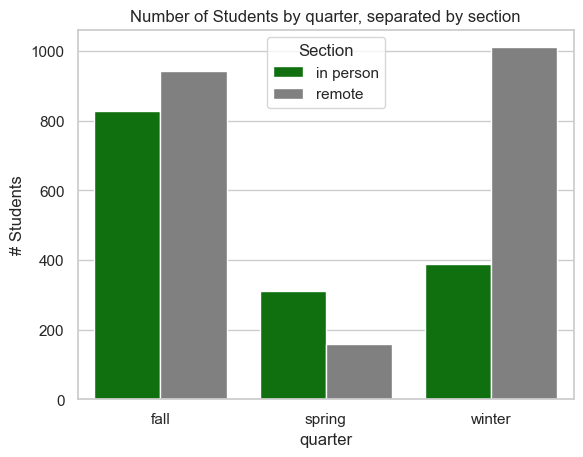

In [45]:
metric1 = 'quarter'
counts = (
    dfs
    .groupby([metric1, 'Section'])
    .size()
    .reset_index(name="count")
)

sns.barplot(
    data=counts,
    x=metric1,
    y="count",
    hue="Section",
    palette=["green", "grey"]
)

plt.ylabel("# Students")
plt.title("Number of Students by quarter, separated by section")
plt.show()


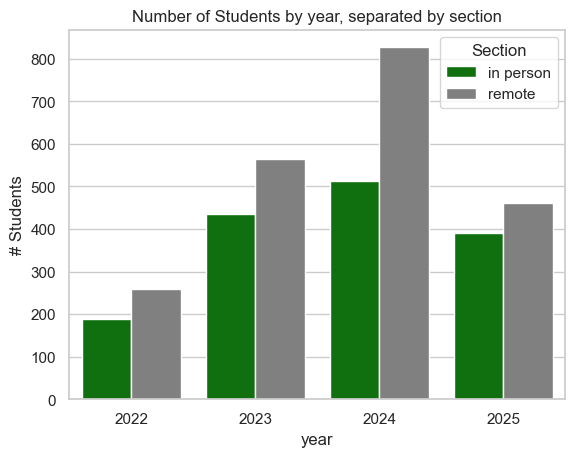

In [46]:

metric1 = 'year'
counts = (
    dfs
    .groupby([metric1, 'Section'])
    .size()
    .reset_index(name="count")
)

sns.barplot(
    data=counts,
    x=metric1,
    y="count",
    hue="Section",
    palette=["green", "grey"]
)

plt.ylabel("# Students")
plt.title("Number of Students by year, separated by section")
plt.show()


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/1958896624.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=45)


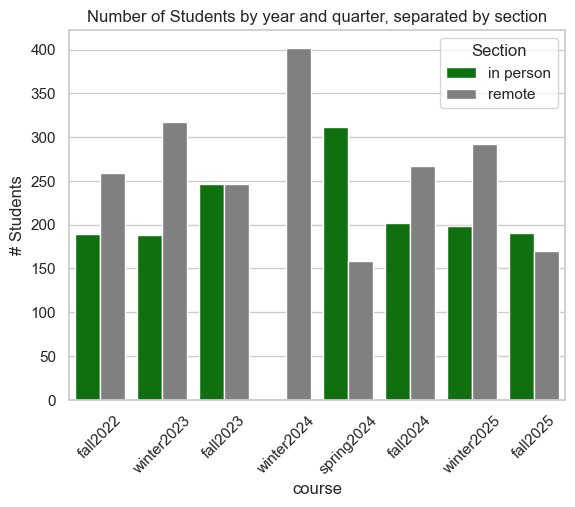

In [47]:

metric1 = 'year'
counts = (
    dfs
    .groupby(['course', 'Section'])
    .size()
    .reset_index(name="count")
)
order = ['fall2022', 'winter2023', 'fall2023', 'winter2024', 'spring2024', 'fall2024', 'winter2025', 'fall2025']

g = sns.barplot(
    data=counts,
    x='course',
    y="count",
    hue="Section",
    palette=["green", "grey"],
    order=order,
)

g.set_xticklabels(g.get_xticklabels(), rotation=45)

plt.ylabel("# Students")
plt.title("Number of Students by year and quarter, separated by section")
plt.show()

In [48]:
# columns you want to plot

metrics = ["Midterm", "Final Exam", "Total"]

# --- reshape wide -> long ---
df_long = dfs.melt(
    id_vars=["year", "quarter"],
    value_vars=metrics,
    var_name="assessment",
    value_name="score"
)

# (optional) make ordering nice
df_long["quarter"] = pd.Categorical(df_long["quarter"], ["winter", "spring", "fall"], ordered=True)
df_long["assessment"] = pd.Categorical(df_long["assessment"], metrics, ordered=True)

sns.set_theme(style="whitegrid")
plt.show()

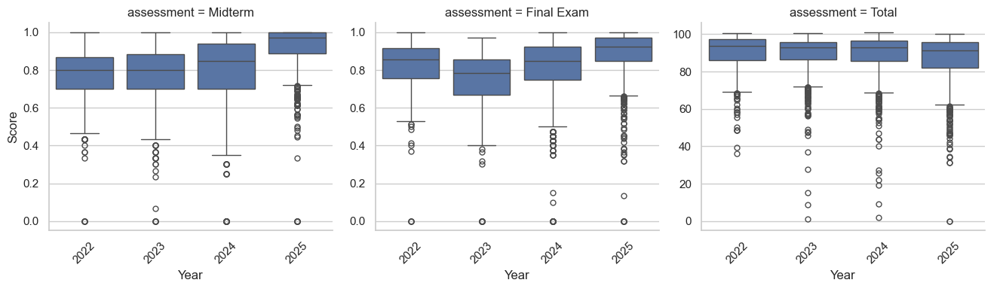

In [49]:
g = sns.catplot(
    data=df_long,
    x="year", y="score",
    col="assessment",
    kind="box",
    sharey=False,
    height=4, aspect=1.1
)

g.set_axis_labels("Year", "Score")
# g.set_titles("{col_name}")
for ax in g.axes.flat:
    ax.tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()


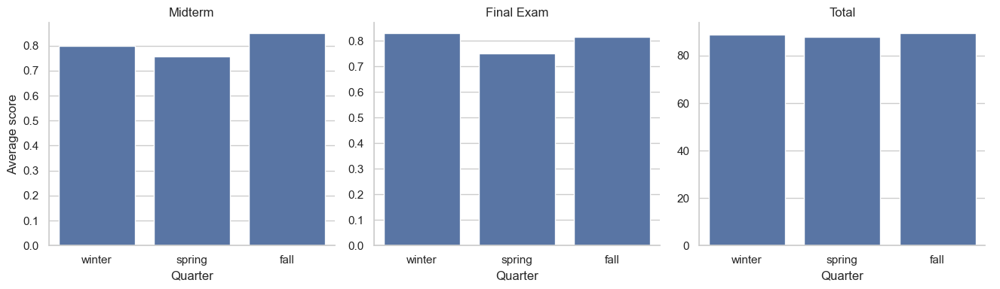

In [50]:
q_means = (
    df_long.groupby(["quarter", "assessment"], observed=True)["score"]
    .mean()
    .reset_index()
)

g = sns.catplot(
    data=q_means,
    x="quarter", y="score",
    col="assessment",
    kind="bar",
    sharey=False,
    height=4, aspect=1.1,
    errorbar='ci'
)

g.set_axis_labels("Quarter", "Average score")
g.set_titles("{col_name}")
plt.tight_layout()
plt.show()


<Axes: xlabel='Final Exam', ylabel='Total'>

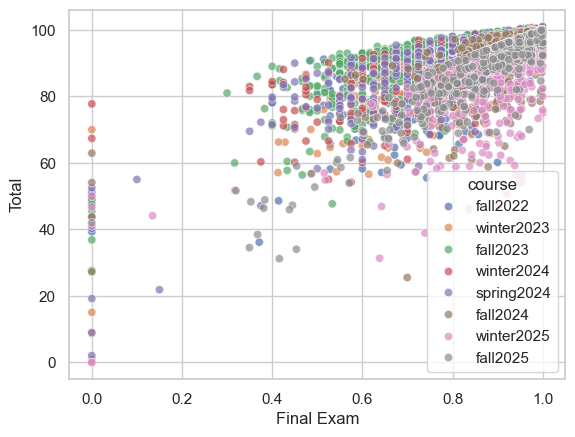

In [51]:
x = 'Final Exam'
y = 'Total'
hue = 'course'

sns.scatterplot(
    data=dfs,
    x=x,
    y=y,
    hue=hue,
    alpha=.7,
    # palette=["green", "grey"],
    markers='o'
)

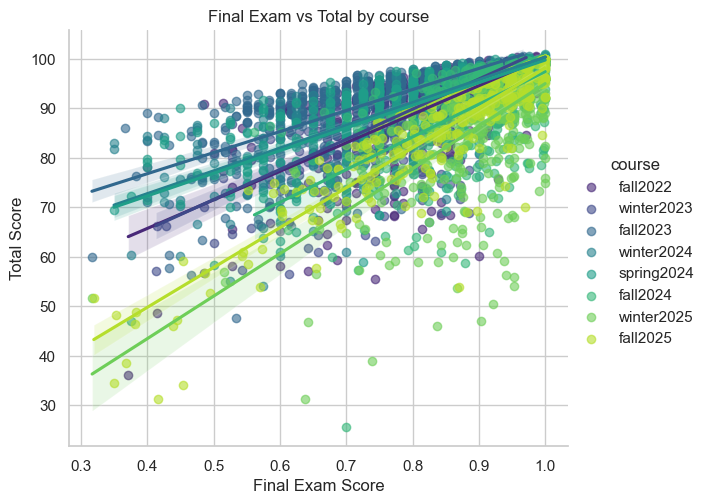

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt
# from sklearn.linear_model import LinearRegression

# Keep only the two sections you care about
sections = ['remote', 'in person']   # <-- replace with your actual section names
# df_plot = dfs[dfs['Section'].isin(sections)][['Final Exam', 'Total', 'Section']].dropna()
df_plot = dfs.dropna()
df_plot = dfs[dfs['Final Exam'] > 0.3]

# how to separate the data
hue = 'course'

# Plot
sns.lmplot(
    data=df_plot,
    x='Final Exam',
    y='Total',
    hue=hue,
    height=5,
    aspect=1.2,
    scatter_kws={'alpha': 0.6},
    palette='viridis',
)

plt.xlabel('Final Exam Score')
plt.ylabel('Total Score')
plt.title(f'Final Exam vs Total by {hue}')
plt.show()


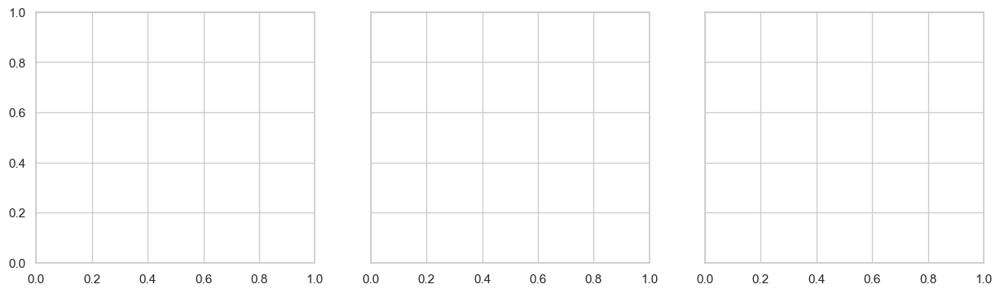

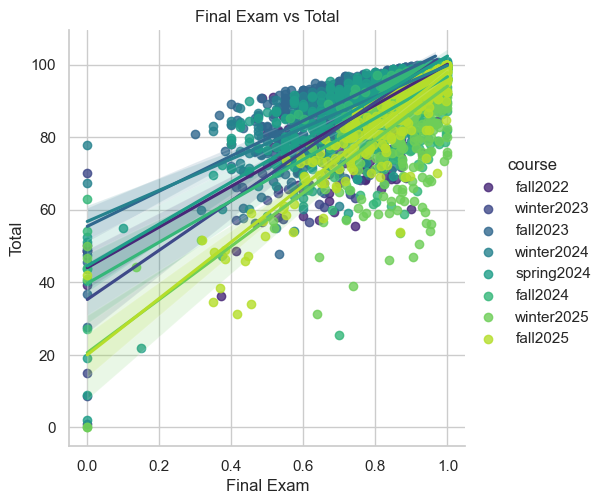

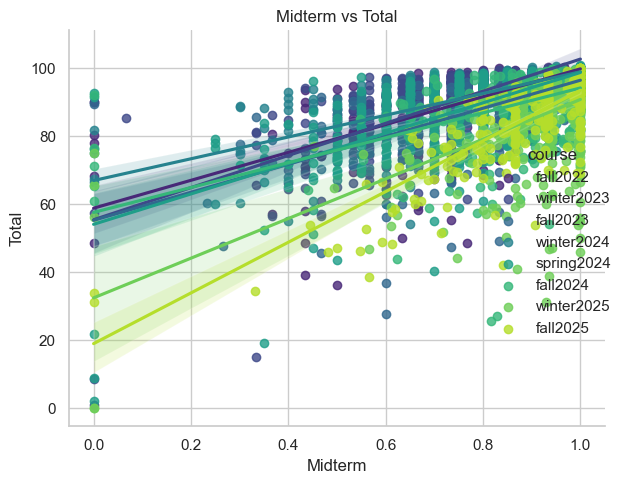

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

predictors = ['Final Exam', 'Midterm']   # change as needed

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for ax, x in zip(axes, predictors):
    g = sns.lmplot(
        data=dfs,
        x=x,
        y='Total',
        # ax=ax,
        hue='course',
        # scatter_kws={'alpha': 0.6},
        # line_kws={'color': 'black'},
        palette='viridis',
    )
    
    g.ax.set_xlabel(x)
    g.ax.set_title(f'{x} vs Total')

plt.tight_layout()
plt.show()


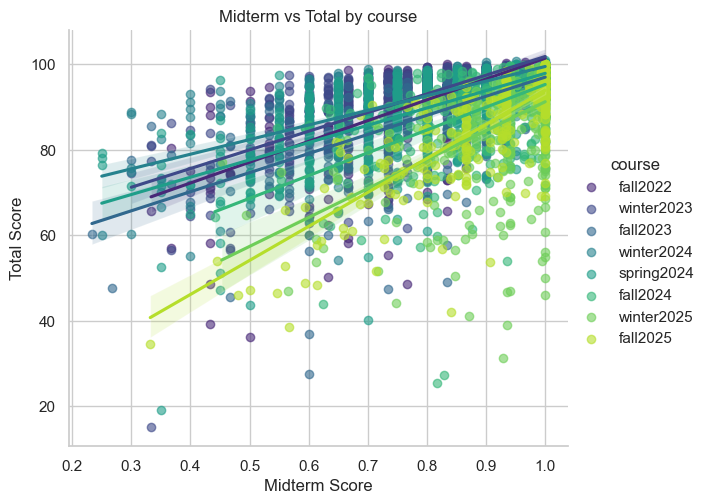

In [54]:
sections = ['remote', 'in person']   # <-- replace with your actual section names
# df_plot = dfs[dfs['Section'].isin(sections)][['Final Exam', 'Total', 'Section']].dropna()
df_plot = dfs.dropna()
df_plot = dfs[dfs['Midterm'] > 0.2]

# how to separate the data
hue = 'course'

# Plot
sns.lmplot(
    data=df_plot,
    x='Midterm',
    y='Total',
    hue=hue,
    height=5,
    aspect=1.2,
    scatter_kws={'alpha': 0.6},
    palette='viridis',
)

plt.xlabel('Midterm Score')
plt.ylabel('Total Score')
plt.title(f'Midterm vs Total by {hue}')
plt.show()

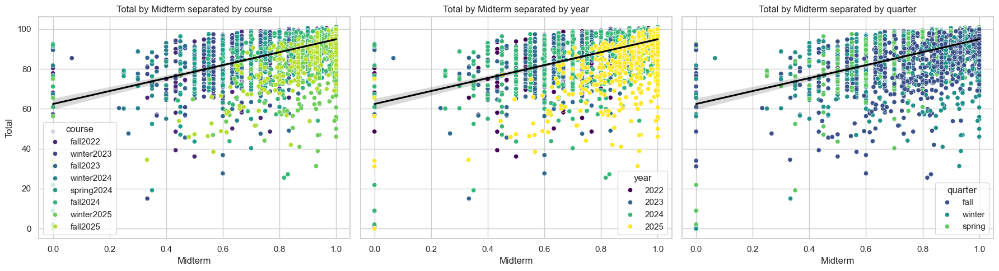

In [55]:
# The following code creates scatter plots of 'Midterm' vs 'Total' scores,
# separated by different categorical variables: 'course', 'year', and 'quarter'.
# but does not correctly implement the separation in the regression lines.

import seaborn as sns
import matplotlib.pyplot as plt

hue_vars = ["course", "year", "quarter"]
x = 'Midterm'
y = 'Total'

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for ax, hue in zip(axes, hue_vars):
    sns.scatterplot(
        data=dfs,
        x=x,
        y=y,
        hue=hue,
        ax=ax,
        palette='viridis',
    )
    sns.regplot(
        data=dfs,
        x=x,
        y=y,
        scatter=False,
        ax=ax,
        # hue=hue,
        # palette='viridis',
        color="black",
    )
    ax.set_title(f"{y} by {x} separated by {hue}")

plt.tight_layout()


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'fall2022', 'n': 448, 'slope': np.float64(40.980744151555044), 'r2': np.float64(0.34987553002677707)}, {'group': 'winter2023', 'n': 505, 'slope': np.float64(47.25624294458042), 'r2': np.float64(0.4196696351644204)}, {'group': 'fall2023', 'n': 494, 'slope': np.float64(41.19178547007759), 'r2': np.float64(0.34676292329841296)}, {'group': 'winter2024', 'n': 402, 'slope': np.float64(31.993663282571905), 'r2': np.float64(0.4196955885482402)}, {'group': 'spring2024', 'n': 469, 'slope': np.float64(44.6596989321669), 'r2': np.float64(0.39131731760239813)}, {'group': 'fall2024', 'n': 469, 'slope': np.float64(36.61018185809766), 'r2': np.float64(0.24842403211531774)}, {'group': 'winter2025', 'n': 491, 'slope': np.float64(58.355399580569376), 'r2': np.float64(0.31248153612889623)}, {'group': 'fall2025', 'n': 361, 'slope': np.float64(74.53325326424816), 'r2': np.float64(0.6491068503423923)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': '2022', 'n': 448, 'slope': np.float64(40.980744151555044), 'r2': np.float64(0.34987553002677707)}, {'group': '2023', 'n': 999, 'slope': np.float64(39.0937589444522), 'r2': np.float64(0.3344136374368093)}, {'group': '2024', 'n': 1340, 'slope': np.float64(31.78266093323019), 'r2': np.float64(0.3071401655943353)}, {'group': '2025', 'n': 852, 'slope': np.float64(65.00336962945983), 'r2': np.float64(0.43558056854750843)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'fall', 'n': 1772, 'slope': np.float64(37.83898123926846), 'r2': np.float64(0.2939549733763731)}, {'group': 'winter', 'n': 1398, 'slope': np.float64(26.026268244297984), 'r2': np.float64(0.17563854940219847)}, {'group': 'spring', 'n': 469, 'slope': np.float64(44.6596989321669), 'r2': np.float64(0.39131731760239813)}]


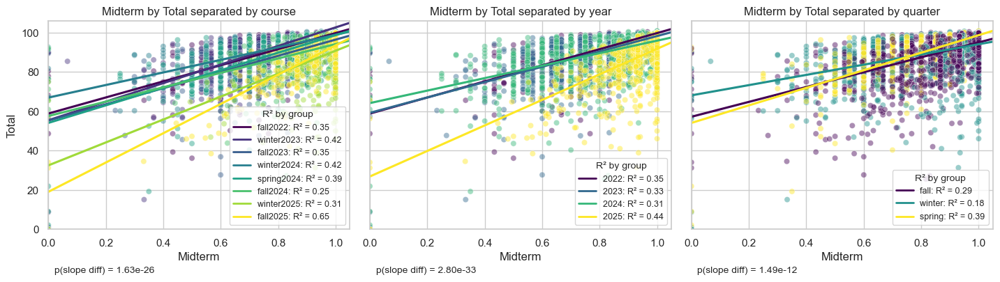

In [56]:
from matplotlib import cm
from matplotlib.lines import Line2D

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from scipy.stats import linregress
import statsmodels.formula.api as smf
from statsmodels.stats.anova import anova_lm


def make_three_panel_regression_figure(
    df=dfs,
    x='Midterm',
    y='Total',
    hue_vars=("course", "year", "quarter"),
    ci=False,
    annotate_max_lines=8,
    height=4.2,
    aspect=1.15,
):
    """
    Creates a 1x3 panel plot of x vs y.
    Each panel uses a different hue variable; within panel, plots per-group regression lines,
    annotates slope and R^2 per group, and reports ANCOVA interaction p-value for slope differences.

    Returns:
        g: seaborn FacetGrid
        results: dict of per-panel summary tables (group, n, slope, r2)
    """
    
    # Long format: one row per original point per panel variable
    df_long = df.melt(
        id_vars=[x, y],
        value_vars=list(hue_vars),
        var_name="hue_var",
        value_name="group",
    ).dropna(subset=[x, y, "group"])

    # For stable ordering, convert group to string (helps with mixed types)
    df_long["group"] = df_long["group"].astype(str)

    # Create FacetGrid: 3 columns (one per hue_var)
    g = sns.FacetGrid(
        df_long,
        col="hue_var",
        col_order=list(hue_vars),
        sharex=True,
        sharey=True,
        height=height,
        aspect=aspect,
        despine=False,
    )

    results = {}

    def _panel_plot(data, **kws):
        ax = plt.gca()

        # Determine order & palette per panel
        levels = list(pd.unique(data["group"]))
        if len(levels) > annotate_max_lines: # huge annotation box
            print(
                f"Warning: panel '{data['hue_var'].iloc[0]}' has",
                f"{len(levels)} groups; annotation box may be large."
            )
            pass

        cmap = cm.get_cmap("viridis")
        palette = [cmap(v) for v in np.linspace(0, 1, len(levels))]
        color_map = dict(zip(levels, palette))

        # Scatter
        sns.scatterplot(
            data=data,
            x=x,
            y=y,
            hue="group",
            hue_order=levels,
            palette=color_map,
            alpha=0.45,
            s=35,
            ax=ax,
            legend=False,  # we'll add one global legend later
        )
        ax.set_ylim(0)  # Assuming scores can't be negative; adjust as needed
        ax.set_xlim(0)  

        # Per-group regression lines + compute slope/R2
        rows = []
        legend_handles = []
        for lvl in levels:
            d = data[data["group"] == lvl]
            n = len(d)
            if n < 2:
                continue

            lr = linregress(d[x], d[y])
            slope = lr.slope
            r2 = lr.rvalue**2

            # line - since regplot doesnt support per-hue lines directly, BOO! 
            sns.regplot(
                data=d,
                x=x,
                y=y,
                scatter=False,
                ci=ci,
                color=color_map[lvl],
                ax=ax,
                truncate=False,
            )
            
            # legend line
            legend_handles.append(
                Line2D(
                    [0], [0],
                    color=color_map[lvl],
                    lw=2,
                    label=f"{lvl}: R² = {r2:.2f}"
                )
            )

            rows.append({"group": lvl, "n": n, "slope": slope, "r2": r2})
        print(rows)
        panel_name = data["hue_var"].iloc[0]
        panel_table = pd.DataFrame(rows).sort_values("group")
        results[panel_name] = panel_table

        # ANCOVA: test whether slopes differ across groups (interaction)
        # Use C(group) to ensure categorical treatment
        try:
            model = smf.ols(f"{y} ~ {x} * C(group)", data=data).fit()
            aov = anova_lm(model, typ=2)  # Type II ANOVA
            # Interaction term name is f"{x}:C(group)"
            interaction_term = f"{x}:C(group)"
            p_slope_diff = float(aov.loc[interaction_term, "PR(>F)"])
        except Exception:
            p_slope_diff = np.nan

        ######### Annotation box: slope and R^2 per group
        # Keep it compact and figure-friendly
        lines = []
        for _, r in panel_table.iterrows(): # e.g., "A: m=0.31, R²=0.42"
            lines.append(f"{r['group']}: R²={r['r2']:.3g}")
        if len(lines) > annotate_max_lines: # If too many, truncate (opt))
            lines = lines[:annotate_max_lines] + ["…"]

        leg = ax.legend(
            handles=legend_handles,
            title="R² by group",
            loc="lower right",
            frameon=True,
            fontsize=9,
            title_fontsize=10
        )
        ax.add_artist(leg)

        ##################
        
        # Bottom-of-panel slope-difference p-value
        p_txt = "p(slope diff) = NA" if np.isnan(p_slope_diff) else f"p(slope diff) = {p_slope_diff:.2e}"
        ax.text(
            0.02,
            -0.18,
            p_txt,
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=10,
        )
        ax.set_title(f"{x} by {y} separated by {panel_name}")

    g.map_dataframe(_panel_plot)

    # One shared legend for the whole figure is tricky because each panel has different groups.
    # For papers, I usually recommend per-panel legend OFF + the annotation boxes ON (what we did).
    # If you still want a legend, you can enable it and accept it may be large.
    # g.add_legend(title="group")

    g.set_axis_labels(x, y)
    # g.set_titles(col_template="{col_name}")
    plt.tight_layout()

    return g, results


# Example usage:
g, results = make_three_panel_regression_figure()
plt.show()

/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'in person', 'n': 1527, 'slope': np.float64(48.69857850403197), 'r2': np.float64(0.4416999111623831)}, {'group': 'remote', 'n': 2112, 'slope': np.float64(45.79781967004205), 'r2': np.float64(0.42560324533916605)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': '2022', 'n': 448, 'slope': np.float64(56.07266974998486), 'r2': np.float64(0.5348993591844992)}, {'group': '2023', 'n': 999, 'slope': np.float64(50.306843470176105), 'r2': np.float64(0.5173695888020984)}, {'group': '2024', 'n': 1340, 'slope': np.float64(46.09184798918022), 'r2': np.float64(0.49288074533375437)}, {'group': '2025', 'n': 852, 'slope': np.float64(73.35322243431894), 'r2': np.float64(0.6120118793884539)}]


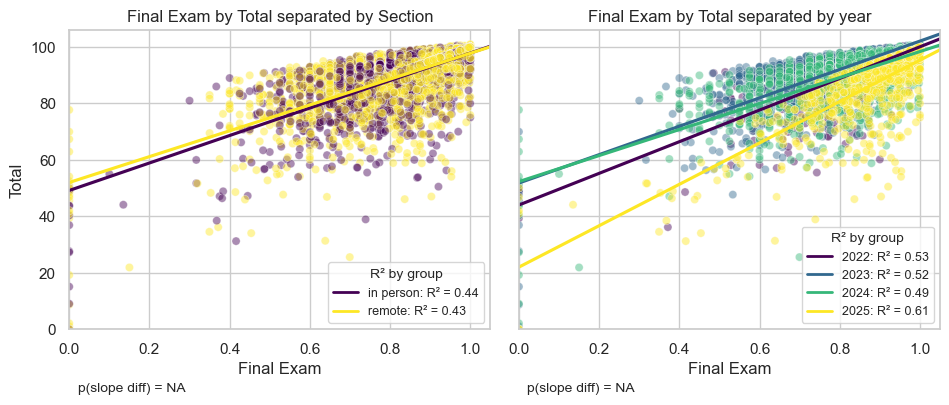

In [57]:
g, results = make_three_panel_regression_figure(dfs,
                                                x='Final Exam',
                                                y='Total',
                                                hue_vars=('Section', 'year')
                                                )
plt.show()

/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'in person', 'n': 390, 'slope': np.float64(68.0667973809638), 'r2': np.float64(0.5176932064391372)}, {'group': 'remote', 'n': 462, 'slope': np.float64(61.95407958688269), 'r2': np.float64(0.3685739210126335)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'winter2025', 'n': 491, 'slope': np.float64(58.355399580569376), 'r2': np.float64(0.31248153612889623)}, {'group': 'fall2025', 'n': 361, 'slope': np.float64(74.53325326424816), 'r2': np.float64(0.6491068503423923)}]


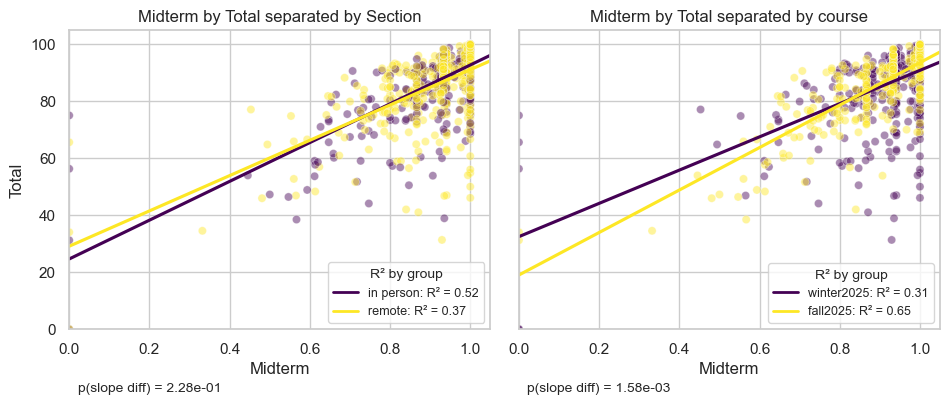

In [58]:
# For looking at the correlation between Midterm vs. Overall Grade, 
# only looking at Winter 2025 and Fall 2025
# The only difference between these 2 quarters is that Winter 2025 had online unproctored exams, 
# vs. Fall 2025 had in-person proctored exams (but the exams themselves were also 
# literally exactly the same: same randomized problems)

# What is the difference in student outcomes in in-person proctored exams vs. online unproctored exams

dfs_sub = dfs[dfs['course'].isin(['winter2025', 'fall2025'])]
g, results = make_three_panel_regression_figure(dfs_sub,
                                                x='Midterm',
                                                y='Total',
                                                hue_vars=('Section', 'course')
                                                )


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/610296918.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/610296918.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/610296918.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


KS test Midterm: D=0.287, p=1.24e-15
Mann-Whitney U test Midterm: U=7.22e+04, p=1.57e-06
KS test Final Exam: D=0.223, p=1.51e-09
Mann-Whitney U test Final Exam: U=6.42e+04, p=5.7e-12
KS test Total: D=0.0829, p=0.107
Mann-Whitney U test Total: U=8.31e+04, p=0.121


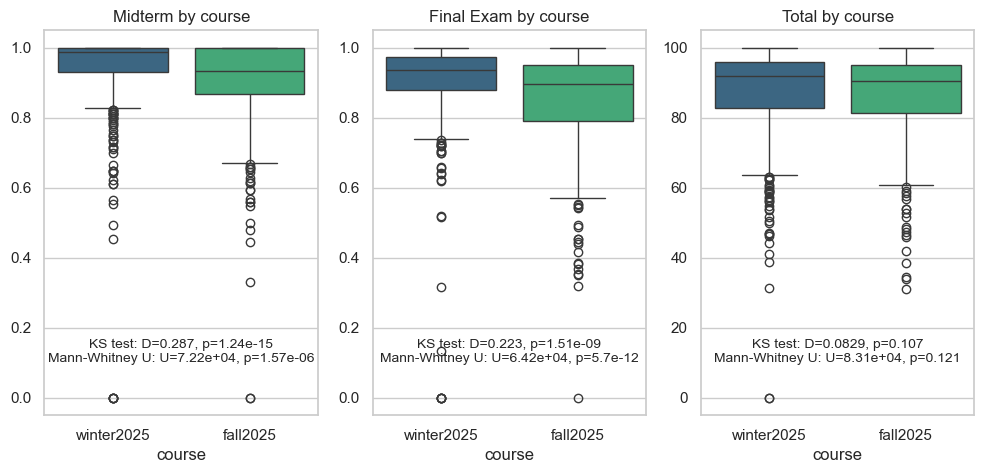

In [59]:
fig, axes = plt.subplots(1, 3, figsize=(12, 5))

y = 'Final Exam'

for y, ax in zip(['Midterm', 'Final Exam', 'Total'], axes):

    sns.boxplot(
        data=dfs_sub,
        x='course',
        y=y,
        palette='viridis',
        ax=ax
    )

    left = dfs_sub.loc[dfs_sub["course"] == 'fall2025', y].dropna().to_numpy()
    right = dfs_sub.loc[dfs_sub["course"] == 'winter2025', y].dropna().to_numpy()
    ks = ks_2samp(left, right, alternative="two-sided", mode="auto")
    u, p = mannwhitneyu(left, right, alternative="two-sided") 
    
    ax.text(
        0.5, 0.2,
        f"KS test: D={ks.statistic:.3g}, p={ks.pvalue:.3g}\nMann-Whitney U: U={u:.3g}, p={p:.3g}",
        transform=ax.transAxes,
        ha="center", va="top",
        fontsize=10
    )
    ax.set_title(f"{y} by course")
    ax.set_ylabel("")

    print(f'KS test {y}: D={ks.statistic:.3g}, p={ks.pvalue:.3g}')
    print(f'Mann-Whitney U test {y}: U={u:.3g}, p={p:.3g}')

/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/3729088309.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


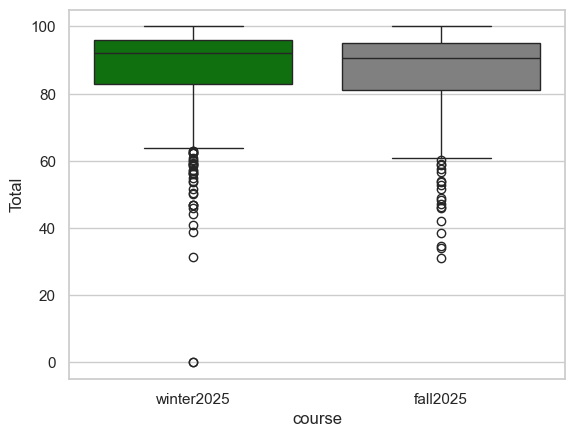

KS test Final Exam: D=0.223, p=1.51e-09


In [60]:

sns.boxplot(
    data=dfs_sub,
    x='course',
    y='Total',
    palette=["green", "grey"]
)
plt.show()

y = 'Final Exam'
left = dfs_sub.loc[dfs_sub["course"] == 'fall2025', y].dropna().to_numpy()
right = dfs_sub.loc[dfs_sub["course"] == 'winter2025', y].dropna().to_numpy()
ks = ks_2samp(left, right, alternative="two-sided", mode="auto")
print(f'KS test {y}: D={ks.statistic:.3g}, p={ks.pvalue:.3g}')

### In person vs. Remote Exam Analysis

In [71]:
df1 = get_df(files[6])
df2 = get_df(files[7])

df1['quarter'] = 'winter'
df1['year'] = 2025
df1['course'] = df1['quarter'].astype(str) + df1['year'].astype(str)
df1['exam_type'] = 'inperson'         

df2['quarter'] = 'fall'
df2['year'] = 2025
df2['course'] = df2['quarter'].astype(str) + df2['year'].astype(str)
df2['exam_type'] = 'inperson'    

print(df.columns)

df = pd.concat([df1, df2], ignore_index=True)
df_sub = df[['Preparation','Application', 'Examination', 'Total', 'course']]

df_sub['min_category'] = df_sub[['Preparation','Application', 'Examination']].idxmin(axis=1)


import pandas as pd
from scipy.stats import chi2_contingency

# contingency table: rows = course, columns = min_category
ct = pd.crosstab(df_sub["course"], df_sub["min_category"])
chi2, p, dof, expected = chi2_contingency(ct)
print(f"Chi-square statistic: {chi2:.3f}")
print(f"Degrees of freedom: {dof}")
print(f"P-value: {p:.4e}")
print('\n', ct)



Index(['Application', 'Examination', 'Preparation'], dtype='str', name='min_category')
Chi-square statistic: 73.550
Degrees of freedom: 2
P-value: 1.0688e-16

 min_category  Application  Examination  Preparation
course                                             
fall2025               29          222          110
winter2025             93          159          239


In [62]:

rows = []
df = ct # Only keep the relevant columns

for idx, row in df.iterrows():
    rows.append(
        pd.DataFrame(
            [row], 
            index=[f"{idx} (n={row.sum()})"]))

    props = (row / row.sum() * 100).round(1)
    props = props.map(lambda x: f"{x:.1f}%")
    rows.append(pd.DataFrame([props], index=["%"]))

result = pd.concat(rows)
print(result)

min_category       Application Examination Preparation
fall2025 (n=361)            29         222         110
%                         8.0%       61.5%       30.5%
winter2025 (n=491)          93         159         239
%                        18.9%       32.4%       48.7%


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/1580391976.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("Accent")


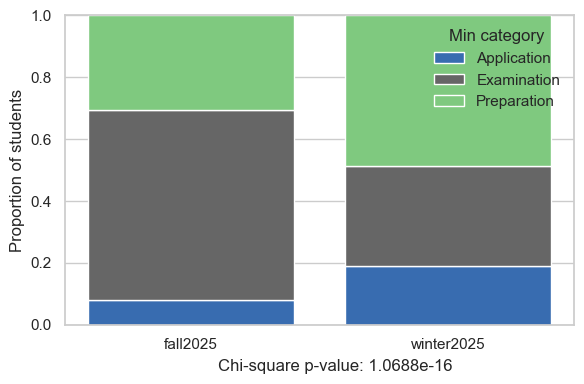

In [63]:
# contingency table: rows = course, columns = min_category and plot

# set n categories to plot (number of possible min_category values)
cats = df_sub['min_category'].unique()
n_cat = len(cats)

# counts
counts = (
    df_sub
    .groupby(["course", "min_category"])
    .size()
    .unstack(fill_value=0)
)

# proportions
props = counts.div(counts.sum(axis=1), axis=0)
fig, ax = plt.subplots(figsize=(6, 4))

bottom = np.zeros(len(props))

cmap = cm.get_cmap("Accent")
palette = [cmap(v) for v in np.linspace(0, 1, n_cat)]
color_map = dict(zip(cats, palette))

for cat in props.columns:
    ax.bar(
        props.index,
        props[cat],
        bottom=bottom,
        label=cat,
        color=color_map.get(cat),
        edgecolor="white"
    )
    bottom += props[cat]

ax.set_ylabel("Proportion of students")
ax.set_xlabel("")
ax.set_ylim(0, 1)
ax.legend(title="Min category", frameon=False)

ax.text(
    0.3, -0.15,
    f"Chi-square p-value: {p:.4e}", transform=ax.transAxes)

plt.tight_layout()
plt.show()



In [64]:
df_long

,year,quarter,assessment,score
0,2022,fall,Midterm,0.600000
1,2022,fall,Midterm,0.933333
2,2022,fall,Midterm,0.366667
3,2022,fall,Midterm,0.533333
4,2022,fall,Midterm,0.766667
...,...,...,...,...
10912,2025,fall,Total,80.134615
10913,2025,fall,Total,52.725000
10914,2025,fall,Total,95.412500
10915,2025,fall,Total,80.958333


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/3102142148.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("Accent")
/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/3102142148.py:62: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Winter 2025", "Fall 2025"])


<Figure size 640x480 with 0 Axes>

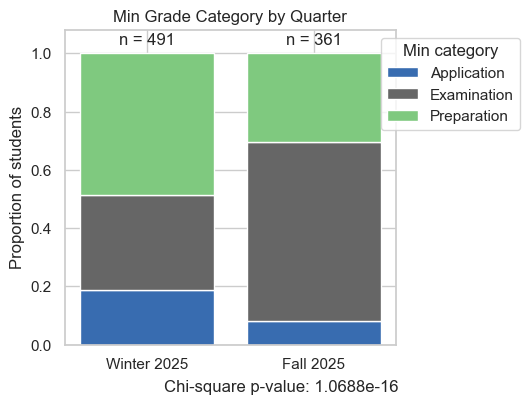

In [65]:
# Set desired course order
course_order = ["winter2025", "fall2025"]
plt.clf()
# Set category order
cats = df_sub["min_category"].unique()
n_cat = len(cats)
labels = {'winter2025': 'Winter 2025\n (remote, unproctored)', 'fall2025': 'Fall 2025\n (in-person, proctored)'}
# Counts
counts = (
    df_sub
    .groupby(["course", "min_category"])
    .size()
    .unstack(fill_value=0)
    .reindex(course_order)
)

# Proportions
props = counts.div(counts.sum(axis=1), axis=0)

fig, ax = plt.subplots(figsize=(6, 4))

bottom = np.zeros(len(props))

cmap = cm.get_cmap("Accent")
palette = [cmap(v) for v in np.linspace(0, 1, n_cat)]
color_map = dict(zip(cats, palette))

for cat in props.columns:
    ax.bar(
        props.index,
        props[cat],
        bottom=bottom,
        label=cat,
        color=color_map.get(cat),
        edgecolor="white"
    )
    bottom += props[cat]

# Add n labels above bars
ns = counts.sum(axis=1)

for i, course in enumerate(props.index):
    ax.text(
        i,
        1.02,
        f"n = {ns.loc[course]}",
        ha="center",
        va="bottom"
    )

ax.set_ylabel("Proportion of students")
ax.set_xlabel("")
ax.set_ylim(0, 1.08)

ax.legend(
    title="Min category",
    frameon=True,
    loc="upper right",
    bbox_to_anchor=(1.4, 1)
)
# ax.legend(title="Min category", frameon=True, loc="upper right")
ax.set_xticklabels(["Winter 2025", "Fall 2025"])

ax.text(
    0.3, -0.15,
    f"Chi-square p-value: {p:.4e}",
    transform=ax.transAxes
)
plt.tight_layout()
plt.title('Min Grade Category by Quarter')
plt.savefig("out/min_category_comparison.png", bbox_inches="tight", dpi=300)
plt.show()

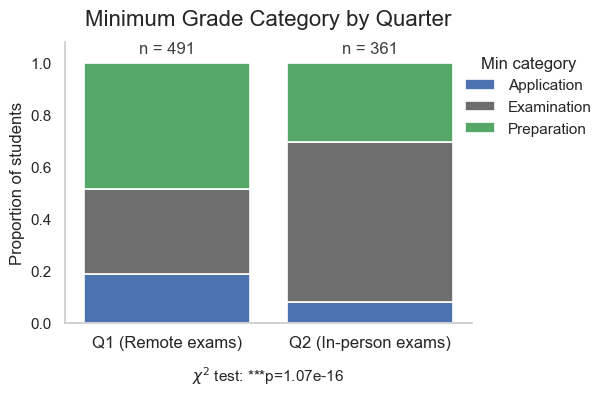

In [66]:
# Set desired course order
course_order = ["winter2025", "fall2025"]
labels = {
    "winter2025": "Q1 (Remote exams)",
    "fall2025": "Q2 (In-person exams)"
}

# Set category order explicitly
cat_order = ["Application", "Examination", "Preparation"]

# Counts
counts = (
    df_sub
    .groupby(["course", "min_category"])
    .size()
    .unstack(fill_value=0)
    .reindex(course_order)
    .reindex(columns=cat_order)
)

# Proportions
props = counts.div(counts.sum(axis=1), axis=0)

fig, ax = plt.subplots(figsize=(6.2, 4.2))

bottom = np.zeros(len(props))

# Muted, publication-friendly colors
color_map = {
    "Application": "#4C72B0",
    "Examination": "#6E6E6E",
    "Preparation": "#55A868"
}

x = np.arange(len(props.index))

for cat in cat_order:
    ax.bar(
        x,
        props[cat],
        bottom=bottom,
        label=cat,
        color=color_map[cat],
        edgecolor="white",
        linewidth=1.2,
        width=0.82
    )
    bottom += props[cat].values

# Add n labels above bars
ns = counts.sum(axis=1)

for i, course in enumerate(props.index):
    ax.text(
        i,
        1.025,
        f"n = {ns.loc[course]}",
        ha="center",
        va="bottom",
        fontsize=12,
        color="0.25"
    )

ax.set_title("Minimum Grade Category by Quarter", fontsize=16, pad=12)
ax.set_ylabel("Proportion of students", fontsize=12)
ax.set_xlabel("")
ax.set_ylim(0, 1.08)

ax.set_xticks(x)
ax.set_xticklabels([labels[c] for c in props.index], fontsize=12)

# Clean axes
ax.spines[["top", "right"]].set_visible(False)
ax.grid(axis="y", alpha=0.25)
ax.set_axisbelow(True)

# Better p-value formatting
ax.text(
    0.5, -0.152,
    r"$\chi^2$ test: ***p=1.07e-16",
    transform=ax.transAxes,
    ha="center",
    va="top",
    fontsize=11
)

# Legend outside
ax.legend(
    title="Min category",
    frameon=False,
    bbox_to_anchor=(.95, 1),
    loc="upper left",
    fontsize=11,
    title_fontsize=12,
)
ax.grid(False)

plt.tight_layout()
plt.savefig("out/min_category_comparison.png", bbox_inches="tight", dpi=600)
plt.savefig("out/min_category_comparison.svg", bbox_inches="tight")
plt.show()

In [67]:
# import pandas as pd
# import matplotlib.pyplot as plt

# df = pd.DataFrame({
#     "Group": [
#         "Q1 (remote)",
#         "Q2 (in-person)",
#         "Passing Q1",
#         "Passing Q2",
#         "Failing Q1",
#         "Failing Q2"
#     ],
#     "Examination": [32.4, 61.5, 33.9, 19.6, 60.2, 73.5],
#     "Preparation": [48.7, 30.5, 47.3, 60.8, 31.2, 23.5],
#     "Application": [18.9, 8.0, 18.9, 19.6, 8.6, 2.9],
# })

# fig, ax = plt.subplots(figsize=(8, 5))

# bottom = [0] * len(df)

# for col in ["Examination", "Application", "Preparation"]:
#     ax.bar(
#         df["Group"],
#         df[col],
#         bottom=bottom,
#         label=col
#     )
#     bottom = [b + v for b, v in zip(bottom, df[col])]

# ax.set_ylabel("Percentage of Students")
# ax.set_ylim(0, 100)
# ax.set_title("Distribution of Minimum Grade Categories")
# ax.legend(title="Category")

# plt.xticks(rotation=20, ha="right")
# plt.tight_layout()
# plt.show()

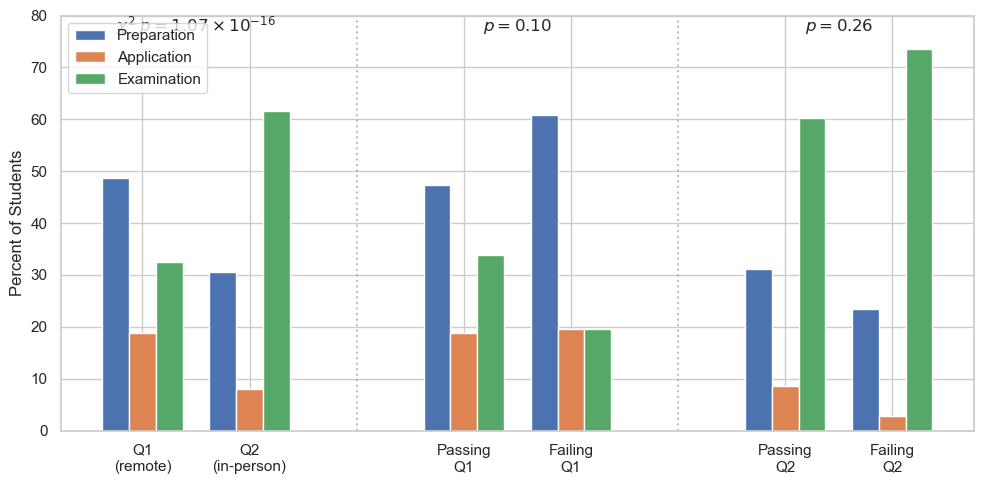

In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

labels = [
    "Q1\n(remote)",
    "Q2\n(in-person)",
    "Passing\nQ1",
    "Failing\nQ1",
    "Passing\nQ2",
    "Failing\nQ2"
]

prep = [48.7, 30.5, 47.3, 60.8, 31.2, 23.5]
appl = [18.9, 8.0, 18.9, 19.6, 8.6, 2.9]
exam = [32.4, 61.5, 33.9, 19.6, 60.2, 73.5]

# create gaps between comparison groups
x = np.array([0, 1, 3, 4, 6, 7])

width = 0.25

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(x - width, prep, width, label="Preparation")
ax.bar(x, appl, width, label="Application")
ax.bar(x + width, exam, width, label="Examination")

ax.set_ylabel("Percent of Students")
ax.set_ylim(0, 80)
ax.set_xticks(x)
ax.set_xticklabels(labels)

# significance labels
ax.text(0.5, 77, r"$\chi^2$ $p=1.07\times10^{-16}$",
        ha="center")
ax.text(3.5, 77, r"$p=0.10$",
        ha="center")
ax.text(6.5, 77, r"$p=0.26$",
        ha="center")

# optional separators
ax.axvline(2, color="gray", linestyle=":", alpha=0.5)
ax.axvline(5, color="gray", linestyle=":", alpha=0.5)

ax.legend()
plt.tight_layout()
plt.show()

/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'Preparation', 'n': 349, 'slope': np.float64(1.2412231430304983), 'r2': np.float64(0.5415785725094019)}, {'group': 'Application', 'n': 122, 'slope': np.float64(1.1389375810327995), 'r2': np.float64(0.5400721924006398)}, {'group': 'Examination', 'n': 381, 'slope': np.float64(0.4741775251614711), 'r2': np.float64(0.6148953067991615)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'winter2025', 'n': 491, 'slope': np.float64(0.7102226766870949), 'r2': np.float64(0.3468008196933055)}, {'group': 'fall2025', 'n': 361, 'slope': np.float64(0.37890501728720094), 'r2': np.float64(0.26673885722482904)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'Preparation', 'n': 349, 'slope': np.float64(0.685806146637911), 'r2': np.float64(0.43699216492286275)}, {'group': 'Application', 'n': 122, 'slope': np.float64(1.4196499226874182), 'r2': np.float64(0.5662201369016192)}, {'group': 'Examination', 'n': 381, 'slope': np.float64(0.3493610550853233), 'r2': np.float64(0.4352374022905092)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'winter2025', 'n': 491, 'slope': np.float64(0.6543908940242387), 'r2': np.float64(0.4277697019940211)}, {'group': 'fall2025', 'n': 361, 'slope': np.float64(0.1765303956849468), 'r2': np.float64(0.11667216374945694)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'Preparation', 'n': 349, 'slope': np.float64(1.1781719502789114), 'r2': np.float64(0.5251800232005239)}, {'group': 'Application', 'n': 122, 'slope': np.float64(0.73358998740017), 'r2': np.float64(0.7975097033052904)}, {'group': 'Examination', 'n': 381, 'slope': np.float64(0.8011444898776285), 'r2': np.float64(0.4922250576660304)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_6814/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'winter2025', 'n': 491, 'slope': np.float64(0.7655561940632583), 'r2': np.float64(0.4033756412227489)}, {'group': 'fall2025', 'n': 361, 'slope': np.float64(0.8620930567155954), 'r2': np.float64(0.3688124778463051)}]


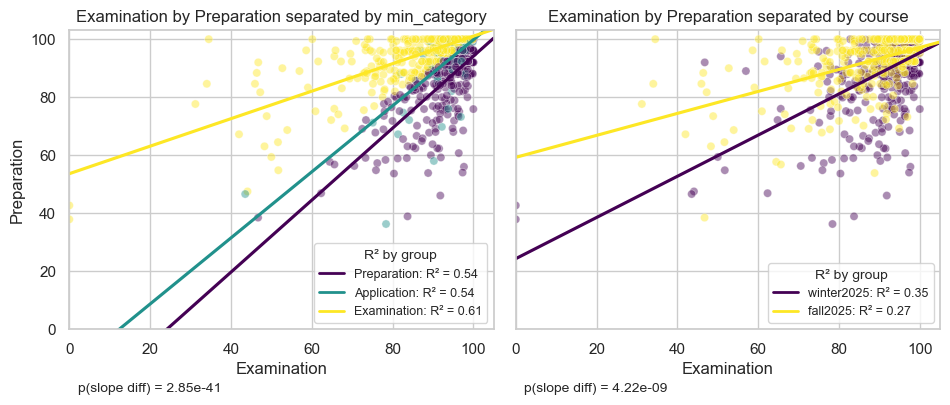

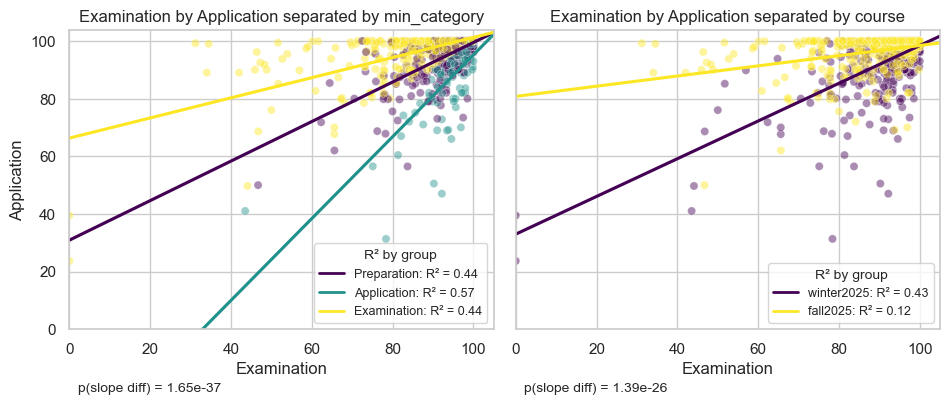

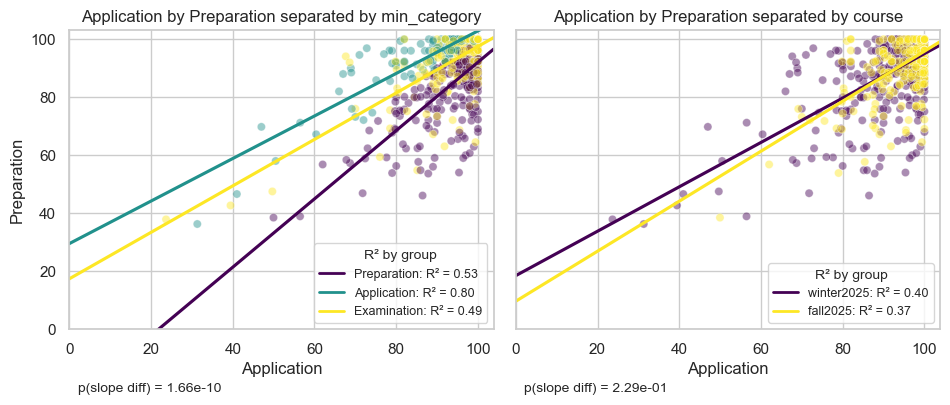

In [69]:
g, results = make_three_panel_regression_figure(df_sub,
                                                x='Examination',
                                                y='Preparation',
                                                hue_vars=('min_category', 'course'),
                                                )

g, results = make_three_panel_regression_figure(df_sub,
                                                x='Examination',
                                                y='Application',
                                                hue_vars=('min_category', 'course'),
                                                )

g, results = make_three_panel_regression_figure(df_sub,
                                                x='Application',
                                                y='Preparation',
                                                hue_vars=('min_category', 'course'),
                                                )

In [70]:
# As a nice summary plot, it would be good to create a violin plot 
# where the vertical axis is grade percentage (0%-100%) and the 
# horizontal axis has 2 categories "Winter 2025" and "Fall 2025", 
# where each quarter has 4 side-by-side violins: 
# Preparation, Application, Examination, and Overall


import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Convert to long format
df_long = df.melt(
    id_vars="course",
    value_vars=["Preparation", "Application", "Examination", "Total"],
    var_name="Category",
    value_name="Grade"
)

# Plot
plt.figure(figsize=(8,5))

sns.violinplot(
    data=df_long,
    x="course",
    y="Grade",
    hue="Category",
    inner="quartile",
    cut=0
)

plt.ylim(0, 100)
plt.ylabel("Grade (%)")
plt.xlabel("")
plt.title("Grade Distributions by Quarter and Assessment Category")

plt.legend(title="")
plt.tight_layout()
plt.show()


KeyError: "The following id_vars or value_vars are not present in the DataFrame: ['course', 'Total']"

KeyError: 'Category'

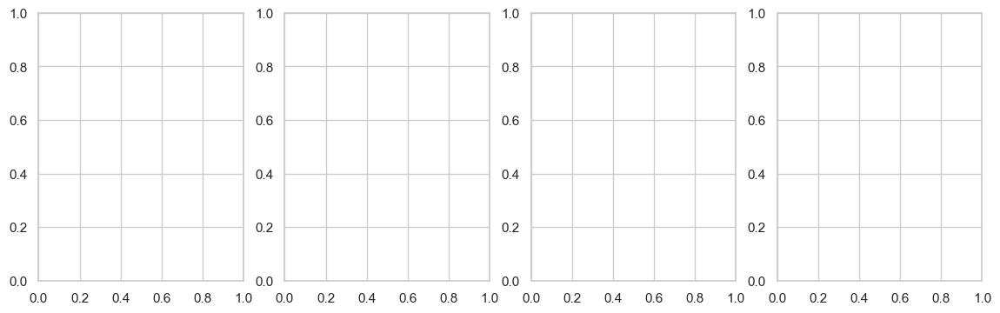

In [ ]:
# 4 "split violins" (1 for each of Preparation, Application, Examination, and Overall) 
# showing WI25 on the left half and FA25 on the right half.

# First define what stat test to run on each of the categories
cat_map = {
    'Preparation': {'alternative':'greater'},
    'Application': {'alternative':'greater'},
    'Examination': {'alternative':'less'},
    'Overall':       {'alternative':'two-sided'},

}

fig, axes = plt.subplots(1, 4, figsize=(14, 4))

def generate_plots_exams(data=df_long, axes=axes):
    
    for ax, category in zip(axes, ['Preparation', 'Application', 'Examination', 'Overall']):
        
        df = data[data['Category'] == category]
        print('Processing', category)
        split_on = 'course'
        splits = ['winter2025', 'fall2025']
        score = 'Grade'
        
        # left and right are arrays of values for remote vs. in person
        left  = df.loc[df[split_on] == splits[0], score].dropna().to_numpy()
        right = df.loc[df[split_on] == splits[1], score].dropna().to_numpy()

        # If one of the sides is empty, skip
        try:
            y = np.linspace(min(left.min(), right.min()), max(left.max(), right.max()), 2000)
            skip_left = False
            skip_right = False
        except ValueError:
            if len(left) == 0:
                print(f"{splits[0]} side is empty")
                skip_left = True
            if len(right) == 0:
                print(f"{splits[1]}side is empty")
                skip_right = True

        # Get the kernel density estimates to draw the violin sides
        def kde_width_at(kde, y_grid, widths, y0):
            return float(np.interp(y0, y_grid, widths))

        # draw center line
        ax.axvline(0, color="black", linewidth=1)

        # ADD LEFT 
        if not skip_left:
            # Get the kernel density estimates to draw the violin sides
            kde_left = gaussian_kde(left)
            w_left = kde_left(y)
            ax.fill_betweenx(y, -w_left, 0, alpha=0.6, label=splits[0], color='lightblue')
            
            # draw mode lines
            grid_l = np.linspace(left.min(), left.max(), 2000)  # dense grid helps
            dens_l = kde_left(grid_l)
            mode_est_l = grid_l[np.argmax(dens_l)]  # y-value where KDE is maximal
            wl = kde_width_at(kde_left, grid_l, dens_l, mode_est_l)
            ax.hlines(mode_est_l, xmin=-wl, xmax=0, linewidth=1.8, color="black")

        # ADD RIGHT
        if not skip_right:
            kde_right = gaussian_kde(right)
            w_right = kde_right(y)
            ax.fill_betweenx(y, 0, w_right, alpha=0.6, label=splits[1], color='red')

            grid_r = np.linspace(right.min(), right.max(), 2000)  # dense grid helps
            dens_r = kde_right(grid_r)
            mode_est_r = grid_r[np.argmax(dens_r)]  # y-value where KDE is maximal
            wr = kde_width_at(kde_right, grid_r, dens_r, mode_est_r)
            ax.hlines(mode_est_r, xmin=0, xmax=wr, linewidth=1.8, color="black")


        
        if not skip_left and not skip_right:
            # KS test annotation
            print(cat_map[category])
            ks = ks_2samp(left, right, alternative=cat_map[category]['alternative'], mode="auto")
            ax.text(
                0.5, 0.98,
                f"KS test: D={ks.statistic:.3g}, p={ks.pvalue:.3g}",
                transform=ax.transAxes,
                ha="center", va="top"
            )
            
            # Mann-Whitney U test annotation
            u, p = mannwhitneyu(left, right, alternative=cat_map[category]['alternative']) 
            ax.text(
                0.5, 0.0,
                f"Mann-Whitney U: U={u:.3g}, p={p:.3g}",
                transform=ax.transAxes,
                ha="center", va="top"
            )

        ax.set_xticks([])
        ax.set_ylabel("Grade")
        
        ax.set_title(category)
        ax.set_xlim(-max(w_left.max() if not skip_left else 0, w_right.max() if not skip_right else 0)*1.1,
                     max(w_left.max() if not skip_left else 0, w_right.max() if not skip_right else 0)*1.1)
        print(f'\tMODE {splits[0]}={mode_est_l}\t{splits[1]}={mode_est_r}')
        print(f'\tMEAN {splits[0]}={np.mean(left)}\t{splits[1]}={np.mean(right)}')
        print(f'\tMED  {splits[0]}={np.median(left)}\t{splits[1]}={np.median(right)}')
        print(f'\tKS test: D={ks.statistic:.3g}, p={ks.pvalue:.3g}')
        print(f'\tMann-Whitney U: U={u:.3g}, p={p:.3g}')
    plt.tight_layout()
    axes[-1].legend(loc='lower center', bbox_to_anchor=(0.5, -0.02))
    return fig

fig = generate_plots_exams()
fig.suptitle("Final Grade Category Distributions by Quarter", fontsize=16, y=1.03)
fig.savefig("out/category_quarter_violin.png", bbox_inches="tight", dpi=300)
plt.show()

In [ ]:
df.columns

Index(['Section', 'Midterm (891463)', 'Final (891462)', 'Project 1 (891470)',
       'Project 2 (891471)', 'Programming Assignment 1 (891464)',
       'Programming Assignment 2 (891465)',
       'Programming Assignment 3 (891466)',
       'Programming Assignment 4 (891467)',
       'Programming Assignment 5 (891468)',
       ...
       'Reading Quiz 18 (1032431).1', 'Reading Quiz 19 (1032432).1',
       'Reading Quiz 20 (1032433).1', 'Reading Quiz 21 (1032434).1',
       'Reading Quiz 22 (1032435).1', 'Reading Quiz 23 (1032436).1',
       'Reading Quiz 24 (1032437).1', 'Reading Quiz 25 (1032438).1',
       'Reading Quiz 26 (1032439).1', 'Reading Quiz 27 (1032440).1'],
      dtype='str', length=152)

	 left 0.06588343632359742
	 right 0.07586159312118304
	 left 0.11279201534571709
	 right 0.15361584405742693
	 left 0.09392672504784934
	 right 0.06178722310794629
	 left 0.06252339311795818
	 right 0.05681319300108293
Preparation KS test: D=0.199, p=2.71e-07
Preparation Mann-Whitney U test: U=6.86e+04, p=6.04e-04
Preparation Winter 2025: mean=91.98, median=95.61
Preparation Fall 2025: mean=93.67, median=96.15
---
---

Application KS test: D=0.252, p=1.48e-11
Application Mann-Whitney U test: U=6e+04, p=1.02e-09
Application Winter 2025: mean=94.97, median=98.00
Application Fall 2025: mean=96.74, median=99.00
---
---

Examination KS test: D=0.213, p=2.29e-08
Examination Mann-Whitney U test: U=1.01e+05, p=4.36e-11
Examination Winter 2025: mean=93.99, median=95.67
Examination Fall 2025: mean=90.20, median=92.60
---
---

Overall KS test: D=0.0887, p=8.29e-02
Overall Mann-Whitney U test: U=8.55e+04, p=7.97e-02
Overall Winter 2025: mean=89.28, median=92.00
Overall Fall 2025: mean=88.32, medi

<Figure size 640x480 with 0 Axes>

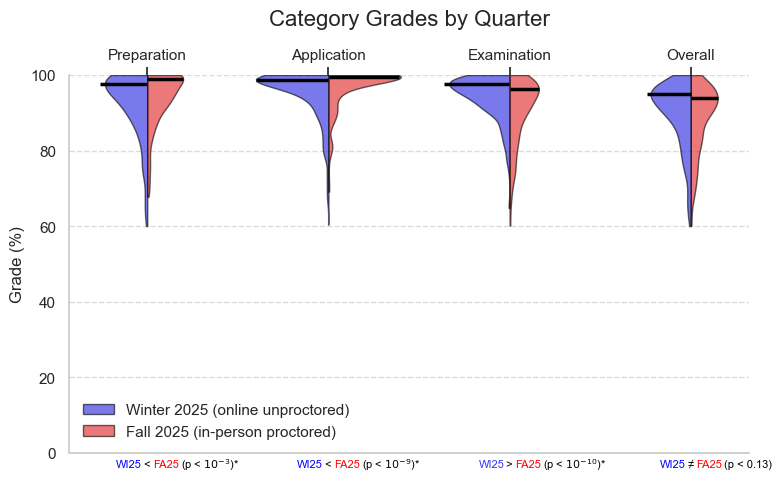

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp, mannwhitneyu, gaussian_kde
import numpy as np

atrisk = False

plt.clf()

cols = ["Preparation", "Application", "Examination", "Overall"]
if 'Total' in df_sub.columns:
    df_sub = df_sub.rename(columns={'Total':'Overall'})

df = df_sub
df['atrisk'] = df['Overall'] < 60
df = df[df['atrisk'] == atrisk]

df_long = df.melt(
    id_vars="course",
    value_vars=cols,
    var_name="Category",
    value_name="Grade"
)

# Rename columns to be more descriptive
w = "Winter 2025 (online unproctored)"
f = "Fall 2025 (in-person proctored)"

df_long["Quarter"] = df_long["course"].map({
    "winter2025": w,
    "fall2025": f,
})

palette = {
    w: "blue",
    f: "red"
}

plt.figure(figsize=(8,5))
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

ax = sns.violinplot(
    data=df_long,
    x="Category",
    y="Grade",
    hue="Quarter",
    split=True,
    palette=palette,
    inner=None,
    linewidth=1,
    cut=0,
    alpha=0.6,
    linecolor='black',
)

plt.ylim(0,100)
plt.ylabel("Grade (%)")
plt.xlabel("")
plt.legend(title="", frameon=False)


# ----- add black lines for median -----

max_half_width = 0.4   # same as seaborn violin width
offset = 0.001         # tiny center gap

# Bug in the way the widths are computed so fit by hand
widths = {
    "Preparation": {"left": .26, "right": .20},
    "Application": {"left": .40, "right": .39},
    "Examination": {"left": .36, "right": .16},
    "Overall":     {"left": .24, "right": .15},
}

for i, cat in enumerate(cols):

    for side, quarter in zip(["left","right"], ["winter2025","fall2025"]):

        data = df[df["course"] == quarter][cat].values
        kde = gaussian_kde(data)
        grid = np.linspace(0,100,2000)
        density = kde(grid)
        peak_index = np.argmax(density)
        peak_y = grid[peak_index]
        peak_density = density[peak_index]
        print('\t', side, peak_density)

        if side == "left":
            x_start = i - widths[cat][side]
            x_end   = i - offset
        else:
            x_start = i + offset
            x_end = i + widths[cat][side]

        ax.plot(
            [x_start, x_end],
            [peak_y, peak_y],
            color="black", lw=2.5, solid_capstyle="butt", zorder=5
        )
# ---- compute and annotate statistics ----

for i, cat in enumerate(cols):

    winter = df[(df["course"]=="winter2025")][cat]
    fall   = df[(df["course"]=="fall2025")][cat]

    ks = ks_2samp(winter, fall)
    mw = mannwhitneyu(winter, fall)
    
    print(f"{cat} KS test: D={ks.statistic:.3g}, p={ks.pvalue:.2e}")
    print(f"{cat} Mann-Whitney U test: U={mw.statistic:.3g}, p={mw.pvalue:.2e}")
    print(f"{cat} Winter 2025: mean={winter.mean():.2f}, median={winter.median():.2f}")
    print(f"{cat} Fall 2025: mean={fall.mean():.2f}, median={fall.median():.2f}")
    print('---\n---\n')
    y = -3
    s = 8
    ofst = .03
    if cat == 'Overall':
        ax.text(i-ofst, y, "WI25", color="blue", ha="right", va="center", fontsize=s)
        ax.text(i, y, " ≠ ", color="black", ha="center", va="center", fontsize=s)
        ax.text(i+ofst, y, "FA25", color="red", ha="left", va="center", fontsize=s)  
        ax.text(i+ofst+0.135, y, " (p < 0.13)", color="black", ha="left", va="center", fontsize=s)
        
    if cat == 'Preparation':
        ax.text(i-ofst, y, "WI25", color="blue", ha="right", va="center", fontsize=s)
        ax.text(i, y, " < ", color="black", ha="center", va="center", fontsize = s)
        ax.text(i+ofst, y, "FA25", color="red", ha="left", va="center", fontsize = s)  
        ax.text(i+ofst+0.155, y, r"(p < $10^{-3}$)"+"*", color="black", ha="left", va="center", fontsize=s)
        
    if cat == 'Application':
        ax.text(i-ofst, y, "WI25", color="blue", ha="right", va="center", fontsize=s)
        ax.text(i, y, " < ", color="black", ha="center", va="center", fontsize = s)
        ax.text(i+ofst, y, "FA25", color="red", ha="left", va="center", fontsize = s)  
        ax.text(i+ofst+0.155, y, r"(p < $10^{-9}$)"+"*", color="black", ha="left", va="center", fontsize=s)

    if cat == 'Examination':
        ax.text(i-ofst, y, "WI25", color="blue", ha="right", va="center", fontsize=s, alpha=0.8)
        ax.text(i, y, " > ", color="black", ha="center", va="center", fontsize = s)
        ax.text(i+ofst, y, "FA25", color="red", ha="left", va="center", fontsize = s)  
        ax.text(i+ofst+0.155, y, r"(p < $10^{-10}$)"+"*", color="black", ha="left", va="center", fontsize=s)

ax.xaxis.set_label_position('top')
ax.xaxis.tick_top()
ax.set_title("Category Grades by Quarter", fontsize=16, y=1.11)


sns.despine()
plt.tight_layout()

# plt.savefig('out/category_grades_quarter.png')
plt.show()

In [ ]:
import pandas as pd
from scipy.stats import mannwhitneyu, ks_2samp

cols = ["Preparation", "Application", "Examination", "Overall"]

rows = []

for group_name, df_group in {
    "Failing": df[df["atrisk"] == True],
    "Passing": df[df["atrisk"] == False]
}.items():

    for cat in cols:
        winter = df_group[df_group["course"] == "winter2025"][cat].dropna()
        fall = df_group[df_group["course"] == "fall2025"][cat].dropna()

        mw = mannwhitneyu(winter, fall)
        ks = ks_2samp(winter, fall)

        rows.append({
            "Group": group_name,
            "Category": cat,
            "MWU p-value": mw.pvalue,
            "MWU U": mw.statistic,
            "KS p-value": ks.pvalue,
            "KS D": ks.statistic,
            "Winter mean": winter.mean(),
            "Winter median": winter.median(),
            "Fall mean": fall.mean(),
            "Fall median": fall.median()
        })

results = pd.DataFrame(rows)

pval_table = results.pivot(
    index="Group",
    columns="Category",
    values="MWU p-value"
)

pval_table = pval_table.loc[["Failing", "Passing"], cols]

# pval_table.map(lambda x: f"{x:.2e}")
pval_table

/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1583/3215253910.py:17: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  mw = mannwhitneyu(winter, fall)
/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1583/3215253910.py:18: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  ks = ks_2samp(winter, fall)
/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1583/3215253910.py:17: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  mw = mannwhitneyu(winter, fall)
/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1583/3215253910.py:18: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements

Category,Preparation,Application,Examination,Overall
Group,,,,
Failing,NaN,NaN,NaN,NaN
Passing,0.000604,1.021583e-09,4.363188e-11,0.079687


In [ ]:
results

,Group,Category,MWU p-value,MWU U,KS p-value,KS D,Winter mean,Winter median,Fall mean,Fall median
0,Failing,Preparation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Failing,Application,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Failing,Examination,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Failing,Overall,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Passing,Preparation,6.039280e-04,68593.0,2.709794e-07,0.198520,91.982530,95.613333,93.674152,96.153846
5,Passing,Application,1.021583e-09,60046.0,1.482004e-11,0.252472,94.971619,98.000000,96.744117,99.000000
6,Passing,Examination,4.363188e-11,101359.5,2.291180e-08,0.213430,93.991262,95.670999,90.201810,92.597917
7,Passing,Overall,7.968722e-02,85493.5,8.286090e-02,0.088711,89.278988,92.000000,88.315578,91.254167


## Violin Quartiles Paper plot

Preparation KS test: D=0.195, p=2.05e-07
Preparation Mann-Whitney U test: U=7.58e+04, p=0.000288
Preparation Winter 2025: mean=90.09, median=94.97
Preparation Fall 2025: mean=92.69, median=95.90
---
---

Application KS test: D=0.246, p=1.45e-11
Application Mann-Whitney U test: U=6.64e+04, p=1.99e-10
Application Winter 2025: mean=93.58, median=97.50
Application Fall 2025: mean=96.34, median=99.00
---
---

Examination KS test: D=0.205, p=4.07e-08
Examination Mann-Whitney U test: U=1.12e+05, p=8.84e-11
Examination Winter 2025: mean=92.63, median=95.26
Examination Fall 2025: mean=88.25, median=91.96
---
---

Overall KS test: D=0.0829, p=0.107
Overall Mann-Whitney U test: U=9.41e+04, p=0.121
Overall Winter 2025: mean=87.07, median=92.00
Overall Fall 2025: mean=86.30, median=90.60
---
---

\begin{table}
\caption{Mann--Whitney U test results comparing category grades between quarters.}
\label{tab:mwu_results}
\begin{tabular}{|l|c|c|c|c|}
\toprule
 & Preparation & Application & Examination & O

<Figure size 640x480 with 0 Axes>

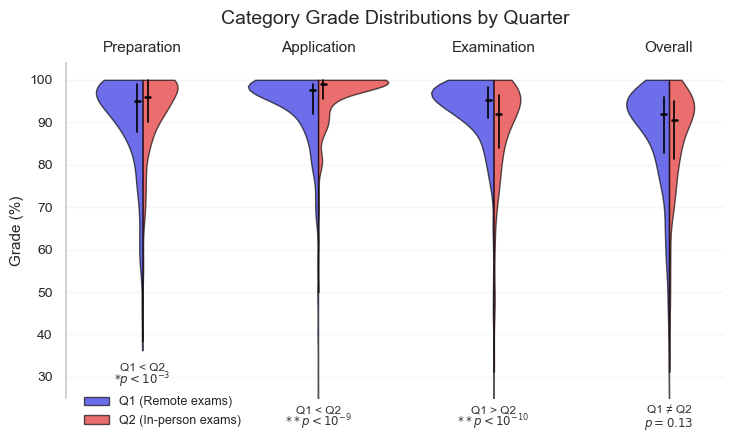

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp, mannwhitneyu, gaussian_kde
import numpy as np

kind = 'quartiles' # 'bar'
assert kind in ['quartiles', 'bars'], "kind must be 'quartiles' or 'bars'"

plt.clf()

cols = ["Preparation", "Application", "Examination", "Overall"]

if "Total" in df_sub.columns:
    df_sub = df_sub.rename(columns={"Total": "Overall"})

df_long = df_sub.melt(
    id_vars="course",
    value_vars=cols,
    var_name="Category",
    value_name="Grade"
)

# Cleaner labels
w = "Q1 (Remote exams)"
f = "Q2 (In-person exams)"

df_long["Quarter"] = df_long["course"].map({
    "winter2025": w,
    "fall2025": f,
})

# Muted, colorblind-friendlier colors
palette = {
    w: "blue",
    f: "red",
}

fig, ax = plt.subplots(figsize=(7.5, 4.6))

ax = sns.violinplot(
    data=df_long,
    x="Category",
    y="Grade",
    hue="Quarter",
    split=True,
    palette=palette,
    inner=None,
    linewidth=1.0,
    cut=0,
    alpha=0.65,
    linecolor="black",
    ax=ax
)

# Cleaner y-axis
ax.set_ylim(25, 104)
ax.set_ylabel("Grade (%)", fontsize=11)
ax.set_xlabel("")

# Light horizontal grid only
ax.grid(True, axis="y", linestyle="-", alpha=0.18)
ax.grid(False, axis="x")

# Move category labels to top
ax.xaxis.set_label_position("top")
ax.xaxis.tick_top()
ax.tick_params(axis="x", labelsize=11, length=0, pad=6)
ax.tick_params(axis="y", labelsize=10)

# Cleaner title
ax.set_title(
    "Category Grade Distributions by Quarter",
    fontsize=14,
    pad=28
)

# Legend outside / top-left-ish
ax.legend(
    title="",
    frameon=False,
    loc="upper left",
    bbox_to_anchor=(0.01, 0.04),
    fontsize=9
)

# ----- add black lines for KDE mode -----

offset = 0.001

widths = {
    "Preparation": {"left": .26, "right": .20},
    "Application": {"left": .395, "right": .39},
    "Examination": {"left": .355, "right": .16},
    "Overall":     {"left": .24, "right": .15},
}

for i, cat in enumerate(cols):
    
    if kind == 'quartiles': continue

    for side, quarter in zip(["left", "right"], ["winter2025", "fall2025"]):

        data = df_sub[df_sub["course"] == quarter][cat].dropna().values

        if len(data) < 2:
            continue

        kde = gaussian_kde(data)
        grid = np.linspace(0, 100, 2000)
        density = kde(grid)

        peak_y = grid[np.argmax(density)]

        if side == "left":
            x_start = i - widths[cat][side]
            x_end = i - offset
        else:
            x_start = i + offset
            x_end = i + widths[cat][side]

        ax.plot(
            [x_start, x_end],
            [peak_y, peak_y],
            color="black",
            lw=1.5,
            solid_capstyle="butt",
            zorder=5
        )

# ----- add vertical quartile bars -----

quartile_offset = 0.03

for i, cat in enumerate(cols):
    
    if kind == 'bars': continue

    for side, quarter in zip(
        ["left", "right"],
        ["winter2025", "fall2025"]
    ):

        data = df_sub[
            df_sub["course"] == quarter
        ][cat].dropna()

        q1, med, q3 = np.percentile(data, [25, 50, 75])

        if side == "left":
            x = i - quartile_offset
        else:
            x = i + quartile_offset

        # thin vertical line spanning Q1 to Q3
        ax.plot(
            [x, x],
            [q1, q3],
            color="black",
            lw=1.2,
            zorder=6
        )

        # median tick
        ax.plot(
            [x - 0.015, x + 0.015],
            [med, med],
            color="black",
            lw=1.8,
            zorder=7
        )
        
# ---- compute and annotate statistics ----

annotations = {
    "Preparation": ("Q1 < Q2", r"$*p < 10^{-3}$"),
    "Application": ("Q1 < Q2", r"$**p < 10^{-9}$"),
    "Examination": ("Q1 > Q2", r"$**p < 10^{-10}$"),
    "Overall": ("Q1 ≠ Q2", r"$p = 0.13$"),
}

null_hypotheses = {
    "Preparation": "Q1 ≤ Q2 (one-sided)",
    "Application": "Q1 ≤ Q2 (one-sided)",
    "Examination": "Q1 ≥ Q2 (one-sided)",
    "Overall": "Q1 = Q2 (two-sided)",
}

h1 = 21
h2 = 17
heights = {
    "Preparation": {"upper": 31, "lower": 27},
    "Application": {"upper": h1, "lower": h2},
    "Examination": {"upper": h1, "lower": h2},
    "Overall": {"upper": h1, "lower": h2},
}

stats_table = {}
for i, cat in enumerate(cols):

    winter = df_sub[df_sub["course"] == "winter2025"][cat].dropna()
    fall = df_sub[df_sub["course"] == "fall2025"][cat].dropna()

    ks = ks_2samp(winter, fall)
    mw = mannwhitneyu(winter, fall)

    print(f"{cat} KS test: D={ks.statistic:.3g}, p={ks.pvalue:.3g}")
    print(f"{cat} Mann-Whitney U test: U={mw.statistic:.3g}, p={mw.pvalue:.3g}")
    print(f"{cat} Winter 2025: mean={winter.mean():.2f}, median={winter.median():.2f}")
    print(f"{cat} Fall 2025: mean={fall.mean():.2f}, median={fall.median():.2f}")
    print("---\n---\n")
    
    stats_table[cat] = [
        f"{mw.statistic:.2E}",
        f"{mw.pvalue:.2E}",
        null_hypotheses[cat]
    ]

    label, pval = annotations[cat]

    # Place annotation above each violin
    ax.text(
        i,
        # 102.2,
        heights[cat]['upper'],
        label,
        ha="center",
        va="bottom",
        fontsize=8.5,
        color="0.2"
    )

    ax.text(
        i,
        # 99.9,
        heights[cat]['lower'],
        pval,
        ha="center",
        va="bottom",
        fontsize=8.5,
        color="0.2"
    )

# Stats Table
stats_table_df = pd.DataFrame(
    stats_table,
    index=["MWU U", "MWU p-val", "Null hypothesis"],
)
latex_table = stats_table_df.to_latex(
    escape=False,
    column_format="|l|c|c|c|c|",
    caption="Mann--Whitney U test results comparing category grades between quarters.",
    label="tab:mwu_results",
    bold_rows=True,

)

print(latex_table)

# Clean spines
sns.despine(ax=ax, left=False, bottom=True)

plt.tight_layout()

fout = f"out/category_grades_quarter_clean_{kind}.png"
plt.savefig(
    fout,
    dpi=300,
    bbox_inches="tight"
)
print(f"\nSaved figure to {fout}\n")
plt.show()


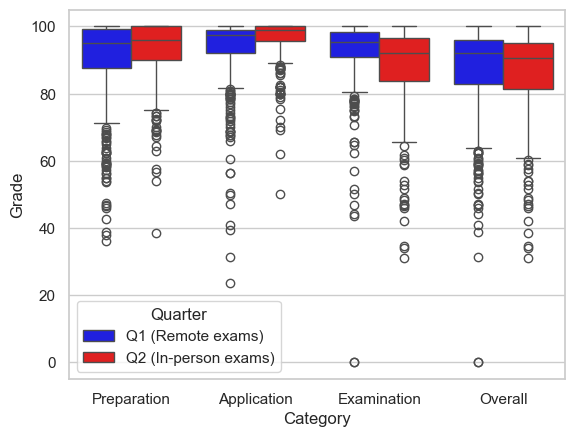

In [ ]:
plt.clf()
sns.boxplot(
    data=df_long,
    x="Category",
    y="Grade",
    hue="Quarter",
    palette=palette,
    showfliers=True,
)
plt.show()

### Correlating early performance with student outcomes

Inspired by Porter et. al 2014

In [ ]:
df1 = get_df(files[6])

df1['quarter'] = 'winter'
df1['year'] = 2025
df1['course'] = df1['quarter'].astype(str) + df1['year'].astype(str)
df1['exam_type'] = 'inperson'
df1['remote'] = df1['Section'].apply(lambda x: 'remote' if x == get_remote_section_name(df1) else 'in person')        


In [ ]:
df2 = get_df(files[7])

df2['quarter'] = 'fall'
df2['year'] = 2025
df2['course'] = df2['quarter'].astype(str) + df2['year'].astype(str)
df2['exam_type'] = 'inperson' 

In [ ]:
def select_and_rename(df):
    """ Selects columns from df that have '.1' in their name, 
        renames them by removing the ' (1)' suffix, 
        and returns the resulting dataframe.
    """
    renamed = {}
    df_cols = []
    new_df_cols = []
    for x in df.columns:
        print(x)
        if '.1' in x:
            renamed[x] = x.split(' (')[0]
            df_cols.append(x)
            new_df_cols.append(renamed[x])
        if x in ['quarter', 'year', 'course', 'exam_type',
                 'Preparation', 'Application', 'Examination', 
                 'Total', 'remote']:
            print(f'found {x}')
            df_cols.append(x)
            new_df_cols.append(x)

    df = df[df_cols]
    df = df.rename(columns=renamed)
    return df

df1_sel = select_and_rename(df1)
print('\n\n')
print(df2.columns.tolist())
df2_sel = select_and_rename(df2)
df1_sel['min_category'] = df1_sel[['Preparation','Application', 'Examination']].idxmin(axis=1)
df2_sel['min_category'] = df2_sel[['Preparation','Application', 'Examination']].idxmin(axis=1)


df = pd.concat([df1_sel, df2_sel], ignore_index=True)

# The quizzes are different between the quarters, 
# so we won't compare them, 
# but we can still look at the distribution of 
# which category is lowest per quarter

Section
Midterm (891463)
Final (891462)
Project 1 (891470)
Project 2 (891471)
Programming Assignment 1 (891464)
Programming Assignment 2 (891465)
Programming Assignment 3 (891466)
Programming Assignment 4 (891467)
Programming Assignment 5 (891468)
Programming Assignment 6 (891469)
Reading Quiz 2025-01-08 (891472)
Reading Quiz 2025-01-10 (912843)
Reading Quiz 2025-01-13 (913264)
Reading Quiz 2025-01-15 (913975)
Reading Quiz 2025-01-17 (914574)
Reading Quiz 2025-01-22 (915388)
Reading Quiz 2025-01-24 (915917)
Reading Quiz 2025-01-27 (916317)
Reading Quiz 2025-01-29 (916862)
Reading Quiz 2025-01-31 (917333)
Reading Quiz 2025-02-03 (917771)
Reading Quiz 2025-02-05 (918372)
Reading Quiz 2025-02-07 (918842)
Reading Quiz 2025-02-10 (919241)
Reading Quiz 2025-02-12 (919772)
Reading Quiz 2025-02-14 (920261)
Reading Quiz 2025-02-19 (921172)
Reading Quiz 2025-02-21 (921702)
Reading Quiz 2025-02-24 (922086)
Reading Quiz 2025-02-26 (923455)
Reading Quiz 2025-02-28 (925026)
Reading Quiz 2025-03-03 (

In [ ]:
df1_sel['atrisk2'] = df1_sel['Total'].apply(lambda x: True if x < 57.5 else False)
print(df1_sel['atrisk2'].sum())

df2_sel['atrisk2'] = df2_sel['Total'].apply(lambda x: True if x < 57.5 else False)
print(df2_sel['atrisk2'].sum())

print('\n\n')
print(len(df1_sel), len(df2_sel))

21
15



491 361


In [ ]:
df1_sel.sort_values('Total', inplace=True)
df2_sel.sort_values('Total', inplace=True)

df1_sel[['Total', 'Preparation', 'Application', 'Examination']].head(10)

,Total,Preparation,Application,Examination
26,0.000000,42.666667,39.450,0.000000
254,0.000000,37.866667,23.667,0.000000
475,31.317000,36.260000,31.317,78.389193
174,38.900000,38.900000,56.467,83.718194
246,41.000000,46.593333,41.000,43.529412
12,44.097127,47.493333,49.683,44.097127
233,46.073333,46.073333,86.450,91.825581
467,46.764706,92.000000,68.600,46.764706
416,46.880000,46.880000,71.783,62.324213
374,47.000000,69.766667,47.000,92.209986


subset1
subset2
subset3
subset4
subset5


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1895/3548791897.py:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1895/3548791897.py:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1895/3548791897.py:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1895/3548791897.py:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1895/3548791897.py:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


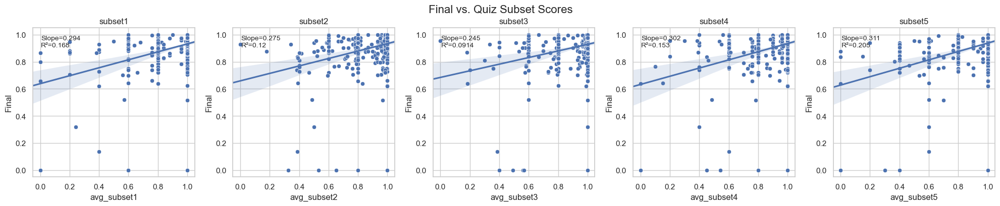

In [ ]:
qs = df1_sel.columns[10:35].tolist()
l = 5
data = df1_sel
y = 'Final'
kind = 'avg_' #  'avg_' or 'sum_'

qsubsets = {
    f'subset{i//l+1}': qs[i:i+l] for i in range(0, len(qs), l)   
}

for subset, qlist in qsubsets.items():
    print(subset)
    df1_sel[f'sum_{subset}'] = df1_sel[qlist].sum(axis=1)
    df1_sel[f'avg_{subset}'] = df1_sel[qlist].mean(axis=1)
    
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for ax, subset in zip(axes, qsubsets.keys()):
    sns.scatterplot(
        data=data,
        y=y,
        x=f'{kind}{subset}',
        palette='viridis',
        ax=ax
    )
    ax.set_title(subset)
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    sns.regplot(
        data=data,
        x=f'{kind}{subset}',
        y=y,
        scatter=False,
        ax=ax,
        truncate=False,
    )
    
    lr = linregress(data[f'{kind}{subset}'], data[y])
    slope = lr.slope
    r2 = lr.rvalue**2
    
    ax.text(
        0.05, 0.95,
        f"Slope={slope:.3g}\nR²={r2:.3g}",
        transform=ax.transAxes,
        ha="left", va="top",
        fontsize=10
    )
    
plt.tight_layout()
plt.suptitle(f'{y} vs. Quiz Subset Scores', fontsize=16, y=1.02)
plt.show()  

subset1
Slope=0.45, R²=0.184


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1895/422696792.py:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


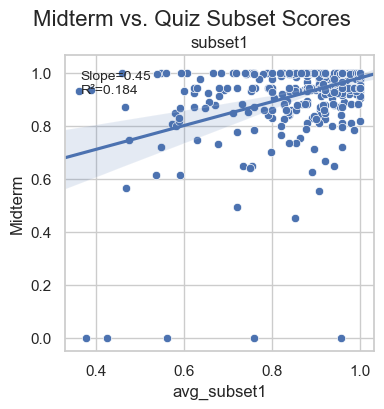

In [ ]:
qs = df1_sel.columns[10:35].tolist()
l = 25
data = df1_sel
y = 'Midterm'
kind = 'avg_' # or 'avg_'

qsubsets = {
    f'subset{i//l+1}': qs[i:i+l] for i in range(0, len(qs), l)   
}

for subset, qlist in qsubsets.items():
    print(subset)
    df1_sel[f'sum_{subset}'] = df1_sel[qlist].sum(axis=1)
    df1_sel[f'avg_{subset}'] = df1_sel[qlist].mean(axis=1)
    
fig, axes = plt.subplots(1, 1, figsize=(4, 4))

sns.scatterplot(
    data=data,
    y=y,
    x=f'{kind}{subset}',
    palette='viridis',
    ax=axes
)
axes.set_title(subset)
axes.set_xlabel("")
axes.set_ylabel("")

sns.regplot(
    data=data,
    x=f'{kind}{subset}',
    y=y,
    scatter=False,
    ax=axes,
    truncate=False,
)

lr = linregress(data[f'{kind}{subset}'], data[y])
slope = lr.slope
r2 = lr.rvalue**2

axes.text(
    0.05, 0.95,
    f"Slope={slope:.3g}\nR²={r2:.3g}",
    transform=axes.transAxes,
    ha="left", va="top",
    fontsize=10
)
print(f"Slope={slope:.3g}, R²={r2:.3g}")

plt.tight_layout()
plt.suptitle(f'{y} vs. Quiz Subset Scores', fontsize=16, y=1.02)
plt.show()  

/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1895/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'Preparation', 'n': 239, 'slope': np.float64(0.38520208374295345), 'r2': np.float64(0.2213041788951664)}, {'group': 'Application', 'n': 93, 'slope': np.float64(0.2319753845314881), 'r2': np.float64(0.26862874591815117)}, {'group': 'Examination', 'n': 159, 'slope': np.float64(1.1693355983131757), 'r2': np.float64(0.4292149986709194)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1895/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


[{'group': 'in person', 'n': 199, 'slope': np.float64(0.6139501097356538), 'r2': np.float64(0.2706767136571448)}, {'group': 'remote', 'n': 292, 'slope': np.float64(0.350580529781336), 'r2': np.float64(0.1327242685118223)}]
[{'group': 'winter2025', 'n': 491, 'slope': np.float64(0.45046036807289397), 'r2': np.float64(0.18394437649737613)}]


/var/folders/pv/hg29j3j512d8wd_qw_8g3msw0000gn/T/ipykernel_1895/734180028.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


(<seaborn.axisgrid.FacetGrid at 0x1a31698e0>,
 {'min_category':          group    n     slope        r2
  1  Application   93  0.231975  0.268629
  2  Examination  159  1.169336  0.429215
  0  Preparation  239  0.385202  0.221304,
  'remote':        group    n     slope        r2
  0  in person  199  0.613950  0.270677
  1     remote  292  0.350581  0.132724,
  'course':         group    n    slope        r2
  0  winter2025  491  0.45046  0.183944})

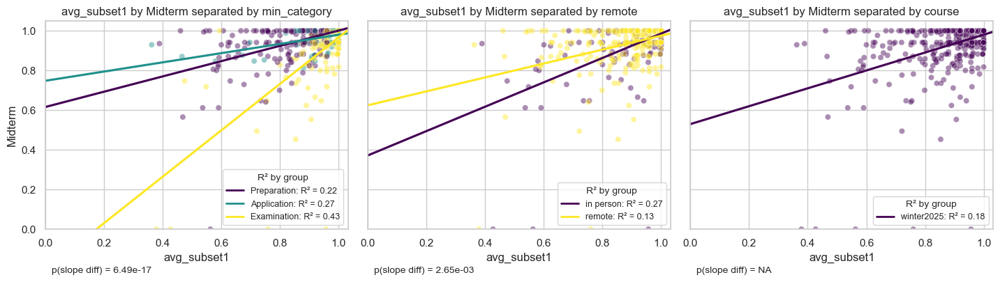

In [ ]:
make_three_panel_regression_figure(
    df=df1_sel,
    x='avg_subset1',
    y='Midterm',
    hue_vars=('min_category', 'remote','course'),
)

### Regression Analysis

In [72]:
df1 = get_df(files[6])
df2 = get_df(files[7])

df1['quarter'] = 'winter'
df1['year'] = 2025
df1['course'] = df1['quarter'].astype(str) + df1['year'].astype(str)
df1['exam_type'] = 'inperson'
df1['remote'] = df1['Section'].apply(lambda x: 'remote' if x == get_remote_section_name(df1) else 'in person')        

df2['quarter'] = 'fall'
df2['year'] = 2025
df2['course'] = df2['quarter'].astype(str) + df2['year'].astype(str)
df2['exam_type'] = 'inperson'    
df2['remote'] = df2['Section'].apply(lambda x: 'remote' if x == get_remote_section_name(df2) else 'in person')        


def select_and_rename(df):
    """ Selects columns from df that have '.1' in their name, 
        renames them by removing the ' (1)' suffix, 
        and returns the resulting dataframe.
    """
    renamed = {}
    df_cols = []
    new_df_cols = []
    for x in df.columns:
        if '.1' in x:
            renamed[x] = x.split(' (')[0]
            df_cols.append(x)
            new_df_cols.append(renamed[x])
        if x in ['quarter', 'year', 'course', 'exam_type',
                 'Preparation', 'Application', 'Examination', 
                 'Total', 'remote']:
            df_cols.append(x)
            new_df_cols.append(x)

    df = df[df_cols]
    df = df.rename(columns=renamed)
    return df

df1_sel = select_and_rename(df1)
df2_sel = select_and_rename(df2)
df1_sel['min_category'] = df1_sel[['Preparation','Application', 'Examination']].idxmin(axis=1)
df2_sel['min_category'] = df2_sel[['Preparation','Application', 'Examination']].idxmin(axis=1)


df = pd.concat([df1_sel, df2_sel], ignore_index=True)


In [73]:
data = df1_sel
y = 'Final'
y = 'Midterm'
y = 'Examination'


def get_reg_cols(df, s):
    return [col for col in df.columns if s in col]

reg_cols = get_reg_cols(df1_sel, 'Reading')
reg_cols += get_reg_cols(df1_sel, 'Programming')
reg_cols += get_reg_cols(df1_sel, 'Project')

f"{y} ~ " + " + ".join(reg_cols)
model = smf.ols(
    f'{y} ~ Q("' + '") + Q("'.join(reg_cols) + '")', 
    data=data).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            Examination   R-squared:                       0.562
Model:                            OLS   Adj. R-squared:                  0.531
Method:                 Least Squares   F-statistic:                     17.78
Date:                Tue, 09 Jun 2026   Prob (F-statistic):           1.91e-62
Time:                        23:35:12   Log-Likelihood:                -1625.4
No. Observations:                 491   AIC:                             3319.
Df Residuals:                     457   BIC:                             3462.
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

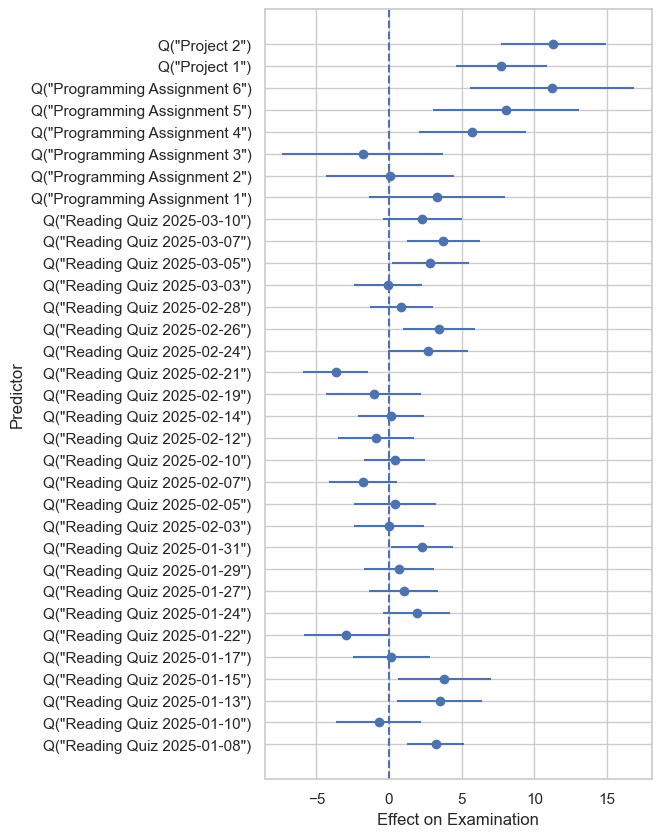

In [74]:
import pandas as pd
import matplotlib.pyplot as plt

coefs = model.params
conf = model.conf_int()
conf.columns = ["lower", "upper"]

df_plot = pd.concat([coefs, conf], axis=1).reset_index()
df_plot.columns = ["term", "coef", "lower", "upper"]

# remove intercept if you want
df_plot = df_plot[df_plot["term"] != "Intercept"]

fig, ax = plt.subplots(figsize=(5,10))

ax.errorbar(
    df_plot["coef"],
    df_plot["term"],
    xerr=[
        df_plot["coef"] - df_plot["lower"],
        df_plot["upper"] - df_plot["coef"]
    ],
    fmt='o'
)

ax.axvline(0, linestyle='--')
ax.set_xlabel("Effect on Examination")
ax.set_ylabel("Predictor")

plt.show()

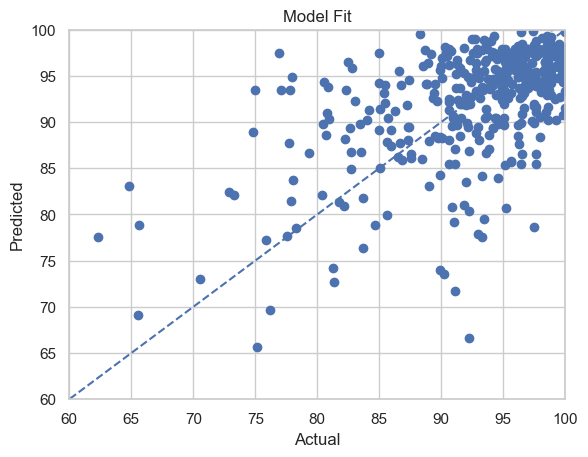

In [75]:
y_pred = model.predict(df)

plt.scatter(df["Examination"], y_pred)
plt.plot([0, 100], [0, 100], linestyle='--')  # perfect fit line

plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Model Fit")
plt.ylim(60, 100)
plt.xlim(60, 100)

plt.show()

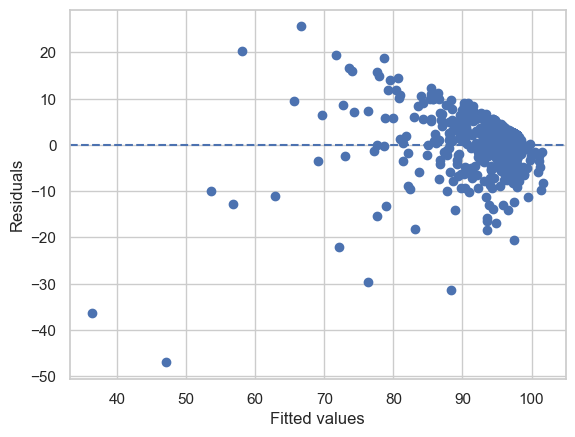

In [76]:
resid = model.resid
fitted = model.fittedvalues

plt.scatter(fitted, resid)
plt.axhline(0, linestyle='--')

plt.xlabel("Fitted values")
plt.ylabel("Residuals")

plt.show()

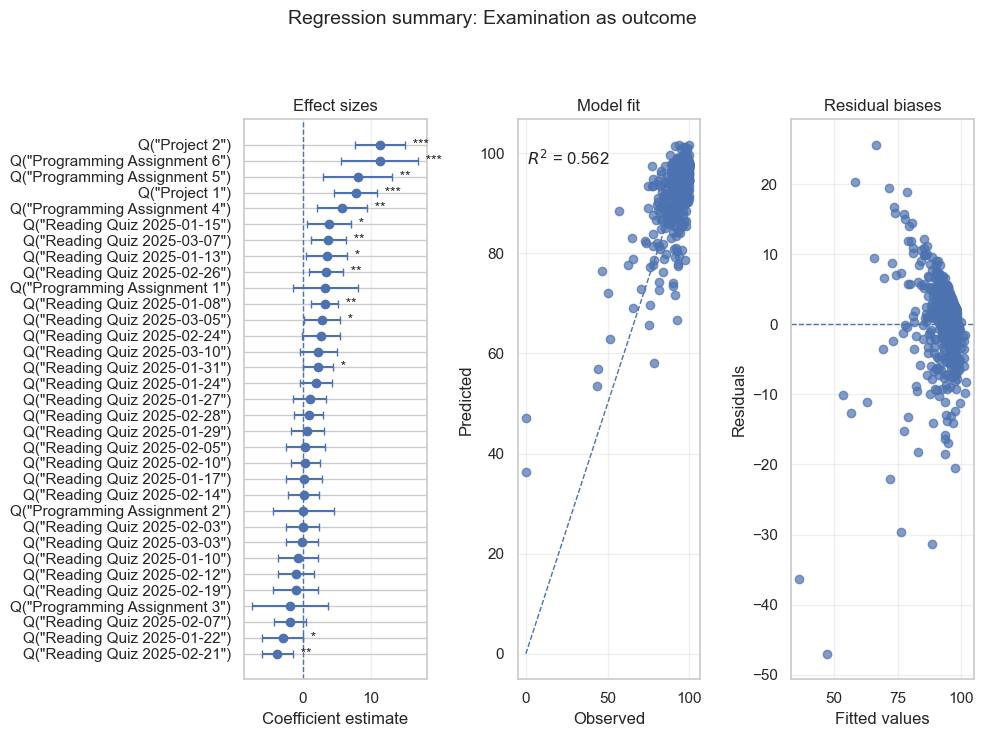

In [77]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_regression_summary_panels(
    model,
    df,
    outcome_col=None,
    rename_terms=None,
    figsize=(14, 4.5),
    title=None,
    color='blue'
):
    """
    Create a 3-panel regression summary figure:
      A) Coefficient plot with 95% CI
      B) Predicted vs actual
      C) Residuals vs fitted

    Parameters
    ----------
    model : statsmodels regression results object
        A fitted model from statsmodels, e.g. smf.ols(...).fit()
    df : pd.DataFrame
        DataFrame used for fitting
    outcome_col : str, optional
        Name of the outcome column. If None, tries to infer from model.model.endog_names
    rename_terms : dict, optional
        Mapping from model term names to prettier labels for plotting
    figsize : tuple
        Figure size
    title : str, optional
        Optional overall figure title

    Returns
    -------
    fig, axes
    """
    if outcome_col is None:
        outcome_col = model.model.endog_names

    if rename_terms is None:
        rename_terms = {}

    # -------------------------
    # Extract coefficient table
    # -------------------------
    coef = model.params.copy()
    conf = model.conf_int().copy()
    pvals = model.pvalues.copy()

    coef_df = pd.DataFrame({
        "term": coef.index,
        "coef": coef.values,
        "lower": conf[0].values,
        "upper": conf[1].values,
        "pval": pvals.values,
    })

    # Drop intercept for cleaner visualization
    coef_df = coef_df[coef_df["term"] != "Intercept"].copy()

    # Pretty labels
    coef_df["label"] = coef_df["term"].map(
        lambda x: rename_terms.get(x, x)
    )

    # Sort by coefficient magnitude or keep original order
    coef_df = coef_df.sort_values("coef")
    coef_df = coef_df.reset_index(drop=True)

    # Significance stars
    def stars(p):
        if p < 0.001:
            return "***"
        elif p < 0.01:
            return "**"
        elif p < 0.05:
            return "*"
        return ""

    coef_df["stars"] = coef_df["pval"].apply(stars)

    # -------------------------
    # Predictions and residuals
    # -------------------------
    y_true = df[outcome_col].values
    y_pred = model.predict(df)
    resid = model.resid
    fitted = model.fittedvalues

    # R^2
    r2 = model.rsquared if hasattr(model, "rsquared") else None

    # -------------------------
    # Plot
    # -------------------------
    fig, axes = plt.subplots(1, 3, figsize=figsize)
    ax0, ax1, ax2 = axes

    # =========================
    # Panel A: coefficient plot
    # =========================
    y_pos = np.arange(len(coef_df))

    xerr = np.vstack([
        coef_df["coef"] - coef_df["lower"],
        coef_df["upper"] - coef_df["coef"]
    ])

    ax0.errorbar(
        coef_df["coef"],
        y_pos,
        xerr=xerr,
        fmt="o",
        capsize=3,
    )
    ax0.axvline(0, linestyle="--", linewidth=1)
    ax0.set_yticks(y_pos)
    ax0.set_yticklabels(coef_df["label"])
    ax0.set_xlabel("Coefficient estimate")
    ax0.set_title("Effect sizes")
    ax0.grid(True, axis="x", alpha=0.3)
    ax0.set_axisbelow(True)

    # Add significance stars
    for i, row in coef_df.iterrows():
        ax0.text(
            row["upper"],
            i,
            f"  {row['stars']}",
            va="center",
            ha="left",
            fontsize=10,
        )

    # ==============================
    # Panel B: predicted vs. actual
    # ==============================
    ax1.scatter(y_true, y_pred, alpha=0.7)

    min_val = min(np.min(y_true), np.min(y_pred))
    max_val = max(np.max(y_true), np.max(y_pred))
    ax1.plot(
        [min_val, max_val],
        [min_val, max_val],
        linestyle="--",
        linewidth=1,
    )

    ax1.set_xlabel("Observed")
    ax1.set_ylabel("Predicted")
    ax1.set_title("Model fit")
    ax1.grid(True, alpha=0.3)
    ax1.set_axisbelow(True)

    if r2 is not None:
        ax1.text(
            0.05,
            0.95,
            f"$R^2$ = {r2:.3f}",
            transform=ax1.transAxes,
            ha="left",
            va="top",
        )

    # ==========================
    # Panel C: residuals vs fit
    # ==========================
    ax2.scatter(fitted, resid, alpha=0.7)
    ax2.axhline(0, linestyle="--", linewidth=1)
    ax2.set_xlabel("Fitted values")
    ax2.set_ylabel("Residuals")
    ax2.set_title("Residual biases")
    ax2.grid(True, alpha=0.3)
    ax2.set_axisbelow(True)

    if title is not None:
        fig.suptitle(title, y=1.05, fontsize=14)

    plt.tight_layout()
    return fig, axes

def get_reg_cols(df, s):
    return [col for col in df.columns if s in col]

data = df1_sel
y = 'Examination'

reg_cols = get_reg_cols(df1_sel, 'Reading')
reg_cols += get_reg_cols(df1_sel, 'Programming')
reg_cols += get_reg_cols(df1_sel, 'Project')

model = smf.ols(
    f'{y} ~ Q("' + '") + Q("'.join(reg_cols) + '")', 
    data=data).fit()

fig, axes = plot_regression_summary_panels(
    model=model,
    df=df1_sel,
    outcome_col=y,
    title=f"Regression summary: {y} as outcome",
    figsize=(10,7),

)

plt.show()

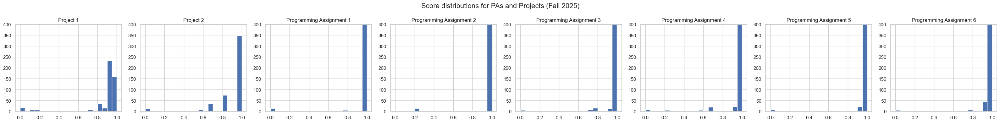

In [78]:
# If you were to visualize the score distributions for the individual PAs and Projects, 
# I bet you'd see a more bimodal distribution for the PAs + Project 1, 
# whereas I bet Project 2 has more values in the middle of the distribution.

data = df2_sel
if data.equals(df1_sel):
    title = "Score distributions for PAs and Projects (Winter 2025)"
else:
    title = "Score distributions for PAs and Projects (Fall 2025)"


cols = [x for x in data.columns if 'Proj' in x or 'Prog' in x]
pans = len(cols)

fig, axes = plt.subplots(1, pans, figsize=(4*pans, 4))
for ax, col in zip(axes, cols):
    df1_sel[col].hist(bins=20, ax=ax)
    ax.set_title(col)   
    ax.set_ylim(0,400)
plt.suptitle(title, fontsize=16)
plt.tight_layout()
plt.show()

### Using incremental number of RQ's

92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348


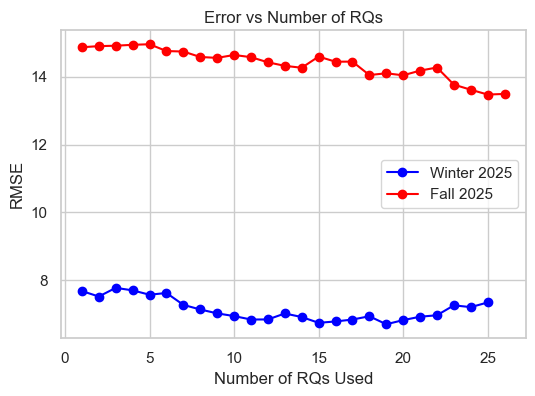

In [ ]:
#  I wonder if there's some type of regression that can be done 
# where the features are the RQ scores and the estimated value is Midterm, or Final, or "Examination" 
# do the regression with just 1 week of data, then 2 weeks of data, etc. 
# Or maybe even 1 RQ, then 2 RQs, then 3 RQs, etc. 
# And you'd be able to plot performance in a plot where 
# horizontal axis is "Number of RQs", vertical axis is RMSE, 
# and you have a point for regression from 1 RQ, from 2 RQs, etc.

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

fig, ax = plt.subplots(figsize=(6, 4))
target = "Examination"
colors = ['blue', 'red']

for data, color, label in zip([df1_sel, df2_sel], colors, ['Winter 2025', 'Fall 2025']):

    rq_cols = get_reg_cols(data, 'Reading')
    # ---- config ----
    rmse_values = []
    num_rqs = []

    # ---- loop over number of RQs ----
    for k in range(1, len(rq_cols) + 1):
        X = data[rq_cols[:k]]
        y = data[target]
        print(y.mean())
        
        # train/test split (important to avoid overfitting!)
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )
        
        # fit model
        model = LinearRegression()
        model.fit(X_train, y_train)
        
        # predict
        y_pred = model.predict(X_test)
        
        # compute RMSE
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        
        rmse_values.append(rmse)
        num_rqs.append(k)

    # ---- plot ----
    ax.plot(num_rqs, rmse_values, marker='o', color=color, label=label)
    
ax.set_xlabel("Number of RQs Used")
ax.legend()
ax.set_ylabel("RMSE")
ax.set_title("Error vs Number of RQs")
ax.grid(True)
plt.show()



92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
92.6256035450698
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348
88.25293167128348


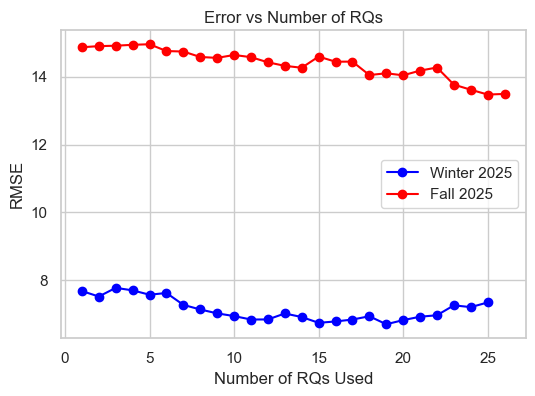

In [ ]:
#  I wonder if there's some type of regression that can be done 
# where the features are the RQ scores and the estimated value is Midterm, or Final, or "Examination" 
# do the regression with just 1 week of data, then 2 weeks of data, etc. 
# Or maybe even 1 RQ, then 2 RQs, then 3 RQs, etc. 
# And you'd be able to plot performance in a plot where 
# horizontal axis is "Number of RQs", vertical axis is RMSE, 
# and you have a point for regression from 1 RQ, from 2 RQs, etc.

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

fig, ax = plt.subplots(figsize=(6, 4))
target = "Examination"
colors = ['blue', 'red']

for data, color, label in zip([df1_sel, df2_sel], colors, ['Winter 2025', 'Fall 2025']):

    rq_cols = get_reg_cols(data, 'Reading')
    # ---- config ----
    rmse_values = []
    num_rqs = []

    # ---- loop over number of RQs ----
    for k in range(1, len(rq_cols) + 1):
        X = data[rq_cols[:k]]
        y = data[target]
        print(y.mean())
        
        # train/test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )
        
        # fit model
        model = LinearRegression()
        model.fit(X_train, y_train)
        
        # predict
        y_pred = model.predict(X_test)
        
        # compute RMSE
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        
        rmse_values.append(rmse)
        num_rqs.append(k)

    # ---- plot ----
    ax.plot(num_rqs, rmse_values, marker='o', color=color, label=label)
    
ax.set_xlabel("Number of RQs Used")
ax.legend()
ax.set_ylabel("RMSE")
ax.set_title("Error vs Number of RQs")
ax.grid(True)
plt.show()



### Incremental # of RQ's with all sklearn models

In [95]:
from sklearn.model_selection import cross_val_score
import numpy as np

from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, \
    recall_score, f1_score, auc, precision_recall_curve
import numpy as np

def report_error_bin(clf, X, y, cv=5):
    """
    Evaluates a binary classification model using cross-validation.
    
    Parameters:
    - clf: The classifier model (must have fit and predict_proba methods).
    - X: Feature matrix (pandas DataFrame or numpy array).
    - y: Target vector (binary labels).
    - cv: Number of cross-validation folds (default=5).
    
    Returns:
    - dict: Dictionary with mean scores for accuracy, 
    precision, recall, f1, and pr_auc.
    """
    np.random.seed(42)
    # Standard metrics
    scores = cross_validate(
        clf, X, y, cv=cv, scoring=['accuracy', 'precision', 'recall', 'f1'])
    
    # PR-AUC requires probabilities, so compute manually
    pr_aucs = []
    skf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=42)
    for train_index, test_index in skf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        clf.fit(X_train, y_train)
        y_proba = clf.predict_proba(X_test)[:, 1]  # Probability for positive class
        
        precision, recall, _ = precision_recall_curve(y_test, y_proba)
        pr_aucs.append(auc(recall, precision))
    
    result = {
        'accuracy': np.mean(scores['test_accuracy']),
        'precision': np.mean(scores['test_precision']),
        'recall': np.mean(scores['test_recall']),
        'f1': np.mean(scores['test_f1']),
        'pr_auc': np.mean(pr_aucs)
    }
    
    return result

def report_error_reg(clf, X, y, cv=5):
    
    # RMSE
    mse_scores = cross_val_score(clf, X, y, cv=cv, scoring='neg_mean_squared_error')
    rmse = np.sqrt(-mse_scores.mean())
    
    # MAE
    mae_scores = cross_val_score(clf, X, y, cv=cv, scoring='neg_mean_absolute_error')
    mae = -mae_scores.mean()
    
    # R²
    r2_scores = cross_val_score(clf, X, y, cv=cv, scoring='r2')
    r2 = r2_scores.mean()
    
    return {'rmse': rmse, 'mae': mae, 'r2': r2}



In [96]:
import sklearn

# models = {
#     'Linear Regression': {
#         'model': sklearn.linear_model.LinearRegression(),
#         'binary': False
#     },
#     'Ridge Regression': {
#         'model': sklearn.linear_model.Ridge(alpha=1.0),
#         'binary': False,
#     },
#     # 'Ridge Classifier': {
#     #     'model': sklearn.linear_model.RidgeClassifier(alpha=1.0),
#     #     'binary': True,
#     # },
#     'Lasso': {
#         'model': sklearn.linear_model.Lasso(alpha=1.0),
#         'binary': False,
#     },
#     'Baysean Ridge': {
#         'model': sklearn.linear_model.BayesianRidge(),
#         'binary': False,
#     },
#     'Linear SVC': {
#         'model': sklearn.svm.SVC(kernel='linear', probability=True),
#         'binary': True,
#     },
#     'Noninear SVC': {
#         'model': sklearn.svm.SVC(kernel='rbf', probability=True),
#         'binary': True,
#     },
#     'Quadratic Discriminant Analysis': {
#         'model': sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis(),
#         'binary': True,
#     },
#     'SVR': {
#         'model': sklearn.svm.SVR(kernel='rbf'),
#         'binary': False,
#     },
#     'KNN Classifier 5': {
#         'model': sklearn.neighbors.KNeighborsClassifier(n_neighbors=5),
#         'binary': True,
#     },
#      'KNN Regressor 5': {
#         'model': sklearn.neighbors.KNeighborsRegressor(n_neighbors=5),
#         'binary': False,
#     },
    
# }

error_fns = { # if binary, use classification metrics; else regression metrics
    True: report_error_bin,
    False: report_error_reg,
}

In [97]:
import inspect
import logging
from sklearn.utils import all_estimators

# --- set up logging ---
logging.basicConfig(
    filename='model_reg2.log',
    filemode='w',  # overwrite each run ('a' to append)
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s',
    force=True
)

def can_instantiate(cls):
    """Return True if cls can be instantiated with no required args."""
    try:
        sig = inspect.signature(cls)
        for param in sig.parameters.values():
            if (
                param.default is inspect._empty
                and param.kind in (
                    inspect.Parameter.POSITIONAL_ONLY,
                    inspect.Parameter.POSITIONAL_OR_KEYWORD,
                    inspect.Parameter.KEYWORD_ONLY,
                )
            ):
                return False
        return True
    except Exception as e:
        logging.warning(f'Failed to inspect {cls}: {e}')
        return False


def build_model_registry():
    models = {}
    failed_models = {}

    for name, cls in all_estimators(type_filter='classifier'):
        if can_instantiate(cls):
            try:
                models[name] = {
                    'model': cls(),
                    'binary': True,
                }
            except Exception as e:
                logging.error(f'Failed to instantiate classifier {name}: {e}')
        else:
            failed_models[name] = cls

    for name, cls in all_estimators(type_filter='regressor'):
        if can_instantiate(cls):
            try:
                models[name] = {
                    'model': cls(),
                    'binary': False,
                }
            except Exception as e:
                logging.error(f'Failed to instantiate regressor {name}: {e}')
        else:
            failed_models[name] = cls

    return models, failed_models


models, failed_models = build_model_registry()

# --- logging instead of print ---
logging.info(f'{len(models)} models loaded')
for x in models.keys():
    logging.info(f'LOADED: {x}')

logging.info('---')
logging.info(f'---{len(failed_models)} models failed to load')
for x in failed_models.keys():
    logging.info(f'FAILED: {x}')

In [98]:
def failing(df, threshold=57.5):
    df['atrisk'] = df['Total'] < threshold
    print(f"{sum(df['atrisk'])} failing students")
    return df

df1_sel = failing(df1_sel)
df2_sel = failing(df2_sel)

21 failing students
15 failing students


In [99]:
import math

def find_nrows(n_models, n_cols=4):
    return math.ceil(n_models / n_cols)


In [100]:

n_models = len(models)

results_bin = {}
results_reg = {}

empty_results_bin = {
    'x': [],
    'accuracy': [],
    'precision': [],
    'recall': [],
    'f1': [],
    'pr_auc': [],
}

empty_results_reg = {
    'x': [],
    'rmse': [],
    'mae': [],
    'r2': [],
}

models_bin = {k: v for k, v in models.items() if v['binary']}
models_reg = {k: v for k, v in models.items() if not v['binary']}

errors_reg = ['rmse', 'mae', 'r2']
errors_bin = ['accuracy', 'precision', 'recall', 'f1', 'pr_auc']

print(f"Number of models: {n_models}")
print(f"Number of binary models: {len(models_bin)}")
print(f"Number of regression models: {len(models_reg)}")

Number of models: 88
Number of binary models: 36
Number of regression models: 52


In [101]:
l1 = len([x for x in df1_sel.columns.tolist() if 'Reading' in x])
l2 = len([x for x in df2_sel.columns.tolist() if 'Reading' in x])

print(f"Number of Reading quizzes in df1_sel: {l1}")
print(f"Number of Reading quizzes in df2_sel: {l2}")

Number of Reading quizzes in df1_sel: 25
Number of Reading quizzes in df2_sel: 26


In [102]:
import warnings
import logging

warnings.filterwarnings("ignore")

def get_results_dict(models, error_fn, empty_results, df, response_col):
    results = {}

    rq_cols = get_reg_cols(df, 'Reading')
    logging.info(f"Found {len(rq_cols)} RQ columns")

    for model_name, info in models.items():
        logging.info(f"Evaluating {model_name}...")
        
        results[model_name] = {k: [] for k in empty_results.keys()}
        results[model_name]['x'] = []

        for k in range(1, len(rq_cols) + 1):
            X = df[rq_cols[:k]]
            y = df[response_col]

            try:
                per_k_results = error_fn(
                    clf=info['model'],
                    X=X,
                    y=y
                )

            except Exception:
                logging.exception(
                    f"Error evaluating {model_name} with {k} RQs "
                    f"(X shape={X.shape}, y shape={y.shape})"
                )
                continue

            # log success at a lower verbosity if you want
            logging.debug(
                f"{model_name} | k={k} | results={per_k_results}"
            )

            for key, value in per_k_results.items():
                results[model_name][key].append(value)
                print(model_name, key, value, k)

            results[model_name]['x'].append(k)

    logging.info("Finished evaluating all models")
    return results

In [ ]:
import pickle

# SAVE
# with open('out/pickles/results1_bin.pkl', 'wb') as f:
#     pickle.dump(results1_bin, f)
    
# with open('out/pickles/results1_reg.pkl', 'wb') as f:
#     pickle.dump(results1_reg, f)
    
# with open('out/pickles/results2_bin.pkl', 'wb') as f:
#     pickle.dump(results2_bin, f)
    
# with open('out/pickles/results2_reg.pkl', 'wb') as f:
#     pickle.dump(results2_reg, f)
    
    
# # LOAD
# with open('out/pickles/results1_bin.pkl', 'rb') as f:
#     results1_bin = pickle.load(f)

# with open('out/pickles/results1_reg.pkl', 'rb') as f:
#     results1_reg = pickle.load(f)

# with open('out/pickles/results2_bin.pkl', 'rb') as f:
#     results2_bin = pickle.load(f)

# with open('out/pickles/results2_reg.pkl', 'rb') as f:
#     results2_reg = pickle.load(f)

In [103]:
# DATASET1

results1_bin = get_results_dict(
    models=models_bin,
    error_fn=report_error_bin,
    empty_results=empty_results_bin,
    df=df1_sel,
    response_col='atrisk'
)

# results1_reg = get_results_dict(
#     models=models_reg,
#     error_fn=report_error_reg,
#     empty_results=empty_results_reg,
#     df=df1_sel,
#     response_col='Total'
# )

AdaBoostClassifier accuracy 0.9572459286745001 1
AdaBoostClassifier precision 0.0 1
AdaBoostClassifier recall 0.0 1
AdaBoostClassifier f1 0.0 1
AdaBoostClassifier pr_auc 0.18219610172617692 1
AdaBoostClassifier accuracy 0.9572459286745001 2
AdaBoostClassifier precision 0.0 2
AdaBoostClassifier recall 0.0 2
AdaBoostClassifier f1 0.0 2
AdaBoostClassifier pr_auc 0.118476046512149 2
AdaBoostClassifier accuracy 0.9572459286745001 3
AdaBoostClassifier precision 0.0 3
AdaBoostClassifier recall 0.0 3
AdaBoostClassifier f1 0.0 3
AdaBoostClassifier pr_auc 0.200529765303488 3
AdaBoostClassifier accuracy 0.9511234796949083 4
AdaBoostClassifier precision 0.04 4
AdaBoostClassifier recall 0.05 4
AdaBoostClassifier f1 0.04444444444444444 4
AdaBoostClassifier pr_auc 0.1679147128970407 4
AdaBoostClassifier accuracy 0.9511440940012369 5
AdaBoostClassifier precision 0.1 5
AdaBoostClassifier recall 0.05 5
AdaBoostClassifier f1 0.06666666666666667 5
AdaBoostClassifier pr_auc 0.2234320371641359 5
AdaBoostCla

In [ ]:
# DATASET2

# results2_bin = get_results_dict(
#     models=models_bin,
#     error_fn=report_error_bin,
#     empty_results=empty_results_bin,
#     df=df2_sel,
#     response_col='atrisk'
# )

# results2_reg = get_results_dict(
#     models=models_reg,
#     error_fn=report_error_reg,
#     empty_results=empty_results_reg,
#     df=df2_sel,
#     response_col='Total'
# )

In [104]:

# SAVE RESULTS

def make_metric_dfs(d, add=None):

    """ Transforms the nested results dictionary into a dictionary of DataFrames,
        where each DataFrame corresponds to a metric and has columns for 'x' and the metric values for each classifier.
        If 'add' is provided, it will append to the existing DataFrames instead of creating new ones.
    """

    classifiers = list(d.keys())
    if add is None:
        metric_dfs = {}
    else:
        metric_dfs = add
        
    for metric in d[classifiers[0]].keys():
        metric_dfs[metric] = pd.DataFrame({'x': d[classifiers[0]]['x']})
        for classifier in classifiers:

            if metric == 'x':
                continue
            
            data = d[classifier][metric]
            x = d[classifier]['x']
            data = data + [None] * (len(x) - len(data))  # Pad with None if lengths differ
            df = pd.DataFrame({'x': x, classifier: data})
            metric_dfs[metric] = pd.merge(
                metric_dfs[metric], 
                df,
                on='x', 
                how='outer')
            
    return metric_dfs

# metric_dfs1 = make_metric_dfs(results1_bin, None)
# metric_dfs1 = make_metric_dfs(results1_reg, metric_dfs1)

# metric_dfs2 = make_metric_dfs(results2_reg, None)
# metric_dfs2 = make_metric_dfs(results2_bin, metric_dfs2)

In [105]:
def save_df_dict_to_csv(df_dict, out_dir, index=False, prefix=None):
    os.makedirs(out_dir, exist_ok=True)

    for name, df in df_dict.items():
        if isinstance(df, pd.DataFrame):
            safe_name = re.sub(r'[^\w\-. ]', '_', str(name)).strip()
            filename = f"{prefix + '_' if prefix else ''}{safe_name}.csv"
            path = os.path.join(out_dir, filename)
            df.to_csv(path, index=index)
        else:
            print(f"Skipping {name!r}: not a pandas DataFrame.")
            
# save_df_dict_to_csv(metric_dfs, 'out/model_comparison', index=False)

In [106]:
def get_subplot_inds(ncols, k):
    
    i = k // ncols
    j = k % ncols
    return i, j

In [107]:
def plot_errors1(results, errors, nrows, ncols, scale):
    """ Simple error plotting function that takes in 
        one results dictionary and plots each metric 
        in a separate subplot.
        in: results, errors, nrows, ncols, scale
        scale is kind of broken because of the fat legend, 
        but it controls the overall size of the figure.
    """
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(scale*ncols, scale*nrows))

    for model, info in results.items():
        
        for i, metric in enumerate(errors):
            
            r, c = get_subplot_inds(ncols, i)
            
            axes[r][c].plot(info['x'], info[metric], marker='o', label=model)
            axes[r][c].set_xlabel('# of RQs Used')
            axes[r][c].set_ylabel(metric)
            # axes[r][c].legend()
            
    fig.suptitle('Model Performance Comparison')
    fig.set_tight_layout(True)
    return fig

nrows, ncols = 2, 3
scale = 6
# f = plot_errors1(results1_bin, errors_bin, nrows, ncols, scale)
# plt.savefig('out/model_comparison_binary.svg')

IndexError: index 2 is out of bounds for axis 0 with size 2

<Figure size 640x480 with 0 Axes>

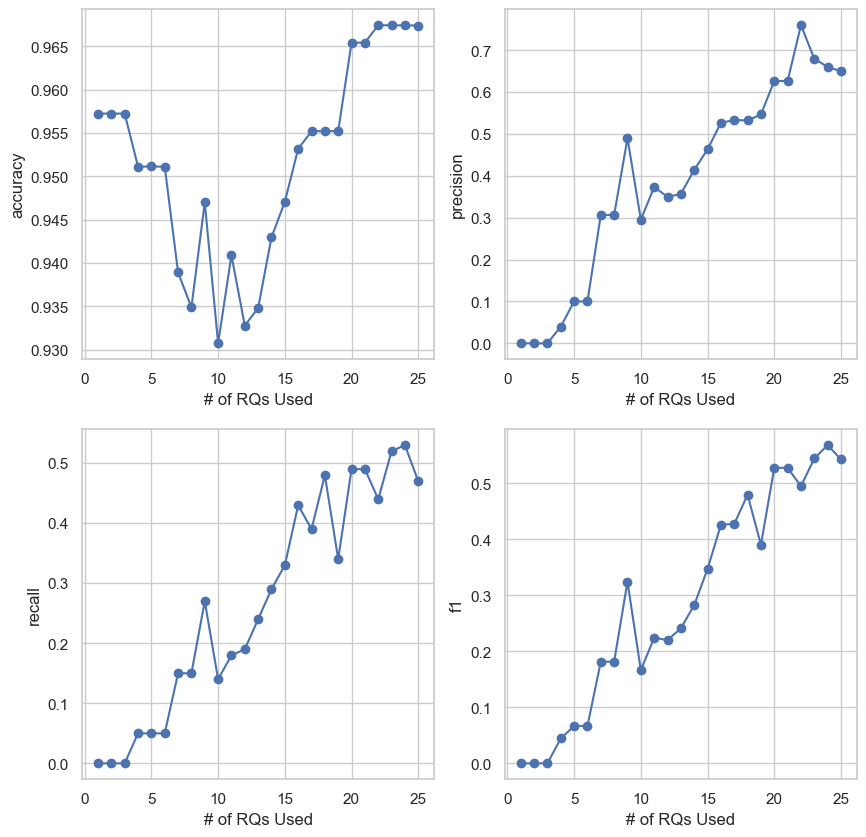

In [109]:
plt.clf()
errors_reg = ['rmse', 'mae', 'r2']
nrows, ncols = 2, 2
scale = 5
f = plot_errors1(results1_bin, errors_bin, nrows, ncols, scale)
# plt.savefig('out/model_comparison_regression.svg')

NameError: name 'results2_bin' is not defined

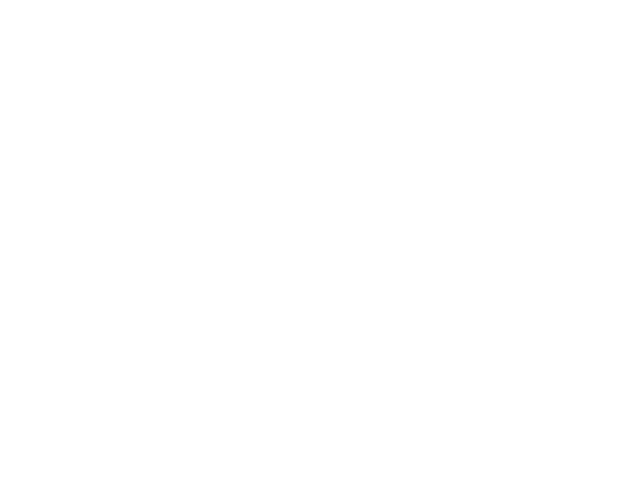

In [110]:
import mplcursors
import matplotlib
%matplotlib widget
plt.clf()

def plot_errors(results1, results2, errors, nrows, ncols, scale, 
                ylim=None, threshold=None, 
                thresh_direction=None,
                limit_models_to=None,
                fontsize=5,
                figsize=(10,30)):
    """ Enhanced error plotting function that can take in two results dictionaries
        and plot them on the same axes for comparison.
        It also allows for optional y-axis limits and threshold-based filtering of models."""
    
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    cmap = plt.get_cmap('viridis')
    
    if limit_models_to:
        results1 = {k: v for k, v in results1.items() if k in limit_models_to}
        results2 = {k: v for k, v in results2.items() if k in limit_models_to}
        
    models = set(results1.keys()) | set(results2.keys())
        
    color_array = cmap(np.linspace(0, 1, len(models)))
    colors = {model: color for model, color in zip(models, color_array)}
    plotted_lines = []  # for adding cursor interactivity later

    def add_errors_to_plot(results, line_type, marker, axes=axes, colors=colors):
        
        for model, info in results.items():
            
            for i, metric in enumerate(errors):
                
                r, c = get_subplot_inds(ncols, i)

                x = info['x']
                y = info[metric]
                
                if threshold and thresh_direction == 'higher':
                    try:
                        if max(y) < threshold[metric]:
                            continue
                    except:
                        pass
                    
                if threshold and thresh_direction == 'lower':
                    try:
                        if min(y) > threshold[metric]:
                            continue
                    except:
                        pass
                if len(y) == 0:
                    continue
                if len(x) != len(y):
                    print(f"Warning: length mismatch for {model} on {metric} (x: {len(x)}, y: {len(y)})")
                    x = x[:len(y)]
                    
                line, = axes[i].plot(x, y, 
                                marker=marker,
                                label=model, 
                                linestyle=line_type, 
                                color=colors[model])
                axes[i].set_xlabel('# of RQs Used')
                axes[i].set_ylabel(metric)
                
                if ylim and metric in ylim:
                    axes[i].set_ylim(ylim[metric])
                    
                # store metadata on the line for hover display
                line._hover_model = model
                line._hover_metric = metric
                line._hover_dataset = marker
                
                plotted_lines.append(line)
                    
        return axes
    axes = add_errors_to_plot(results1, line_type='-', marker='o')
    axes = add_errors_to_plot(results2, line_type='--', marker='x')
    
    def add_legend(axes, fontsize=fontsize):
        # put legend only on bottom-right subplot
        legend_ax = axes[-1]
        handles, labels = axes[0].get_legend_handles_labels()
        print(handles, labels)

        # split 
        k = len(handles)//2
        spring_handles = handles[:k]
        spring_labels = labels[:k]

        fall_handles = handles[k:]
        fall_labels = labels[k:]

        header_spring = Line2D([], [], linestyle='none', label='Spring 2025')
        header_fall = Line2D([], [], linestyle='none', label='Fall 2025')

        handles = [header_spring] + spring_handles + [header_fall] + fall_handles
        labels = [h.get_label() for h in handles]

        legend = legend_ax.legend(
            handles,
            labels,
            loc='center',
            frameon=True,
            fontsize=fontsize,
        )    
        
        # bold section headers
        for text, label in zip(legend.get_texts(), labels):
            if label in ['Spring 2025', 'Fall 2025']:
                text.set_weight('bold')
                
        return axes
    axes = add_legend(axes)
    axes[-1].grid(False)  # remove grid from legend subplot
    axes[-1].axis('off')
            
    fig.suptitle('Model Performance Comparison')
    fig.set_tight_layout(True)
    
    # # attach hover to all plotted lines
    # cursor = mplcursors.cursor(plotted_lines, hover=True)

    # @cursor.connect("add")
    # def on_add(sel):
    #     line = sel.artist
    #     x, y = sel.target

    #     sel.annotation.set_text(
    #         f"Dataset: {line._hover_dataset}\n"
    #         f"Model: {line._hover_model}\n"
    #         f"Metric: {line._hover_metric}\n"
    #         f"# RQs: {x:.0f}\n"
    #         f"Value: {y:.3f}"
    #     )
    
    return fig

binary_errors = ['accuracy', 'precision', 'recall', 'f1', 'pr_auc']
nrows, ncols = 6,1
scale = 6
plt.clf()

f = plot_errors(results1_bin, results2_bin, 
                binary_errors, nrows, ncols, scale,
                # threshold={'pr_auc': 0.7, 
                #            'accuracy': 0.93,
                #            'precision': 0.8,
                #            'recall': 0.4,
                #            'f1': 0.7},
                ylim=None,
                figsize=(6,20),
                # thresh_direction='higher'
)
plt.tight_layout()
plt.show()
# import mpld3

# mpld3.save_html(f, "out/model_comparison_binary_interactive_full.html")
# f.savefig('out/model_comparison_binary_full_long.svg')

Handles: 26, Labels: 26
Handles: 26, Labels: 26
Handles: 26, Labels: 26
Handles: 26, Labels: 26
Handles: 26, Labels: 26
Length of handles1: 26, Length of labels1: 26


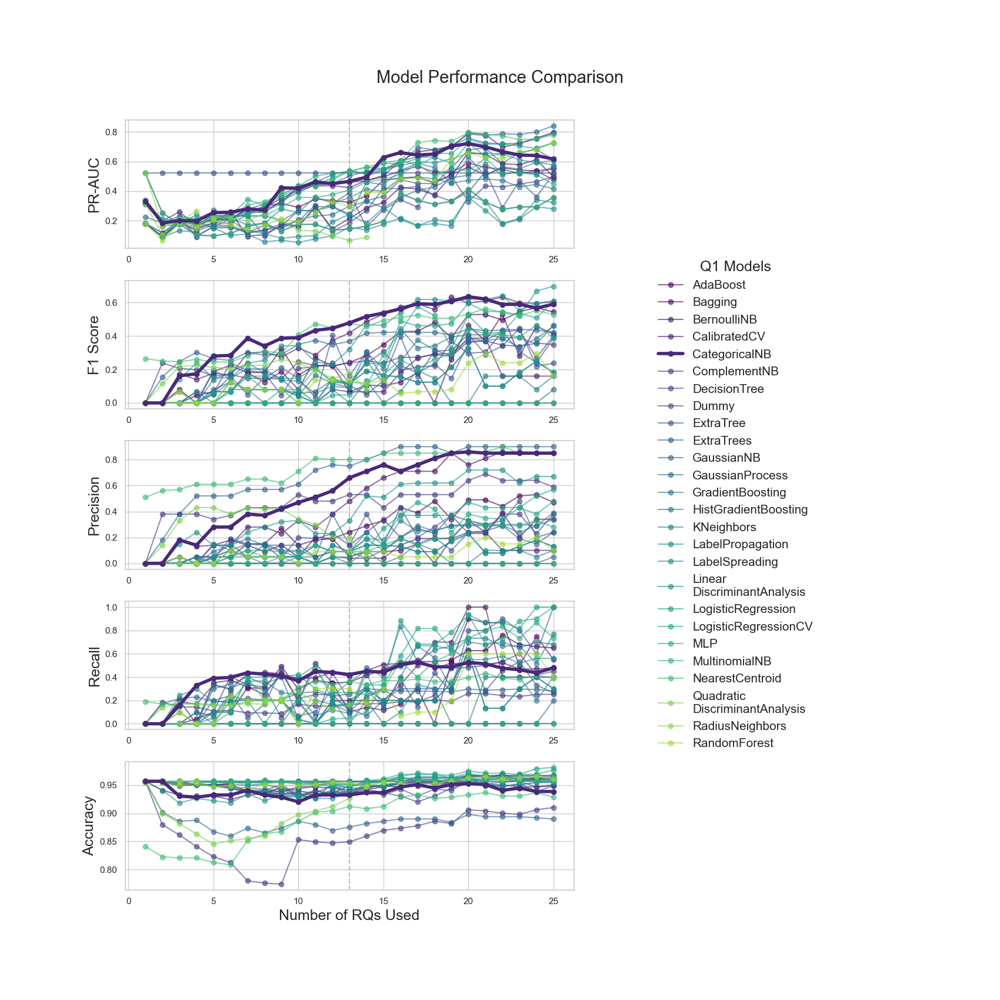

In [112]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from matplotlib.lines import Line2D

def plot_errors_gs(results1, results2, 
                errors=["pr_auc",   "f1", "recall", "precision", "accuracy"],
                ylabs=["PR-AUC", "F1 Score", "Precision", "Recall", "Accuracy"],
                special_model='CategoricalNB',
                ylim=None, threshold=None, 
                thresh_direction=None,
                limit_models_to=None,
                fontsize=5,
                figsize=(17, 17),
                width_ratios=[5, 2, 2],
                vline_at=13):
    """
    Plot model errors with a dedicated GridSpec legend column.
    """

    fig = plt.figure(figsize=figsize)

    # Main layout: plots on left, legend on right
    gs = gridspec.GridSpec(
        nrows=len(errors),
        ncols=3,
        width_ratios=width_ratios,
        wspace=0.35,
        hspace=0.25,
        figure=fig,
    )

    axes = [fig.add_subplot(gs[i, 0]) for i in range(len(errors))]
    
    legend_ax1 = fig.add_subplot(gs[:, 1])
    legend_ax2 = fig.add_subplot(gs[:, 2])
    
    legend_ax1.axis("off")
    legend_ax2.axis("off")

    cmap = plt.get_cmap("viridis")
    
    if limit_models_to:
        results1 = {k: v for k, v in results1.items() if k in limit_models_to}
        results2 = {k: v for k, v in results2.items() if k in limit_models_to}
        
    # models = sorted(set(results1.keys()) | set(results2.keys()))
    models = sorted(set(results1.keys()))    
        
    color_array = cmap(np.linspace(0, 1, len(models)))
    colors = {model: color for model, color in zip(models, color_array)}

    plotted_lines = []

    def add_errors_to_plot(results, line_type, marker, dataset_label):
        for model, info in results.items():
            for i, metric in enumerate(errors):

                ax = axes[i]

                x = info["x"]
                y = info[metric]
                
                if threshold and thresh_direction == "higher":
                    try:
                        if max(y) < threshold[metric]:
                            continue
                    except Exception:
                        pass
                    
                if threshold and thresh_direction == "lower":
                    try:
                        if min(y) > threshold[metric]:
                            continue
                    except Exception:
                        pass

                if len(y) == 0:
                    continue

                if len(x) != len(y):
                    print(
                        f"Warning: length mismatch for {model} on {metric} "
                        f"(x: {len(x)}, y: {len(y)})"
                    )
                    x = x[:len(y)]
                    
                is_special = model == special_model
                line, = ax.plot(
                    x, y,
                    marker=marker,
                    label=f"{model} {dataset_label}",
                    linestyle=line_type,
                    color=colors[model],
                    linewidth=4 if is_special else 1.5,
                    zorder=10 if is_special else 1,
                    alpha=1.0 if is_special else 0.6
                )

                # x and y labels only on leftmost plots
                ax.set_ylabel(ylabs[i], fontsize=fontsize+3)
                if i == len(errors) - 1:
                    ax.set_xlabel("Number of RQs Used", fontsize=fontsize+3)
                else:
                    ax.set_xlabel("")

                if ylim and metric in ylim:
                    ax.set_ylim(ylim[metric])

                # # old mplcursors hover metadata
                # line._hover_model = model
                # line._hover_metric = metric
                # line._hover_dataset = dataset_label

                # plotted_lines.append(line)

    add_errors_to_plot(results1, line_type="-", marker="o", dataset_label="Q1")
    # add_errors_to_plot(results2, line_type="--", marker="x", dataset_label="Q2")

    # Build legend manually from model colors
    # Get one handle per model
    handles1 = []
    # handles2 = []
    
    labels1 = []
    # labels2 = []
    
    seen = set()

    def process_label(label):
        """ Text processing to make model names more readable in the legend."""
        label = label.replace(" Q1", "").replace(" Q2", "")
        label = label.replace("Classifier", "")
        label = label.replace("DiscriminantAnalysis", "\nDiscriminantAnalysis")
        
        return label.strip()

    for ax in axes:
        h, l = ax.get_legend_handles_labels()
        print(f"Handles: {len(h)}, Labels: {len(l)}")
        for handle, label in zip(h, l):
            if label not in seen:
                if "Q1" in label:
                    handles1.append(handle)
                    labels1.append(process_label(label))
                elif "Q2" in label:
                    handles2.append(handle)
                    labels2.append(process_label(label))
                seen.add(label)

        if vline_at:
            ax.axvline(vline_at, color='gray', linestyle='--', alpha=0.5)

        
    print(f"Length of handles1: {len(handles1)}, Length of labels1: {len(labels1)}")
    # print(f"Length of handles2: {len(handles2)}, Length of labels2: {len(labels2)}")
    # Split legend into two columns manually

    legend_ax1.legend(
        handles1,
        labels1,
        loc="center left",
        frameon=False,
        fontsize=fontsize,
        title_fontsize=fontsize+3,
        title="Q1 Models"
    )

    # legend_ax2.legend(
    #     handles2,
    #     labels2,
    #     loc="center left",
    #     frameon=False,
    #     fontsize=fontsize,
    #     title_fontsize=fontsize+3,
    #     title="Q2 Models"
    # )
    
    fig.suptitle(
        "Model Performance Comparison",
        fontsize=fontsize+6,
        y=0.93
    )

    return fig

binary_errors = ["pr_auc",  "precision", "f1", "recall", "accuracy" ]

plt.clf()

f = plot_errors_gs(
    results1_bin,
    # results2_bin,
    [],
    ylim=None,
    figsize=(17, 17),
    fontsize=15,
    width_ratios=[5, 1, 1]
)

plt.tight_layout()
# plt.savefig("out/model_comparison_binary_full_long_gs.svg")
plt.show()

[<matplotlib.lines.Line2D object at 0x1a5418740>, <matplotlib.lines.Line2D object at 0x1a5394080>, <matplotlib.lines.Line2D object at 0x1a53943e0>, <matplotlib.lines.Line2D object at 0x1a5397da0>, <matplotlib.lines.Line2D object at 0x1a533df40>, <matplotlib.lines.Line2D object at 0x1a533c9b0>, <matplotlib.lines.Line2D object at 0x1a50812b0>, <matplotlib.lines.Line2D object at 0x1a5083350>, <matplotlib.lines.Line2D object at 0x1a5082cf0>, <matplotlib.lines.Line2D object at 0x1a4ff48f0>, <matplotlib.lines.Line2D object at 0x1a4ff7860>, <matplotlib.lines.Line2D object at 0x1a4ff61b0>, <matplotlib.lines.Line2D object at 0x1a535cb60>, <matplotlib.lines.Line2D object at 0x1a535e120>, <matplotlib.lines.Line2D object at 0x1a535d310>, <matplotlib.lines.Line2D object at 0x1a4f68dd0>, <matplotlib.lines.Line2D object at 0x1a4f68590>, <matplotlib.lines.Line2D object at 0x1a5148a10>, <matplotlib.lines.Line2D object at 0x1a5148c80>, <matplotlib.lines.Line2D object at 0x1a514b710>, <matplotlib.lines.L

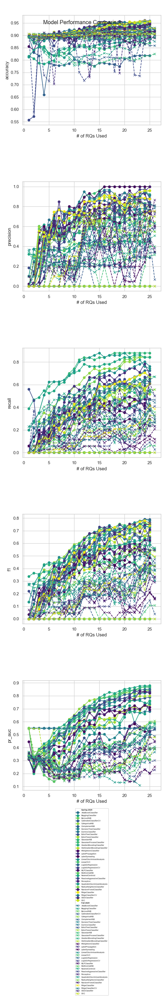

In [ ]:

def plot_errors(results1, results2, errors, nrows, ncols, scale, 
                ylim=None, threshold=None, 
                thresh_direction=None,
                limit_models_to=None,
                fontsize=5):
    """ Enhanced error plotting function that can take in two results dictionaries
        and plot them on the same axes for comparison.
        It also allows for optional y-axis limits and threshold-based filtering of models."""
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(scale*ncols, scale*nrows))
    cmap = plt.get_cmap('viridis')
    
    if limit_models_to:
        results1 = {k: v for k, v in results1.items() if k in limit_models_to}
        results2 = {k: v for k, v in results2.items() if k in limit_models_to}
        
    models = set(results1.keys()) | set(results2.keys())
        
    color_array = cmap(np.linspace(0, 1, len(models)))
    colors = {model: color for model, color in zip(models, color_array)}
    plotted_lines = []  # for adding cursor interactivity later

    def add_errors_to_plot(results, line_type, marker, axes=axes, colors=colors):
        
        for model, info in results.items():
            
            for i, metric in enumerate(errors):
                
                r, c = get_subplot_inds(ncols, i)

                x = info['x']
                y = info[metric]
                
                if threshold and thresh_direction == 'higher':
                    try:
                        if max(y) < threshold[metric]:
                            continue
                    except:
                        pass
                    
                if threshold and thresh_direction == 'lower':
                    try:
                        if min(y) > threshold[metric]:
                            continue
                    except:
                        pass
                if len(y) == 0:
                    continue
                if len(x) != len(y):
                    print(f"Warning: length mismatch for {model} on {metric} (x: {len(x)}, y: {len(y)})")
                    x = x[:len(y)]
                    
                line, = axes[i].plot(x, y, 
                                marker=marker,
                                label=model, 
                                linestyle=line_type, 
                                color=colors[model])
                axes[i].set_xlabel('# of RQs Used')
                axes[i].set_ylabel(metric)
                
                if ylim and metric in ylim:
                    axes[i].set_ylim(ylim[metric])
                    
                # store metadata on the line for hover display
                line._hover_model = model
                line._hover_metric = metric
                line._hover_dataset = marker
                
                plotted_lines.append(line)
                    
        return axes
    axes = add_errors_to_plot(results1, line_type='-', marker='o')
    axes = add_errors_to_plot(results2, line_type='--', marker='x')
    
    def add_legend(axes, fontsize=fontsize):
        # put legend only on bottom-right subplot
        legend_ax = axes[-1]
        handles, labels = axes[0].get_legend_handles_labels()
        print(handles, labels)

        # split 
        k = len(handles)//2
        spring_handles = handles[:k]
        spring_labels = labels[:k]

        fall_handles = handles[k:]
        fall_labels = labels[k:]

        header_spring = Line2D([], [], linestyle='none', label='Spring 2025')
        header_fall = Line2D([], [], linestyle='none', label='Fall 2025')

        handles = [header_spring] + spring_handles + [header_fall] + fall_handles
        labels = [h.get_label() for h in handles]

        legend = legend_ax.legend(
            handles,
            labels,
            loc='center',
            frameon=True,
            fontsize=fontsize,
        )    
        
        # bold section headers
        for text, label in zip(legend.get_texts(), labels):
            if label in ['Spring 2025', 'Fall 2025']:
                text.set_weight('bold')
                
        return axes
    axes = add_legend(axes)
    axes[-1].grid(False)  # remove grid from legend subplot
    axes[-1].axis('off')
            
    fig.suptitle('Model Performance Comparison')
    fig.set_tight_layout(True)
    
    # # attach hover to all plotted lines
    # cursor = mplcursors.cursor(plotted_lines, hover=True)

    # @cursor.connect("add")
    # def on_add(sel):
    #     line = sel.artist
    #     x, y = sel.target

    #     sel.annotation.set_text(
    #         f"Dataset: {line._hover_dataset}\n"
    #         f"Model: {line._hover_model}\n"
    #         f"Metric: {line._hover_metric}\n"
    #         f"# RQs: {x:.0f}\n"
    #         f"Value: {y:.3f}"
    #     )
    
    return fig

binary_errors = ['accuracy', 'precision', 'recall', 'f1', 'pr_auc']
nrows, ncols = 6,1
scale = 6
plt.clf()

f = plot_errors(results1_bin, results2_bin, 
                binary_errors, nrows, ncols, scale,
                # threshold={'pr_auc': 0.7, 
                #            'accuracy': 0.93,
                #            'precision': 0.8,
                #            'recall': 0.4,
                #            'f1': 0.7},
                ylim=None,
                # thresh_direction='higher'
)

# import mpld3

# mpld3.save_html(f, "out/model_comparison_binary_interactive_full.html")
# f.savefig('out/model_comparison_binary_full.svg')

AttributeError: 'numpy.ndarray' object has no attribute 'plot'

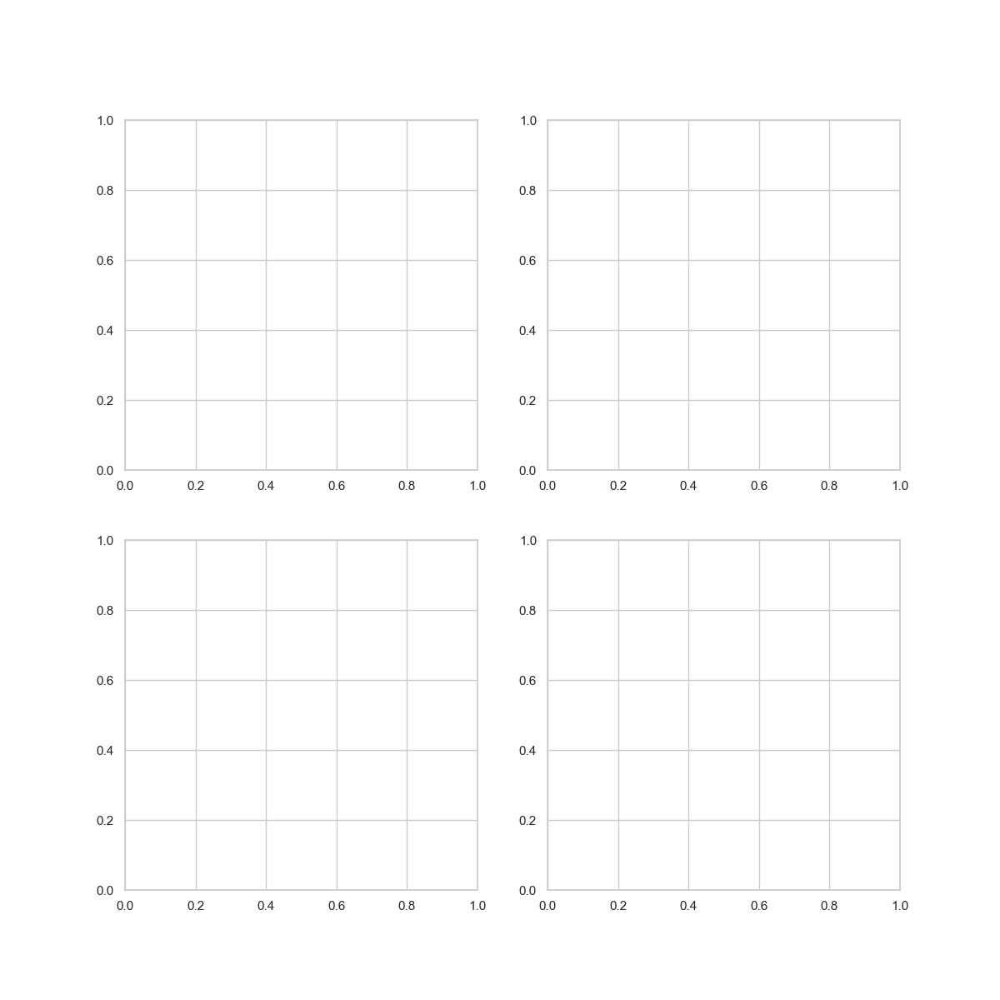

In [ ]:
# binary_errors = ['accuracy', 'precision', 'recall', 'f1', 'pr_auc']
# nrows, ncols = 2,2
# scale = 6
# plt.clf()

# f = plot_errors(results1_reg, results2_reg, 
#                 errors_reg, nrows, ncols, scale,
#                 ylim={'rmse': (0, 17), 'mae': (0, 20), 'r2': (-.05, 1)},
#                 # threshold={'rmse': 10, 'mae': 5, 'r2': 0.5},
# )
# f.savefig('out/model_comparison_regression_full.svg')

ClassifierChain: Not enough data points to get pr_auc at 13 RQs
LinearSVC: Not enough data points to get pr_auc at 13 RQs
NuSVC: Not enough data points to get pr_auc at 13 RQs
PassiveAggressiveClassifier: Not enough data points to get pr_auc at 13 RQs
Perceptron: Not enough data points to get pr_auc at 13 RQs
RadiusNeighborsClassifier: Not enough data points to get pr_auc at 13 RQs
RidgeClassifier: Not enough data points to get pr_auc at 13 RQs
RidgeClassifierCV: Not enough data points to get pr_auc at 13 RQs
SGDClassifier: Not enough data points to get pr_auc at 13 RQs
SVC: Not enough data points to get pr_auc at 13 RQs
SelfTrainingClassifier: Not enough data points to get pr_auc at 13 RQs
Handles: 10, Labels: 10
Handles: 10, Labels: 10
Handles: 10, Labels: 10
Handles: 10, Labels: 10
Handles: 10, Labels: 10
Length of handles1: 5, Length of labels1: 5
Length of handles2: 5, Length of labels2: 5


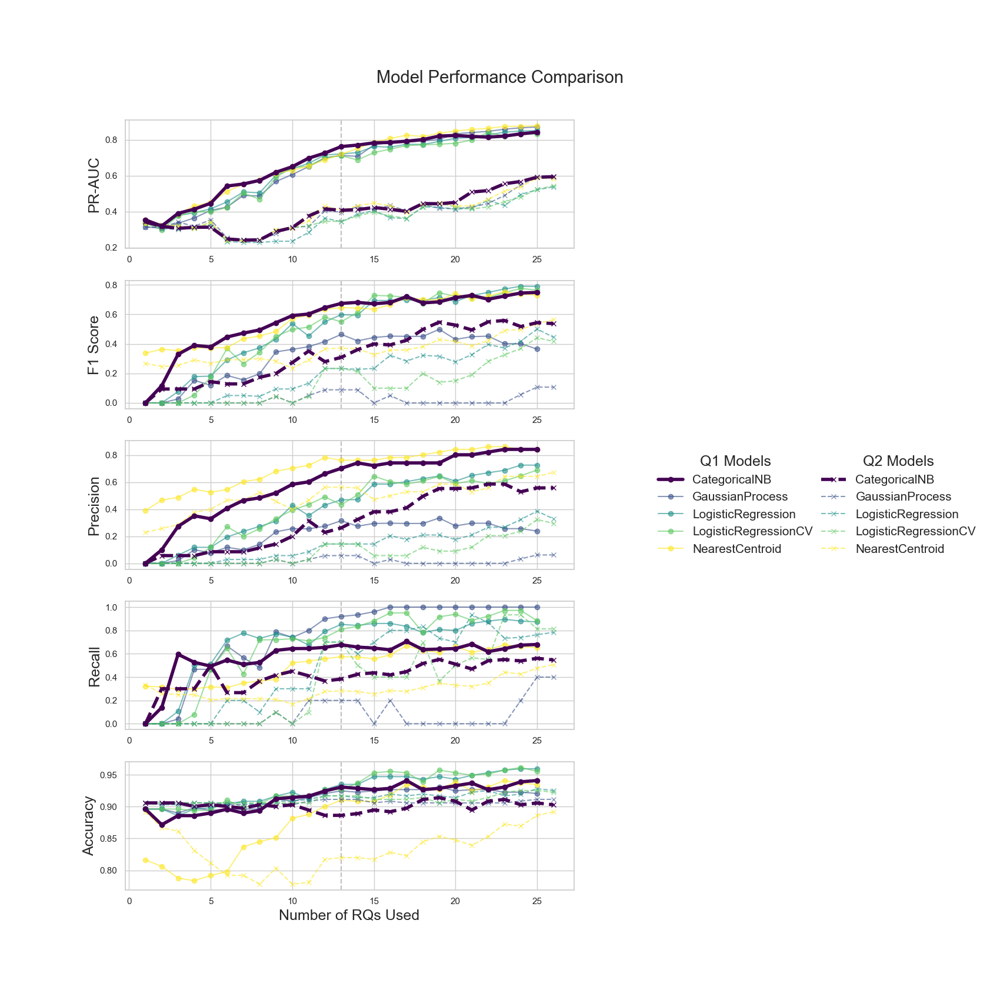

In [ ]:
def rank_models(results, metric, top_k=5, higher_is_better=True):
    """ Ranks models based on their performance on a specific metric.
        Returns the top_k models with their average metric value across all k RQs.
    """
    model_scores = {}
    
    for model, info in results.items():
        if metric in info:
            x = [i for i in info[metric] if i is not None]
            avg_score = np.mean(x)
            model_scores[model] = avg_score
    
    # Sort models based on score
    sorted_models = sorted(model_scores.items(), key=lambda x: x[1], reverse=higher_is_better)
    
    return sorted_models[:top_k]

# PR-AUC at 13 RQs rankings for Q1

def rank_df_based_on_metric(
    quarter="Q1",
    metric="pr_auc",
    rqs=13,
):
    results = results1_bin if quarter == "Q1" else results2_bin
    ranked_df = []

    for model, info in results.items():
        try:
            metric_at_k = info[metric][rqs - 1]  # rqs-1 because of 0-indexing
        except IndexError:
            print(f"{model}: Not enough data points to get {metric} at {rqs} RQs")
            metric_at_k = 0
        ranked_df.append({'model': model, f'{metric}_at_{rqs}_RQs': metric_at_k})
    
    ranked_df = pd.DataFrame(ranked_df).sort_values(by=f'{metric}_at_{rqs}_RQs', ascending=False)
    return ranked_df


def filter_models_by_threshold(df, limits):
    """ Filters the DataFrame of models based on specified metric thresholds."""
    
    metrics = ['accuracy', 'precision', 'recall', 'f1', 'pr_auc']
    models = list(results1_bin.keys())

    dfs = {}
    for metric in metrics:
        dfs[metric] = rank_df_based_on_metric(metric=metric)
    full_df = dfs[metrics[0]]
    for i in range(1, len(metrics)):
        full_df = full_df.merge(dfs[metrics[i]], on='model')
        
    for metric, threshold in limits.items():
        df = df[df[f'{metric}_at_13_RQs'] >= threshold]

    return df

limits = {
    'accuracy': 0,#0.5,
    'precision': 0,#.5,
    'recall': 0,#.5,
    'f1': 0,#.5,
    'pr_auc': .65
}

ranked_df = rank_df_based_on_metric()
pr_auc_top = ranked_df['model'].to_list()[:5]

# print(models_to_plot)
# models_to_plot = set([m for sublist in models_to_plot for m, s in sublist])

f = plot_errors_gs(
    results1_bin,
    results2_bin,
    ylim=None,
    figsize=(17, 17),
    fontsize=15,
    width_ratios=[5, 1, 1],
    limit_models_to=pr_auc_top,
)

# mpld3.save_html(f, "out/model_comparison_binary_interactive_top.html")
f.savefig('out/model_comparison/binary_top_pr_auc_13_rqs.png', dpi=300)


In [ ]:
metrics = ['accuracy', 'precision', 'recall', 'f1', 'pr_auc']

## one instance of filtered_df - current main fig plot

ClassifierChain: Not enough data points to get accuracy at 13 RQs
NuSVC: Not enough data points to get accuracy at 13 RQs
SelfTrainingClassifier: Not enough data points to get accuracy at 13 RQs
ClassifierChain: Not enough data points to get precision at 13 RQs
NuSVC: Not enough data points to get precision at 13 RQs
SelfTrainingClassifier: Not enough data points to get precision at 13 RQs
ClassifierChain: Not enough data points to get recall at 13 RQs
NuSVC: Not enough data points to get recall at 13 RQs
SelfTrainingClassifier: Not enough data points to get recall at 13 RQs
ClassifierChain: Not enough data points to get f1 at 13 RQs
NuSVC: Not enough data points to get f1 at 13 RQs
SelfTrainingClassifier: Not enough data points to get f1 at 13 RQs
ClassifierChain: Not enough data points to get pr_auc at 13 RQs
LinearSVC: Not enough data points to get pr_auc at 13 RQs
NuSVC: Not enough data points to get pr_auc at 13 RQs
PassiveAggressiveClassifier: Not enough data points to get pr_auc

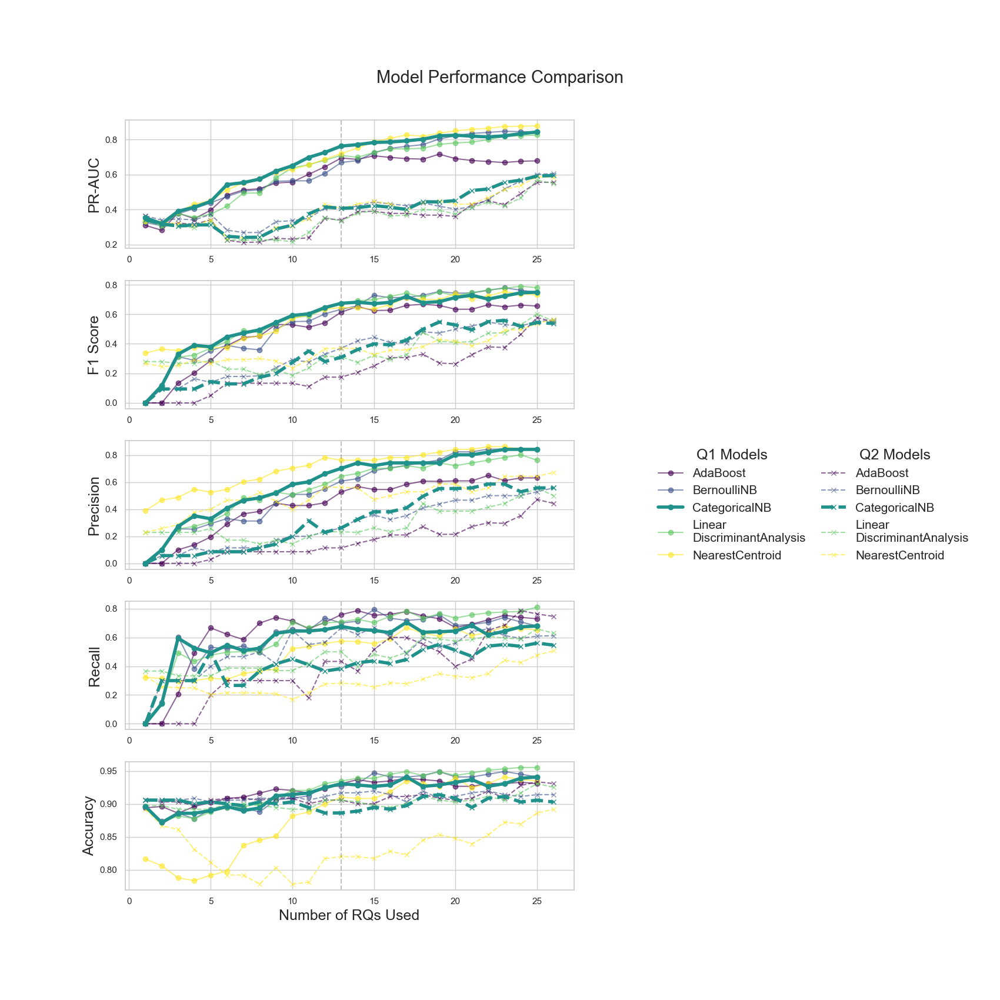

In [ ]:
metrics = ['accuracy', 'precision', 'recall', 'f1', 'pr_auc']
models = list(results1_bin.keys())

dfs = {}
for metric in metrics:
    dfs[metric] = rank_df_based_on_metric(metric=metric)
full_df = dfs[metrics[0]]
for i in range(1, len(metrics)):
    full_df = full_df.merge(dfs[metrics[i]], on='model')
    
LIMITS = {
    'accuracy': .5,
    'precision': .5,
    'recall': .5,
    'f1': .5,
    'pr_auc': .6
}

def filter_models_by_threshold(df, limits):
    for metric, threshold in limits.items():
        df = df[df[f'{metric}_at_13_RQs'] >= threshold]
    return df

filtered_df = filter_models_by_threshold(full_df, LIMITS)
top_models = filtered_df['model'].tolist()

# Current main plot for paper
f = plot_errors_gs(
    results1_bin,
    results2_bin,
    figsize=(17, 17),
    fontsize=15,
    width_ratios=[5, 1, 1],
    limit_models_to=top_models,
)
fname = 'binary_top_multi_metric_13_rqs'
f.savefig(f'out/model_comparison/{fname}.png', dpi=300)
f.savefig(f'out/model_comparison/{fname}.svg', dpi=300)

In [ ]:
def save_top_models_to_csv(df, fname, trim_to_n_decimals=2, sep='\t'):
    if trim_to_n_decimals==2:
        df.to_csv(fname, float_format="%.2f", index=False, sep=sep) 
    elif trim_to_n_decimals==3:
        df.to_csv(fname, float_format="%.3f", index=False, sep=sep) 
    elif trim_to_n_decimals==4:
        df.to_csv(fname, float_format="%.4f", index=False, sep=sep)
    else:
        df.to_csv(fname, index=False, sep=sep)

cols = {
    'model':'Model', 
    'pr_auc_at_13_RQs':'PR-AUC',
    'f1_at_13_RQs':'F1', 
    'recall_at_13_RQs':'Recall', 
    'precision_at_13_RQs':'Precision', 
    'accuracy_at_13_RQs':'Acc', 
}

def rename_and_sort_cols(full_df, cols, 
        remove_nonzero=True,
        sort=True,
        replace_class=False,
        replace_da=False):
    """ Renames columns based on the provided mapping and optionally 
        filters and sorts the DataFrame.
    """
    
    if remove_nonzero:
        df = full_df[full_df['pr_auc_at_13_RQs'] >= .01]
    else:
        df = full_df.copy()
        
    if sort:
        df = df.sort_values(by='pr_auc_at_13_RQs', ascending=False)
        
    if replace_class:
        df['model'] = df['model'].str.replace('Classifier', '', regex=False)
        
    if replace_da:
        df['model'] = df['model'].str.replace('DiscriminantAnalysis', '\nDiscriminantAnalysis', regex=False)
        
    df = df[cols.keys()]
    df = df.rename(columns=cols)
    return df

def apply_rename_dict(df):
    
    model_dict = {
        "CategoricalNB": "CategoricalNB",
        "NearestCentroid": "NearestCentroid",
        "LinearDiscriminantAnalysis": "Linear DA",
        "AdaBoost": "AdaBoost",
        "BernoulliNB": "BernoulliNB",
        "LogisticRegression": "LogisticRegression",
        "GaussianProcess": "GaussianProcess",
        "LogisticRegressionCV": "Logistic RegressionCV",
        "CalibratedCV": "CalibratedCV",
        "GaussianNB": "GaussianNB",
        "RandomForest": "RandomForest",
        "QuadraticDiscriminantAnalysis": "Quadratic DA",
        "MLP": "MLP",
        "HistGradientBoosting": "HistGradientBoosting",
        "KNeighbors": "KNeighbors",
        "ExtraTrees": "ExtraTrees",
        "Bagging": "Bagging",
        "GradientBoosting": "GradientBoosting",
        "DecisionTree": "DecisionTree",
        "LabelSpreading": "LabelSpreading",
        "ExtraTree": "ExtraTree",
        "LabelPropagation": "LabelPropagation",
        "ComplementNB": "ComplementNB"
    }
    
    df['Model'] = df['Model'].map(model_dict).fillna(df['Model'])
    return df

In [ ]:
# Sorted by just PR-AUC at 13 RQs, but includes all the other metrics 
df = rename_and_sort_cols(full_df, cols)
fname = 'out/model_comparison/model_ranking_full_at_13_RQs.csv'
save_top_models_to_csv(df, fname, trim_to_n_decimals=2)

# Get list of models sorted by PR-AUC at 13 RQs, not ones that have 0s
zero_limits = {l: 0.1 for l in LIMITS.keys()}
df_by_prauc_no_zeros = filter_models_by_threshold(full_df, zero_limits)
df_by_prauc_sorted = rename_and_sort_cols(df_by_prauc_no_zeros, cols, remove_nonzero=True)
models_by_prauc = df_by_prauc_sorted['Model'].tolist()

# Then get models that pass limit, sorted by PR-AUC at 13 RQs
# but only keep models that don't have 0 values for any metric at 13 RQs
limit_df = filter_models_by_threshold(full_df, LIMITS)
limit_df_renamed = rename_and_sort_cols(limit_df, cols, remove_nonzero=True)
models_by_limits = limit_df_renamed['Model'].tolist()

# Combine the two lists, ensuring models that pass limits come first
result_model_order = models_by_limits + [m for m in models_by_prauc if m not in models_by_limits]

# Apply this order to the full DataFrame
full_df_sorted = full_df.set_index('model').loc[result_model_order].reset_index()
full_df_sorted = rename_and_sort_cols(full_df_sorted, cols, 
                                      remove_nonzero=True, 
                                      sort=False, 
                                      replace_class=True,
                                      replace_da=False)
full_df_sorted = apply_rename_dict(full_df_sorted)



fname = 'out/model_comparison/model_ranking_full_at_13_RQ_limits_then_prauc_sorted.csv'
save_top_models_to_csv(full_df_sorted, fname, trim_to_n_decimals=2)

full_df_sorted

,Model,PR-AUC,F1,Recall,Precision,Acc
0,CategoricalNB,0.763519,0.674520,0.701818,0.676757,0.930653
1,NearestCentroid,0.720526,0.646188,0.761818,0.574734,0.910266
2,Linear DA,0.710242,0.669577,0.643636,0.708514,0.934735
3,AdaBoost,0.695329,0.614585,0.527273,0.758730,0.930695
4,BernoulliNB,0.669667,0.634040,0.607273,0.700855,0.926613
5,LogisticRegression,0.722453,0.598240,0.469091,0.851667,0.934797
6,GaussianProcess,0.714020,0.464615,0.314545,0.920000,0.924655
7,Logistic RegressionCV,0.712319,0.549841,0.432727,0.810000,0.926675
8,CalibratedCV,0.711411,0.541905,0.392727,0.893333,0.930757
9,GaussianNB,0.706480,0.540698,0.840000,0.407763,0.845042


In [ ]:
vc = df1_sel['atrisk'].value_counts()
print(vc)
print(f"TN: {vc.iloc[0] / vc.sum()}\nTP: {vc.iloc[1] / vc.sum()}\n\n")

vc = df2_sel['atrisk'].value_counts()
print(vc)
print(f"TN: {vc.iloc[0] / vc.sum()}\nTP: {vc.iloc[1] / vc.sum()}\n\n")




atrisk
False    440
True      51
Name: count, dtype: int64
TN: 0.8961303462321792
TP: 0.10386965376782077


atrisk
False    327
True      34
Name: count, dtype: int64
TN: 0.9058171745152355
TP: 0.09418282548476455




## Saving logic


In [ ]:

fname = 'out/model_comparison/binary_top_multi_metric_13_rqs.csv'
cols = [
    'model', 
    'pr_auc_at_13_RQs',
    'precision_at_13_RQs', 
    'f1_at_13_RQs', 
    'recall_at_13_RQs', 
    'accuracy_at_13_RQs', 
]
filtered_df = filtered_df.sort_values(by='pr_auc_at_13_RQs', ascending=False)
filtered_df = filtered_df[cols]
save_top_models_to_csv(filtered_df, fname)

[[('CCA', np.float64(nan)), ('GammaRegressor', np.float64(nan))], [('CCA', np.float64(nan)), ('GammaRegressor', np.float64(nan))], [('BayesianRidge', np.float64(0.5049954301790944)), ('CCA', np.float64(nan))], [('CCA', np.float64(nan)), ('GaussianProcessRegressor', np.float64(170.40271095610254))], [('CCA', np.float64(nan)), ('GaussianProcessRegressor', np.float64(49.21542725283934))], [('CCA', np.float64(nan)), ('LassoLarsCV', np.float64(0.22459090716906555))]]
[<matplotlib.lines.Line2D object at 0x1ab382390>, <matplotlib.lines.Line2D object at 0x1ab4268d0>, <matplotlib.lines.Line2D object at 0x1ab427710>, <matplotlib.lines.Line2D object at 0x1ab450470>, <matplotlib.lines.Line2D object at 0x1ab450e30>, <matplotlib.lines.Line2D object at 0x1ab451a30>, <matplotlib.lines.Line2D object at 0x1ab4525a0>] ['BayesianRidge', 'GaussianProcessRegressor', 'LassoLarsCV', 'BayesianRidge', 'GammaRegressor', 'GaussianProcessRegressor', 'LassoLarsCV']


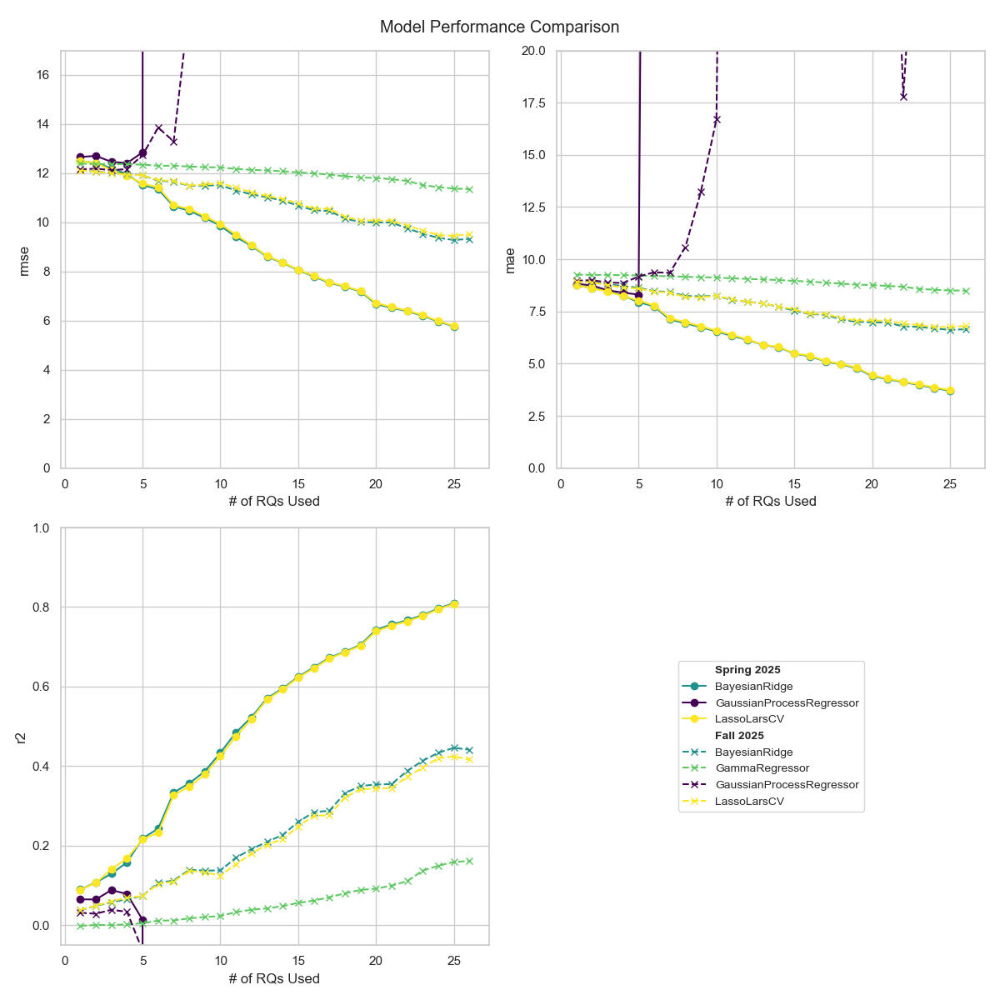

In [ ]:
# models_to_plot = []
# for d in results1_reg, results2_reg:
    
#     for error in errors_reg:
        
#         ranked = rank_models(d, error, top_k=2, higher_is_better=True)
#         models_to_plot.append(ranked)
        
# # r1 = rank_models(results1_bin, 'recall', top_k=5, higher_is_better=True)
# # r2 = rank_models(results2_bin, 'recall', top_k=5, higher_is_better=True)
# print(models_to_plot)
# models_to_plot = set([m for sublist in models_to_plot for m, s in sublist])
# f = plot_errors(results1_reg, results2_reg, 
#                 errors_reg, 
#                 nrows=2, 
#                 ncols=2, 
#                 scale=6,
#                 # threshold={'recall': 0.4},
#                 # thresh_direction='higher'
#                 ylim={'rmse': (0, 17), 'mae': (0, 20), 'r2': (-.05, 1)},
#                 limit_models_to=models_to_plot,
#                 fontsize=10
# )

# # mpld3.save_html(f, "out/model_comparison_binary_interactive_top.html")
# f.savefig('out/model_comparison/regression_top2.png', dpi=300)

In [ ]:
result_files = [
    'out/model_comparison/accuracy.csv',
    'out/model_comparison/precision.csv',
    'out/model_comparison/recall.csv',
    'out/model_comparison/f1.csv',
    'out/model_comparison/pr_auc.csv',
]

result_dict = {}
for f in result_files:
    metric = f.split('/')[-1].split('.')[0]
    df = pd.read_csv(f)

    for model in df.columns:
        if model == 'x':
            continue
        
        if model not in result_dict:
            result_dict[model] = {}
        result_dict[model][metric] = df[model].values
        
result_dict

{'AdaBoostClassifier': {'accuracy': array([0.90582192, 0.90304414, 0.90304414, 0.89748858, 0.90582192,
         0.90852359, 0.90852359, 0.90574581, 0.90852359, 0.90852359,
         0.90030441, 0.90578387, 0.90578387, 0.90026636, 0.90022831,
         0.91130137, 0.91130137, 0.9141172 , 0.90856164, 0.90578387,
         0.90852359, 0.91959665, 0.90856164, 0.92789193, 0.93352359,
         0.93078387]),
  'precision': array([0.        , 0.        , 0.        , 0.        , 0.2       ,
         0.3       , 0.3       , 0.3       , 0.3       , 0.3       ,
         0.18      , 0.43333333, 0.43333333, 0.36666667, 0.51666667,
         0.6       , 0.6       , 0.55333333, 0.5       , 0.4       ,
         0.45      , 0.65      , 0.68571429, 0.78666667, 0.76333333,
         0.74666667]),
  'recall': array([0.        , 0.        , 0.        , 0.        , 0.02857143,
         0.08571429, 0.08571429, 0.08571429, 0.08571429, 0.08571429,
         0.08571429, 0.11428571, 0.11428571, 0.14761905, 0.17619048,


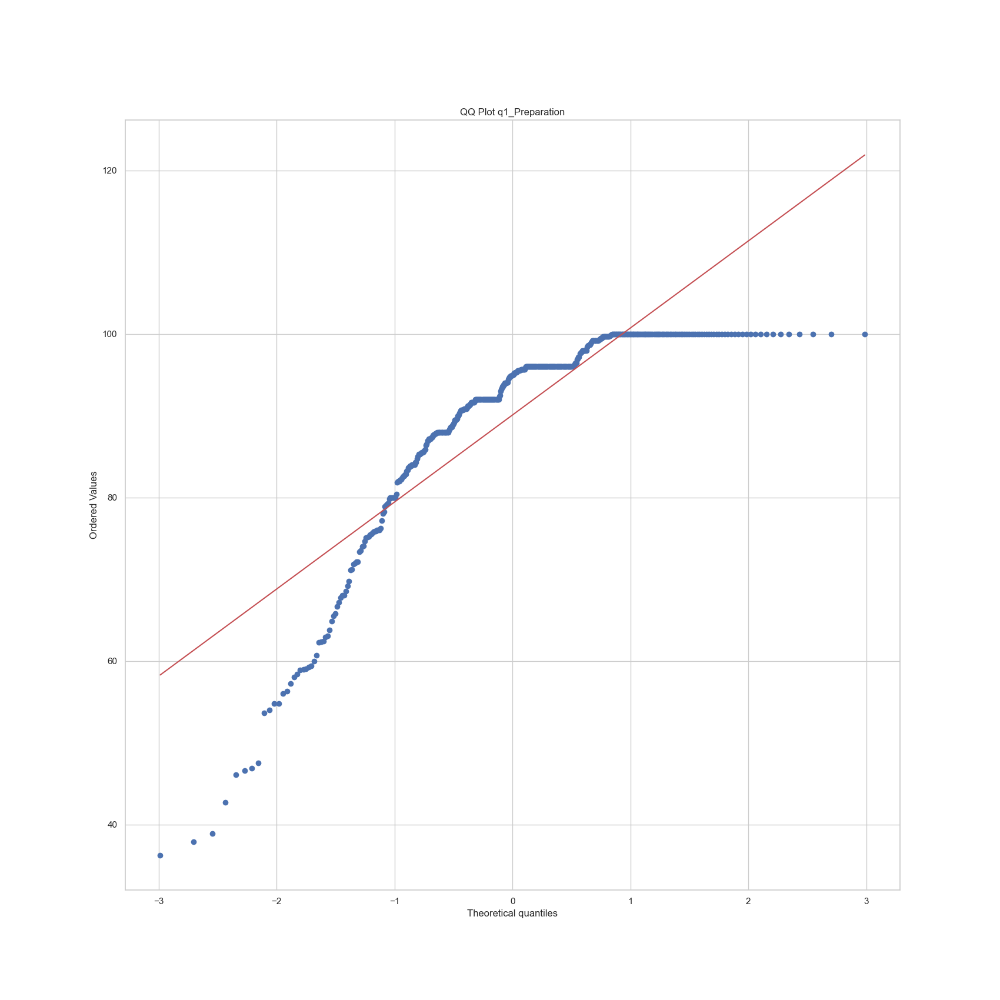

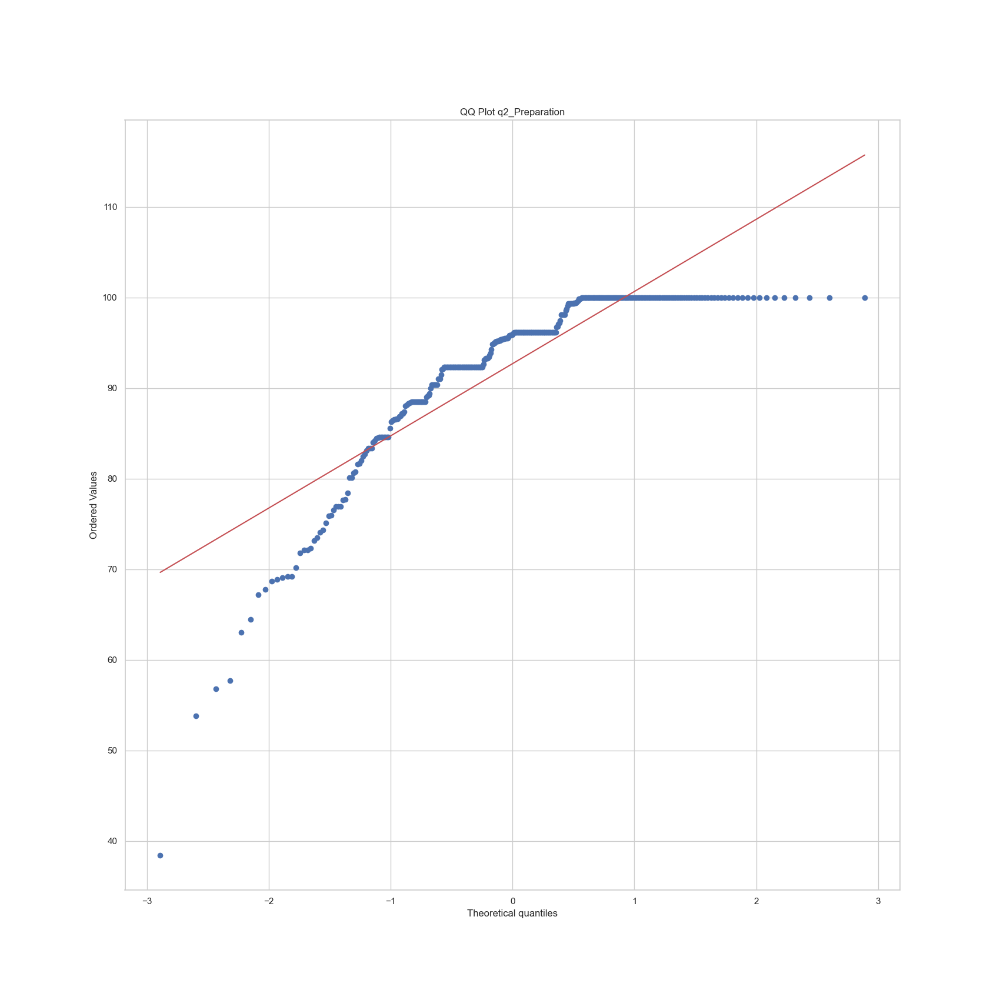

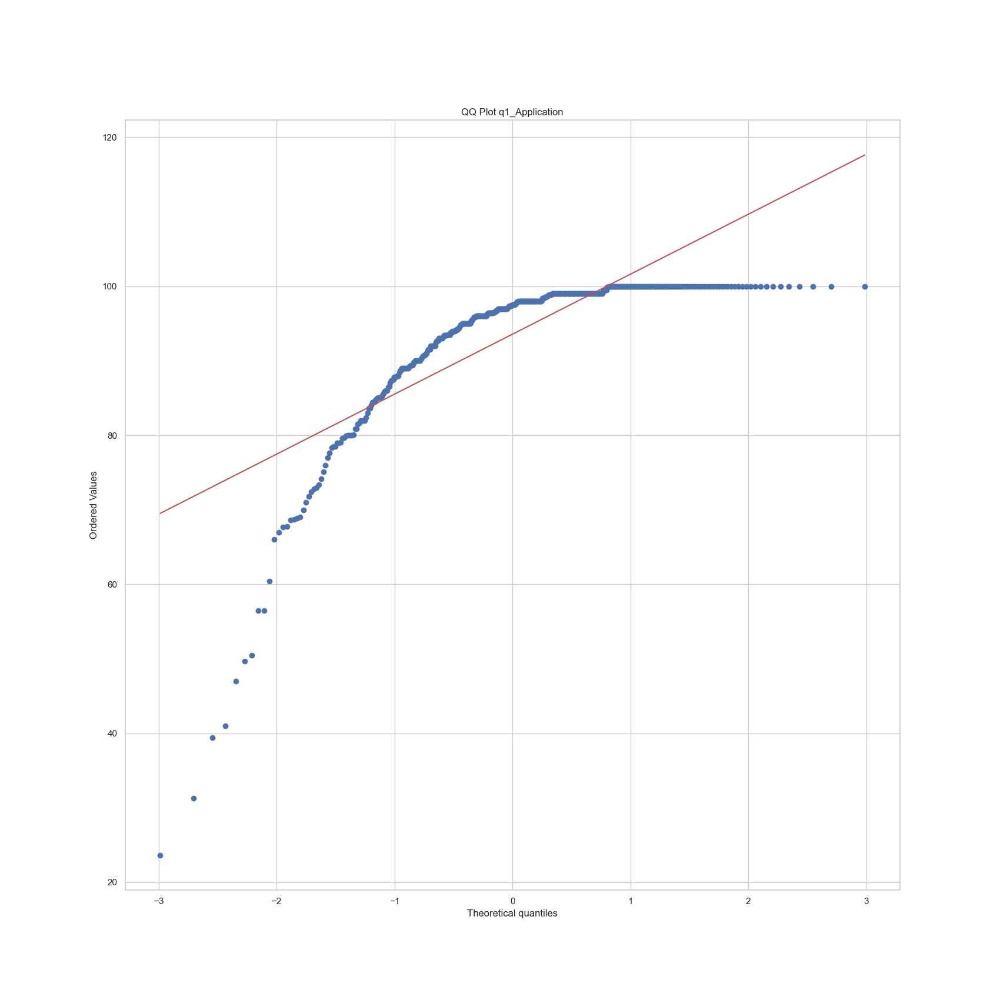

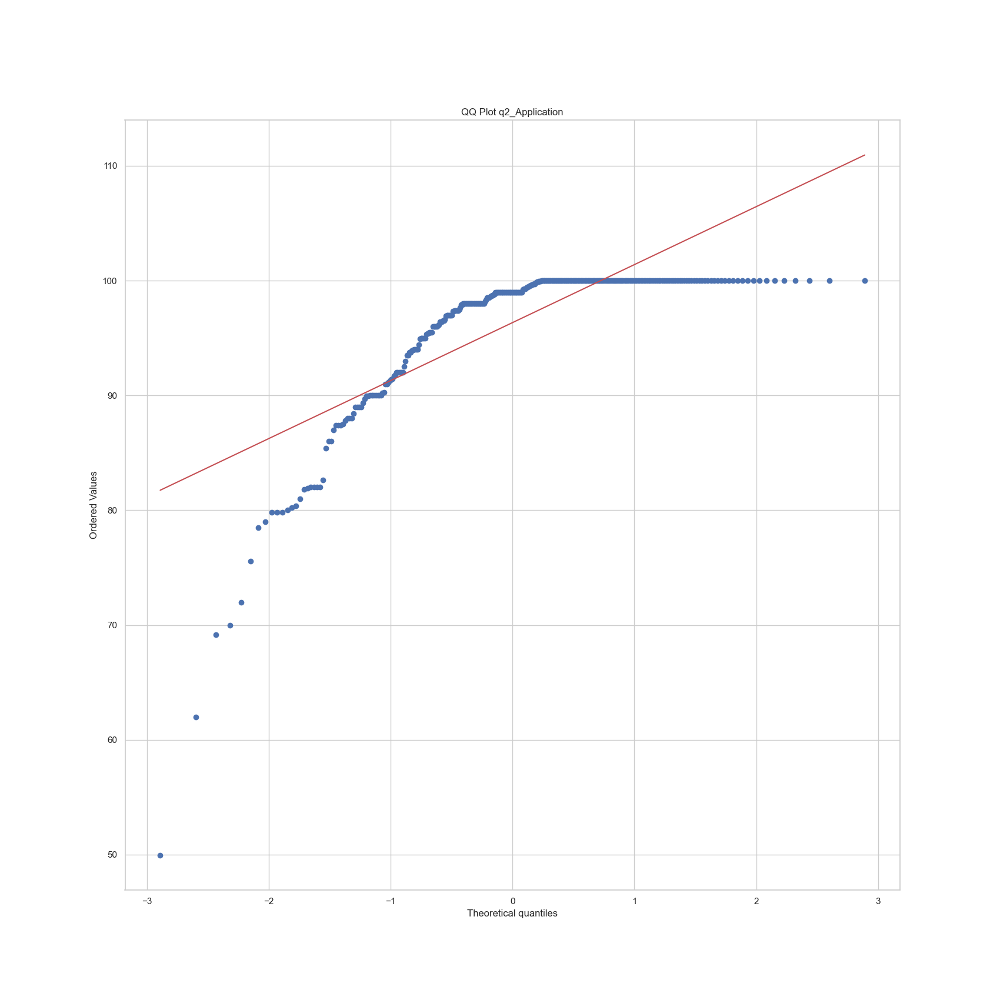

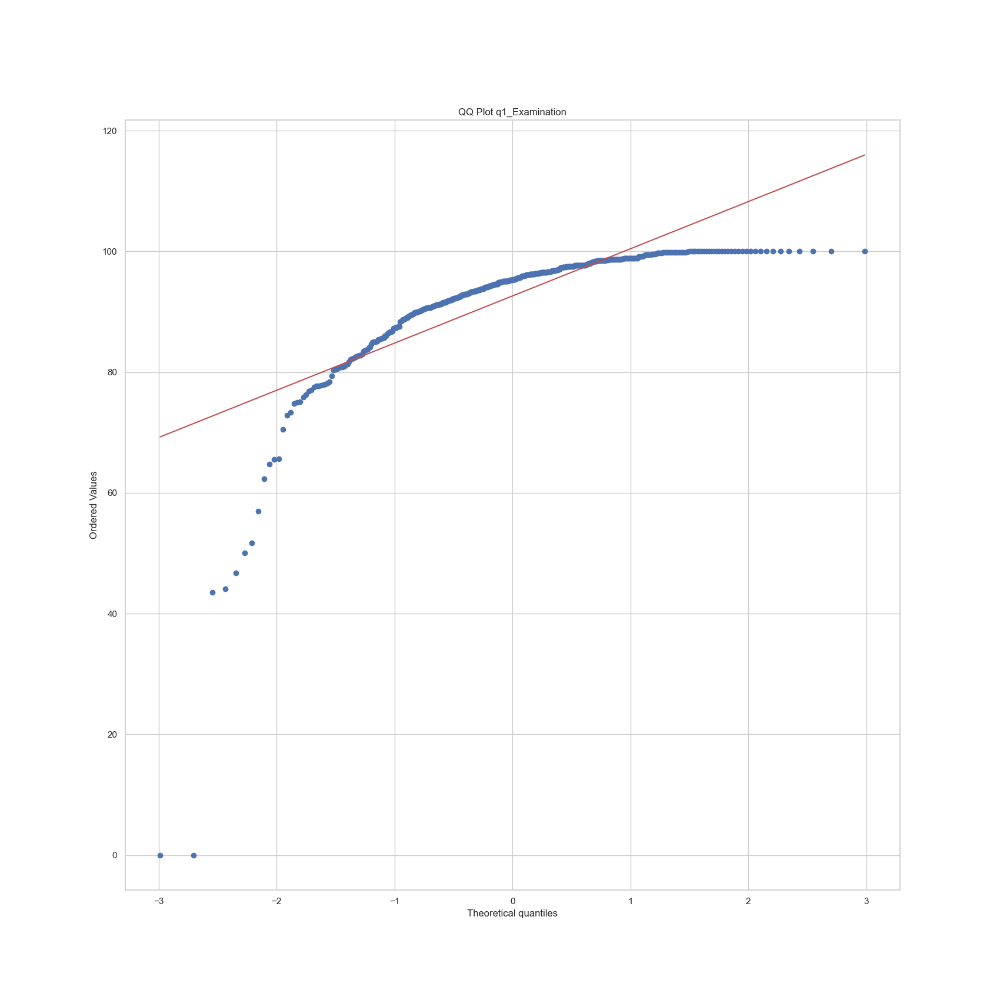

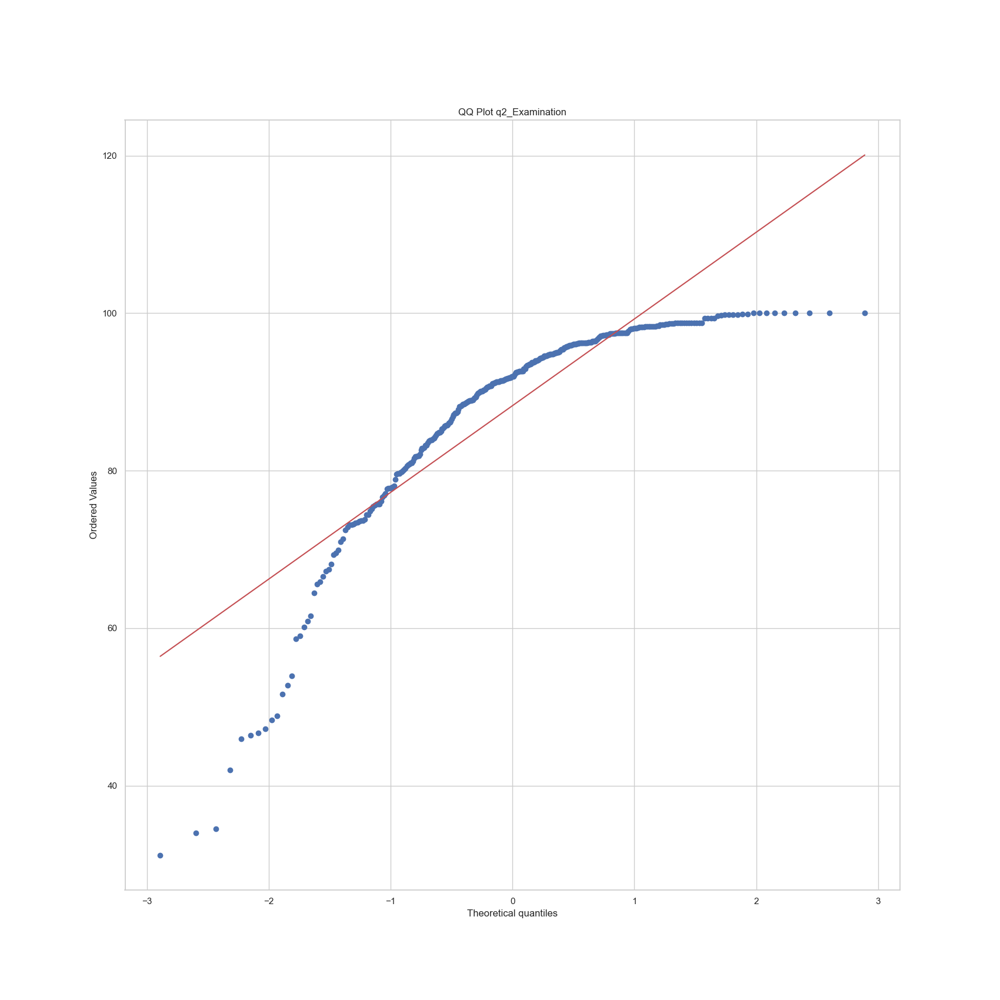

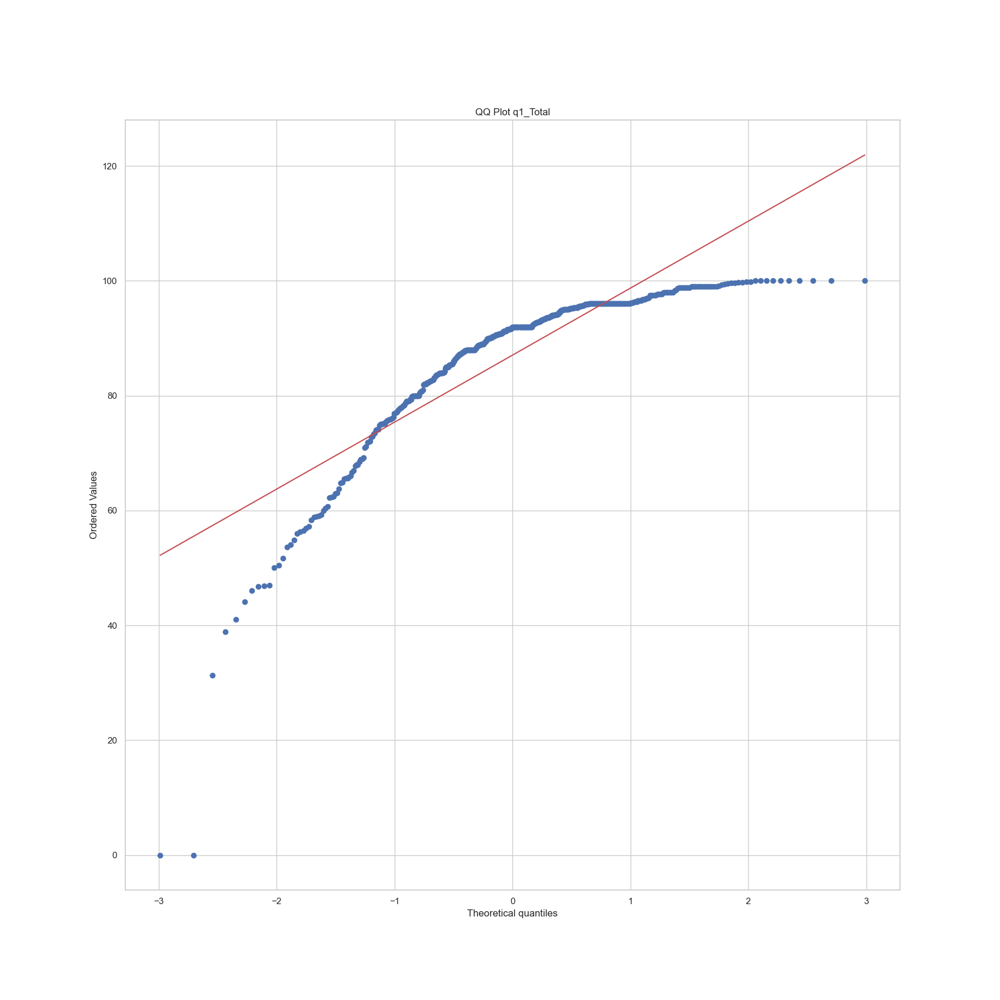

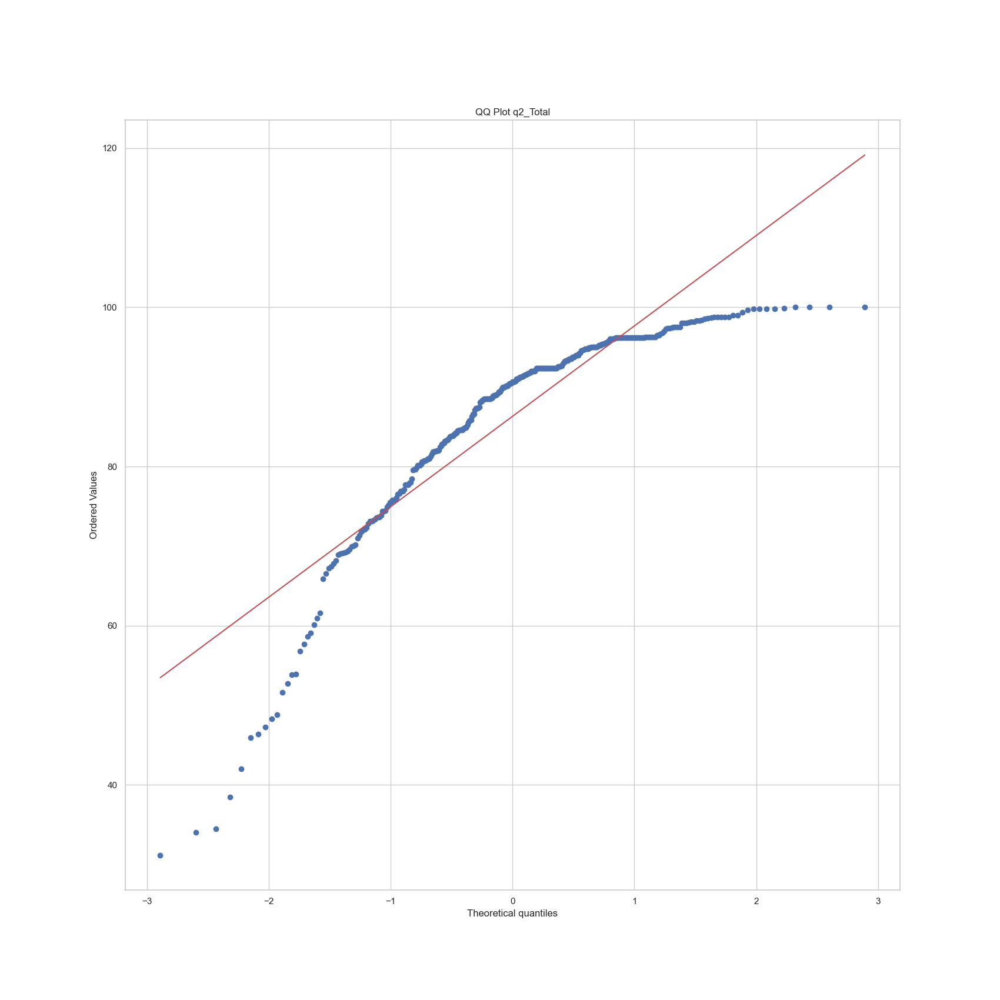

In [ ]:
from contextlib import redirect_stdout

import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

def check_normality(data, fname=""):
    data = np.asarray(data)

    print("=== Normality Checks ===")

    # Shapiro-Wilk
    stat, p = stats.shapiro(data)
    print(f"Shapiro-Wilk p={p:.4g}")

    # D’Agostino’s K²
    stat, p = stats.normaltest(data)
    print(f"D'Agostino K² p={p:.4g}")

    # Anderson-Darling
    result = stats.anderson(data)
    print(f"Anderson-Darling stat={result.statistic:.4g}")
    for sl, cv in zip(result.significance_level, result.critical_values):
        print(f"  {sl}%: {cv}")

    # QQ plot
    plt.clf()

    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f"QQ Plot {fname}")
    plt.savefig(f"out/stats/normality/norm_{fname}.png")
    plt.show()
    
stats_f = 'out/stats/normality/normality_checks.txt'
with open(stats_f, 'w') as f:
    with redirect_stdout(f):
        for x in ['Preparation', 'Application', 'Examination', 'Total']:
            print(f"\n--- Checking normality for Q1 {x} ---")
            check_normality(df1_sel[x], fname=f"q1_{x}")
            
            print(f"\n--- Checking normality for Q2 {x} ---")
            check_normality(df2_sel[x], fname=f"q2_{x}")

### Simulation

Quarter      Fall 2025  Winter 2025  Fall minus Winter
Preparation      92.31        89.76               2.55
Application      94.84        92.40               2.44
Examination      85.76        88.61              -2.85
Overall          82.88        83.67              -0.80


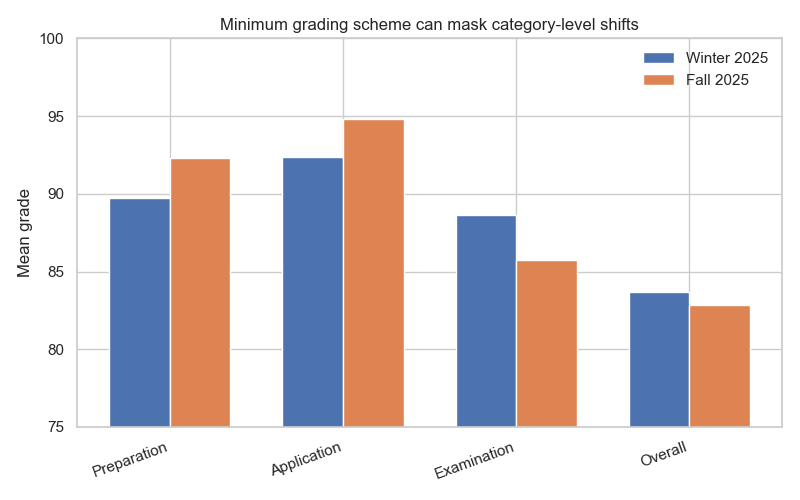

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

np.random.seed(42)

n_students = 400

# Winter grades
winter_prep = np.random.normal(90, 8, n_students)
winter_app = np.random.normal(93, 6, n_students)
winter_exam = np.random.normal(88, 10, n_students)

# Fall grades:
# prep/app increase, exam decreases
fall_prep = winter_prep + np.random.normal(3, 3, n_students)
fall_app = winter_app + np.random.normal(3, 3, n_students)
fall_exam = winter_exam + np.random.normal(-3, 3, n_students)

# Keep grades between 0 and 100
winter_prep = np.clip(winter_prep, 0, 100)
winter_app = np.clip(winter_app, 0, 100)
winter_exam = np.clip(winter_exam, 0, 100)

fall_prep = np.clip(fall_prep, 0, 100)
fall_app = np.clip(fall_app, 0, 100)
fall_exam = np.clip(fall_exam, 0, 100)

# Final grade = minimum category grade
winter_overall = np.minimum.reduce([winter_prep, winter_app, winter_exam])
fall_overall = np.minimum.reduce([fall_prep, fall_app, fall_exam])

df = pd.DataFrame({
    "Quarter": ["Winter 2025"] * n_students + ["Fall 2025"] * n_students,
    "Preparation": np.concatenate([winter_prep, fall_prep]),
    "Application": np.concatenate([winter_app, fall_app]),
    "Examination": np.concatenate([winter_exam, fall_exam]),
    "Overall": np.concatenate([winter_overall, fall_overall])
})

summary = df.groupby("Quarter")[[
    "Preparation", "Application", "Examination", "Overall"
]].mean().T

summary["Fall minus Winter"] = (
    summary["Fall 2025"] - summary["Winter 2025"]
)

print(summary.round(2))

# Plot
categories = ["Preparation", "Application", "Examination", "Overall"]
x = np.arange(len(categories))
width = 0.35

plt.figure(figsize=(8, 5))

plt.bar(
    x - width / 2,
    summary.loc[categories, "Winter 2025"],
    width,
    label="Winter 2025"
)

plt.bar(
    x + width / 2,
    summary.loc[categories, "Fall 2025"],
    width,
    label="Fall 2025"
)

plt.xticks(x, categories, rotation=20, ha="right")
plt.ylabel("Mean grade")
plt.ylim(75, 100)
plt.title("Minimum grading scheme can mask category-level shifts")
plt.legend(frameon=False)
plt.tight_layout()
plt.savefig("out/simulation/min_grading_masking.png", dpi=300)
plt.show()

In [ ]:
import pandas as pd
from scipy.stats import chi2_contingency

quarter = "Q2"

dfs = {
    "Q1": df1_sel,
    "Q2": df2_sel,
    "Total": pd.concat([df1_sel, df2_sel], ignore_index=True)
}
df = dfs[quarter]
idx_map = {
    True:  f"Failing {quarter}",
    False: f"Passing {quarter}"
}

# Create contingency table
cont_table = pd.crosstab(
    df['atrisk'],
    df['min_category']
)

# Chi-square test
chi2, p, dof, expected = chi2_contingency(cont_table)

def ast_if_sig(p, threshold=0.05):
    if p > .0001 and p <= threshold:
        return "*"
    elif p <= .0001 and p > .000001:
        return "**"
    elif p <= .000001:
        return "***"
    else:
        return ""

print(f"Chi-square statistic: {chi2:.4f}")
print(f"p-value: {ast_if_sig(p)} {p:.2e}")
print(f"Degrees of freedom: {dof}\n")

# # Expected frequencies
# expected_df = pd.DataFrame(
#     expected,
#     index=cont_table.index,
#     columns=cont_table.columns
# )

rows = []
df = cont_table

for idx, row in df.iterrows():
    rows.append(
        pd.DataFrame(
            [row], 
            index=[f"{idx_map[idx]} (n={row.sum()})"]))

    props = (row / row.sum() * 100).round(1)
    props = props.map(lambda x: f"{x:.1f}%")
    rows.append(pd.DataFrame([props], index=["%"]))

result = pd.concat(rows)
print(result)
result[['Preparation', 'Application', 'Examination']]

Chi-square statistic: 2.6889
p-value:  2.61e-01
Degrees of freedom: 2

min_category       Application Examination Preparation
Passing Q2 (n=327)          28         197         102
%                         8.6%       60.2%       31.2%
Failing Q2 (n=34)            1          25           8
%                         2.9%       73.5%       23.5%


min_category,Preparation,Application,Examination
Passing Q2 (n=327),102,28,197
%,31.2%,8.6%,60.2%
Failing Q2 (n=34),8,1,25
%,23.5%,2.9%,73.5%


In [ ]:
df1_sel

NameError: name 'df1_sel' is not defined

cont_table

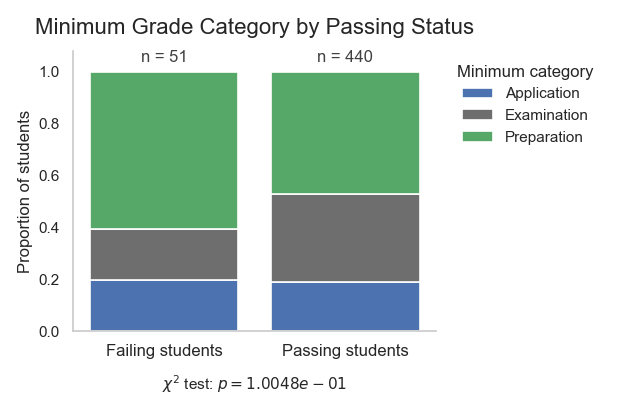

In [ ]:
# Set desired course order
course_order = [True, False]
labels = {
    True: "Failing students",
    False: "Passing students"
}
df = df1_sel
# Set category order explicitly
cat_order = ["Application", "Examination", "Preparation"]

# Counts
counts = (
    df
    .groupby(["atrisk", "min_category"])
    .size()
    .unstack(fill_value=0)
    .reindex(course_order)
    .reindex(columns=cat_order)
)

# Proportions
props = counts.div(counts.sum(axis=1), axis=0)

fig, ax = plt.subplots(figsize=(6.2, 4.2))

bottom = np.zeros(len(props))

# Muted, publication-friendly colors
color_map = {
    "Application": "#4C72B0",
    "Examination": "#6E6E6E",
    "Preparation": "#55A868"
}

x = np.arange(len(props.index))

for cat in cat_order:
    ax.bar(
        x,
        props[cat],
        bottom=bottom,
        label=cat,
        color=color_map[cat],
        edgecolor="white",
        linewidth=1.2,
        width=0.82
    )
    bottom += props[cat].values

# Add n labels above bars
ns = counts.sum(axis=1)

for i, course in enumerate(props.index):
    ax.text(
        i,
        1.025,
        f"n = {ns.loc[course]}",
        ha="center",
        va="bottom",
        fontsize=12,
        color="0.25"
    )

ax.set_title("Minimum Grade Category by Passing Status", fontsize=16, pad=12)
ax.set_ylabel("Proportion of students", fontsize=12)
ax.set_xlabel("")
ax.set_ylim(0, 1.08)

ax.set_xticks(x)
ax.set_xticklabels([labels[c] for c in props.index], fontsize=12)

# Clean axes
ax.spines[["top", "right"]].set_visible(False)
ax.grid(axis="y", alpha=0.25)
ax.set_axisbelow(True)

# Better p-value formatting
ax.text(
    0.5, -0.152,
    r"$\chi^2$ test: $p =  {p:.4e}$".format(p=p),
    transform=ax.transAxes,
    ha="center",
    va="top",
    fontsize=11
)

# Legend outside
ax.legend(
    title="Minimum category",
    frameon=False,
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    fontsize=11,
    title_fontsize=12,
)
ax.grid(False)

plt.tight_layout()
plt.savefig("out/min_category_by_atrisk.png", bbox_inches="tight", dpi=300)
plt.savefig("out/min_category_by_atrisk.svg", bbox_inches="tight")
plt.show()